A simplefied architecture for stain 2 stain translation with leave one marker out:
- ResNet50 encoder (input 3D rgb via pca)
- U‑Net decoder

To do:
- finish 5 fold with J and then D. Maybe save results per marker (instead of loop over all)

# Imports

In [1]:
!pip install pytorch_msssim
!pip install imagecodecs
!pip install torchmetrics
!pip install torch-fidelity


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.7/26.7 MB 43.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.2/983.2 kB 47.9 MB/s eta 0:00:00


In [2]:
!export PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True


In [29]:
import os
import psutil
import shutil
import numpy as np
import pandas as pd
import tifffile
import zipfile
import imagecodecs
import gc
import time
import glob
from collections import Counter
import cv2
import random
from scipy.stats import pearsonr
from sklearn.decomposition import PCA, IncrementalPCA
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import KFold
from sklearn.metrics import r2_score

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn.utils.parametrizations import weight_norm
from torch.utils.data import TensorDataset, DataLoader, random_split, Dataset
from torch.amp import GradScaler, autocast
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torchvision import models
from pytorch_msssim import ssim
from tqdm import tqdm
import torchvision.utils as vutils
from torchmetrics.image.fid import FrechetInceptionDistance

from google.colab import files
import matplotlib.pyplot as plt
params = {'axes.titlesize': 30,
          'legend.fontsize': 16,
          'figure.figsize': (16, 10),
          'axes.labelsize': 16,
          'axes.titlesize': 12,
          'xtick.labelsize': 16,
          'ytick.labelsize': 16,
          'figure.titlesize': 30}

plt.rcParams.update(params)
plt.style.use('seaborn-v0_8-whitegrid')

In [4]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(device)
print(torch.cuda.get_device_name(0))
print(f"Allocated: {torch.cuda.memory_allocated(0)/1024**2:.2f} MB")
print(f"Cached: {torch.cuda.memory_reserved(0)/1024**2:.2f} MB")
print(f"Max allocated: {torch.cuda.max_memory_allocated(0)/1024**2:.2f} MB")

cuda
Tesla T4
Allocated: 0.00 MB
Cached: 0.00 MB
Max allocated: 0.00 MB


In [5]:
!free -h

               total        used        free      shared  buff/cache   available
Mem:            12Gi       1.7Gi       6.3Gi       2.0Mi       4.7Gi        10Gi
Swap:             0B          0B          0B


# Functions

In [17]:
def print_memory_usage(stage=""):
    process = psutil.Process(os.getpid())
    mem = process.memory_info().rss / (1024 ** 2)  # in MB
    print(f"Memory usage {stage}: {mem:.2f} MB")

def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

In [18]:
def fit_preprocessing(
    train_files,
    target_idx,
    control_markers_indices,
    n_components=3,
    batch_size=100_000,
    cofactor=5.0,
    eps=1e-8,
):
    """
    Fit channel-wise regressions and incremental PCA on residuals from IMC training images with lazy loading.

    Args:
        train_files (list): Paths to training TIFF images.
        target_idx (int): Index of target channel.
        control_markers_indices (list): Indices of control marker channels.
        n_components (int): Number of PCA components.
        batch_size (int): Batch size for incremental PCA partial_fit.
        cofactor (float): Cofactor for arcsinh transform.
        eps (float): Small value to avoid division by zero.

    Returns:
        tuple: (regression_models, pca, pca_mean, pca_std, input_channels)
    """

    def to_hwc(img):
        if img.ndim == 2:
            img = img[..., None]
        if img.shape[0] < img.shape[1] and img.shape[0] < img.shape[2]:
            img = np.transpose(img, (1, 2, 0))
        return img.astype(np.float32, copy=False)

    input_channels = []
    X_controls, Y_targets = {}, {}

    # Pass 0: discover channels and gather regression data with lazy loading in smaller patches
    for fi, f in enumerate(train_files):
        #print(f"going over image: {fi}")
        img = to_hwc(tifffile.imread(f))
        H, W, C = img.shape

        if fi == 0:
            input_channels = [c for c in range(C) if c != target_idx and c not in control_markers_indices]
            if not input_channels:
                print(f"Warning: no inputs for target {target_idx} with controls {control_markers_indices}.")
                return None, None, None, None, input_channels
            for j in input_channels:
                X_controls[j] = []
                Y_targets[j] = []

        Xc = img[..., control_markers_indices].reshape(-1, len(control_markers_indices))
        for j in input_channels:
            y = img[..., j].reshape(-1)
            X_controls[j].append(Xc)
            Y_targets[j].append(y)

        #print_memory_usage(f"After processing image {fi}")

    # Pass 1: fit regressions
    #print("--Regression")
    #print_memory_usage()

    regression_models = {}
    for j in input_channels:
        X = np.concatenate(X_controls[j], axis=0)
        y = np.concatenate(Y_targets[j], axis=0)
        regression_models[j] = LinearRegression().fit(X, y)

    # Safety: n_components ≤ number of residual features (K)
    K = len(input_channels)
    if K == 0:
        return regression_models, None, None, None, input_channels
    if n_components > K:
        print(f"n_components {n_components} > residual dim {K}; using {K}.")
        n_components = K

    # Pass 2: fit IncrementalPCA on streamed residuals with lazy loading in batches

    #print("--PCA")
    #print_memory_usage()

    pca = IncrementalPCA(n_components=n_components)


    for f in train_files:
        img = to_hwc(tifffile.imread(f))
        Xc = img[..., control_markers_indices].reshape(-1, len(control_markers_indices))

        R = np.empty((Xc.shape[0], K), dtype=np.float32)
        for k, j in enumerate(input_channels):
            y = img[..., j].reshape(-1)
            y_pred = regression_models[j].predict(Xc)
            R[:, k] = y - y_pred.astype(np.float32, copy=False)

        R = np.arcsinh(R / cofactor, dtype=np.float32)

        for s in range(0, R.shape[0], batch_size):
            batch = R[s : s + batch_size]
            pca.partial_fit(batch)

    # Print variance captured by chosen PCs
    if hasattr(pca, "explained_variance_ratio_") and pca.explained_variance_ratio_ is not None:
        pct = pca.explained_variance_ratio_[:n_components].sum() * 100.0
        print(f"Projecting images to {n_components} PCs captures {pct:.2f}% of variance")

    # Pass 3: compute mean/std of PCA space (streamed with lazy loading)
    total = 0
    sum_z = np.zeros(n_components, dtype=np.float64)
    sumsq_z = np.zeros(n_components, dtype=np.float64)

    for f in train_files:
        img = to_hwc(tifffile.imread(f))
        Xc = img[..., control_markers_indices].reshape(-1, len(control_markers_indices))

        R = np.empty((Xc.shape[0], K), dtype=np.float32)
        for k, j in enumerate(input_channels):
            y = img[..., j].reshape(-1)
            y_pred = regression_models[j].predict(Xc)
            R[:, k] = y - y_pred.astype(np.float32, copy=False)

        R = np.arcsinh(R / cofactor, dtype=np.float32)
        for s in range(0, R.shape[0], batch_size):
            e = s + batch_size
            Z = pca.transform(R[s:e]).astype(np.float32)
            sum_z += Z.sum(axis=0)
            sumsq_z += (Z * Z).sum(axis=0)
            total += Z.shape[0]

    if total == 0:
        print("Warning: no residuals seen for PCA stats; using zeros/ones.")
        pca_mean = np.zeros(n_components, dtype=np.float32)
        pca_std = np.ones(n_components, dtype=np.float32) * eps
    else:
        pca_mean = (sum_z / total).astype(np.float32)
        var = (sumsq_z / total) - (pca_mean.astype(np.float64) ** 2)
        pca_std = (np.sqrt(np.maximum(var, 0.0)) + eps).astype(np.float32)

    return regression_models, pca, pca_mean, pca_std, input_channels


In [19]:
def apply_preprocessing(
    files,
    target_idx,
    control_markers_indices,
    regression_models,
    pca,
    pca_mean,
    pca_std,
    input_channels,
    n_components=3,
    cofactor=5.0,
    chunk_size=100_000
):
    """
    Apply fitted regression + PCA preprocessing to any set of images (train/val/test) with lazy loading.

    Args:
        files (list): List of TIFF file paths.
        target_idx (int): Index of target marker channel.
        control_markers_indices (list): Control marker channel indices.
        regression_models (dict): Trained linear regression models per channel.
        pca (IncrementalPCA): Fitted PCA object.
        pca_mean (np.ndarray): Mean vector of PCA components.
        pca_std (np.ndarray): Std vector of PCA components.
        input_channels (list): Indices of input channels.
        n_components (int): Number of PCA components.
        cofactor (float): Cofactor for arcsinh transformation.
        chunk_size (int): Number of pixels processed at once (batch size).

    Returns:
        tuple: (list of PCA tensors, list of normalized target tensors, list of filenames)
    """
    def to_hwc(img):
        if img.ndim == 2:
            img = img[..., None]
        if img.shape[0] < img.shape[2] and img.shape[0] < img.shape[1]:
            img = np.transpose(img, (1, 2, 0))
        return img.astype(np.float32, copy=False)

    X_pca_tensor, Y_norm_list, filenames = [], [], []

    K = len(input_channels)
    n_ctrl = len(control_markers_indices)

    # Pack regression coefficients into matrix and intercept vector for vectorized prediction
    B = np.empty((n_ctrl, K), dtype=np.float32)
    b = np.empty((K,), dtype=np.float32)
    for k, j in enumerate(input_channels):
        mdl = regression_models[j]
        B[:, k] = np.asarray(mdl.coef_, dtype=np.float32).reshape(-1)
        b[k] = np.float32(mdl.intercept_)

    for f in files:
        try:
            img = tifffile.imread(f)
        except Exception as e:
            print(f"Failed to load {f}: {e}")
            continue

        img = to_hwc(img)
        H, W, C = img.shape
        filenames.append(os.path.basename(f))

        # Target normalization
        target_data = img[..., target_idx]
        y_arc = np.arcsinh(target_data / cofactor).astype(np.float32)
        y_min, y_max = y_arc.min(), y_arc.max()
        y_norm = (y_arc - y_min) / (y_max - y_min + 1e-8)
        Y_norm_list.append(torch.from_numpy(y_norm[None, ...]).float())

        # Prepare control data and input channels
        Xc = img[..., control_markers_indices].reshape(-1, n_ctrl)           # (N, n_ctrl)
        Yin = np.stack([img[..., j].reshape(-1) for j in input_channels], 1)  # (N, K)

        # Predict residuals vectorized
        Yhat = Xc @ B + b                                                   # (N, K)
        R = Yin - Yhat
        R = np.arcsinh(R / cofactor).astype(np.float32)

        # PCA transform in chunks for lazy loading
        N = R.shape[0]
        Z = np.empty((N, n_components), dtype=np.float32)
        for s in range(0, N, chunk_size):
            e = s + chunk_size
            Z[s:e] = pca.transform(R[s:e]).astype(np.float32)

        # Z-score residuals with training mean/std and reshape
        Z = (Z - pca_mean) / (pca_std + 1e-8)
        Z = Z.reshape(H, W, n_components)

        # Convert to PyTorch tensor with channel-first format
        X_pca_tensor.append(torch.from_numpy(Z).permute(2, 0, 1).contiguous().float())

    return X_pca_tensor, Y_norm_list, filenames


In [20]:
class ResNet50Encoder(nn.Module):
    def __init__(self, in_channels=3):
        super().__init__()
        backbone = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1)
        self.conv1 = nn.Conv2d(in_channels, 64, kernel_size=7, stride=2, padding=3, bias=False)
        self.bn1 = backbone.bn1
        self.relu = backbone.relu
        self.maxpool = backbone.maxpool
        self.layer1 = backbone.layer1
        self.layer2 = backbone.layer2
        self.layer3 = backbone.layer3
        self.layer4 = backbone.layer4
        for param in backbone.parameters():
            param.requires_grad = False

        #learn params of last layer
        for param in self.layer4.parameters():
            param.requires_grad = True

    def forward(self, x):
        f0 = self.conv1(x)
        f0 = self.bn1(f0)
        f0 = self.relu(f0)
        f0_pool = self.maxpool(f0)
        f1 = self.layer1(f0_pool)
        f2 = self.layer2(f1)
        f3 = self.layer3(f2)
        f4 = self.layer4(f3)
        return f0, f1, f2, f3, f4


class UNetDecoder(nn.Module):
    def __init__(self, out_channels=1):
        super().__init__()
        self.up4 = nn.ConvTranspose2d(2048, 1024, kernel_size=2, stride=2)
        self.bn4 = nn.BatchNorm2d(1024)
        self.dropout4 = nn.Dropout2d(0.2)

        self.up3 = nn.ConvTranspose2d(1024 + 1024, 512, kernel_size=2, stride=2)
        self.bn3 = nn.BatchNorm2d(512)
        self.dropout3 = nn.Dropout2d(0.2)

        self.up2 = nn.ConvTranspose2d(512 + 512, 256, kernel_size=2, stride=2)
        self.bn2 = nn.BatchNorm2d(256)
        self.dropout2 = nn.Dropout2d(0.2)

        # Adjust kernel size for better alignment with f1 and f0
        self.up1 = nn.ConvTranspose2d(256 + 256 + 64, 64, kernel_size=2, stride=2)
        self.bn1 = nn.BatchNorm2d(64)
        self.dropout1 = nn.Dropout(0.2)

        self.up0 = nn.Conv2d(64, 32, 3, padding=1)
        self.bn0 = nn.BatchNorm2d(32)

        self.final = weight_norm(nn.Conv2d(32, out_channels, 1))  # Weight normalization on final conv

    def forward(self, skips):
        f0, f1, f2, f3, f4 = skips
        x = self.up4(f4)
        x = self.bn4(x)
        x = F.relu(x)
        x = self.dropout4(x)
        x = F.interpolate(x, size=f3.shape[2:], mode='bilinear', align_corners=False)
        x = torch.cat([x, f3], dim=1)

        x = self.up3(x)
        x = self.bn3(x)
        x = F.relu(x)
        x = self.dropout3(x)
        x = F.interpolate(x, size=f2.shape[2:], mode='bilinear', align_corners=False)
        x = torch.cat([x, f2], dim=1)

        x = self.up2(x)
        x = self.bn2(x)
        x = F.relu(x)
        x = self.dropout2(x)
        x = F.interpolate(x, size=f1.shape[2:], mode='bilinear', align_corners=False)
        x = torch.cat([x, f1, F.interpolate(f0, size=f1.shape[2:], mode='bilinear', align_corners=False)], dim=1)

        x = self.up1(x)
        x = self.bn1(x)
        x = F.relu(x)
        x = self.dropout1(x)
        x = F.interpolate(x, scale_factor=2, mode='bilinear', align_corners=False)

        x = self.up0(x)
        x = self.bn0(x)
        x = F.relu(x)

        x = torch.sigmoid(self.final(x))
        return x


class ResNetUNet(nn.Module):
    def __init__(self, in_channels=3):
        super().__init__()
        self.encoder = ResNet50Encoder(in_channels=in_channels)
        self.decoder = UNetDecoder()

    def forward(self, x):
        skips = self.encoder(x)
        return self.decoder(skips)

In [21]:
def pad_collate(batch):
    """
    Pads all tensors in a batch to the largest size.
    Also returns original sizes for cropping.
    """
    X_list, Y_list = zip(*batch)

    max_H = max([x.shape[1] for x in X_list])
    max_W = max([x.shape[2] for x in X_list])

    padded_X_list = []
    padded_Y_list = []
    original_sizes = []

    for x_tensor, y_tensor in zip(X_list, Y_list):
        pad_H = max_H - x_tensor.shape[1]
        pad_W = max_W - x_tensor.shape[2]

        padded_X = F.pad(x_tensor, (0, pad_W, 0, pad_H))
        padded_Y = F.pad(y_tensor, (0, pad_W, 0, pad_H))

        padded_X_list.append(padded_X)
        padded_Y_list.append(padded_Y)
        original_sizes.append((x_tensor.shape[1], x_tensor.shape[2]))


    return torch.stack(padded_X_list), torch.stack(padded_Y_list), original_sizes

In [22]:
def train_model(model, train_loader, val_loader, device, title,
                epochs=30,
                lr=1e-3,
                alpha=0.5,          # weight for Huber; (1 - alpha) for SSIM
                huber_beta=1.0,     # SmoothL1 transition point
                grad_clip=1.0,
                use_amp=True,
                patience=6,
                save_path="best_model.pth"):

    """
    Loss = alpha * Huber(y_hat, y) + (1 - alpha) * (1 - SSIM(y_hat_norm, y_norm)).
    - Huber is on intensities (arcsinh space).
    - SSIM is per-image min-max normalized to [0,1].
    """

    model.to(device)
    opt = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=1e-5)
    sched = torch.optim.lr_scheduler.ReduceLROnPlateau(opt, mode="min", factor=0.5, patience=3)
    scaler = GradScaler(enabled=use_amp)

    train_losses, val_losses = [], []
    best_val, best_state, best_epoch = float("inf"), None, None
    no_improve = 0
    epsilon = 1e-8

    for epoch in range(epochs):
        # Training loop unchanged
        model.train()
        running = 0.0
        for x, y, original_sizes in train_loader:
            x, y = x.to(device, non_blocking=True), y.to(device, non_blocking=True)
            B, _, H_padded, W_padded = x.shape  # Padded dimensions

            opt.zero_grad(set_to_none=True)
            with autocast(device_type='cuda', enabled=use_amp):
                yhat = model(x)

                hub_sum = 0.0
                ssim_sum = 0.0
                for i in range(B):
                    h, w = original_sizes[i]
                    y_i = y[i:i+1, :, :h, :w]  # Ground truth (cropped)
                    yhat_i = yhat[i:i+1, :, :h, :w]  # Prediction (cropped)

                    hub_i = F.smooth_l1_loss(yhat_i, y_i, beta=huber_beta, reduction="mean")
                    hub_sum += hub_i

                    y_min, y_max = y_i.min().detach(), y_i.max().detach()
                    yh_min, yh_max = yhat_i.min().detach(), yhat_i.max().detach()
                    y_n = (y_i - y_min) / (y_max - y_min + epsilon)
                    yhat_n = (yhat_i - yh_min) / (yh_max - yh_min + epsilon)
                    ssim_sum += (1.0 - ssim(yhat_n, y_n, data_range=1.0))

                hub_mean = hub_sum / B
                ssim_mean = ssim_sum / B

                loss = alpha * hub_mean + (1 - alpha) * ssim_mean

            scaler.scale(loss).backward()
            if grad_clip is not None:
                scaler.unscale_(opt)
                torch.nn.utils.clip_grad_norm_(model.parameters(), grad_clip)
            scaler.step(opt)
            scaler.update()

            running += loss.item() * B

        train_loss = running / len(train_loader.dataset)
        train_losses.append(train_loss)

        # Validation loop with robust error checking and batch skipping
        model.eval()
        val_running = 0.0
        valid_batches = 0
        with torch.no_grad(), autocast(device_type='cuda', enabled=use_amp):
            for batch_idx, (x, y, original_sizes) in enumerate(val_loader):
                x, y = x.to(device, non_blocking=True), y.to(device, non_blocking=True)
                B, _, H_padded, W_padded = x.shape  # Padded dimensions

                yhat = model(x)

                hub_sum = 0.0
                ssim_sum = 0.0
                skip_batch = False

                for i in range(B):
                    h, w = original_sizes[i]
                    y_i = y[i:i+1, :, :h, :w]
                    yhat_i = yhat[i:i+1, :, :h, :w]

                    # Clamp predictions between 0 and 1 for numerical stability
                    yhat_i = torch.clamp(yhat_i, min=0.0, max=1.0)

                    y_min, y_max = y_i.min(), y_i.max()
                    yh_min, yh_max = yhat_i.min(), yhat_i.max()
                    denom_y = (y_max - y_min).abs() + epsilon
                    denom_yh = (yh_max - yh_min).abs() + epsilon

                    if denom_y < epsilon or denom_yh < epsilon:
                        print(f"Validation batch {batch_idx}, sample {i} skipped due to near-constant values")
                        skip_batch = True
                        break

                    y_n = (y_i - y_min) / denom_y
                    yhat_n = (yhat_i - yh_min) / denom_yh

                    ssim_val = ssim(yhat_n, y_n, data_range=1.0)
                    if torch.isnan(ssim_val) or torch.isinf(ssim_val):
                        print(f"Validation batch {batch_idx}, sample {i} SSIM returned NaN or Inf, skipping batch")
                        skip_batch = True
                        break

                    hub_i = F.smooth_l1_loss(yhat_i, y_i, beta=huber_beta, reduction="mean")
                    if torch.isnan(hub_i) or torch.isinf(hub_i):
                        print(f"Validation batch {batch_idx}, sample {i} Huber loss returned NaN or Inf, skipping batch")
                        skip_batch = True
                        break

                    hub_sum += hub_i
                    ssim_sum += (1.0 - ssim_val)

                if skip_batch:
                    continue  # Skip entire batch aggregation

                val_loss_batch = (alpha * hub_sum + (1 - alpha) * ssim_sum) / B
                if torch.isnan(val_loss_batch) or torch.isinf(val_loss_batch):
                    print(f"Validation batch {batch_idx} computed val_loss_batch as NaN or Inf, skipping")
                    continue

                val_running += float(val_loss_batch) * B
                valid_batches += B

        if valid_batches > 0:
            val_loss = val_running / valid_batches
        else:
            val_loss = float('nan')

        val_losses.append(val_loss)
        sched.step(val_loss)

        print(f"Epoch {epoch+1:>3d} | Train {train_loss:.4f} | Val {val_loss:.4f}")

        # ---- Early stopping ----
        if val_loss + 1e-6 < best_val:
            best_val, best_epoch = val_loss, epoch + 1
            best_state = {k: v.clone() for k, v in model.state_dict().items()}
            no_improve = 0
            print(f"  ↳ New best val={val_loss:.4f} at epoch {best_epoch}")
            if save_path:
                torch.save(best_state, save_path)
                print(f"  ↳ Saved checkpoint to {save_path}")
        else:
            no_improve += 1
            print(f"  ↳ No improvement ({no_improve}/{patience} patience)")
            if patience is not None and no_improve >= patience:
                print(f"--Early stopping at epoch {epoch+1}. Best epoch was {best_epoch} with val={best_val:.4f}")
                break

    # Restore best weights
    if best_state is not None:
        model.load_state_dict(best_state)
        print(f"--Restored model weights from epoch {best_epoch} (val={best_val:.4f})")

    # Plot losses
    plt.figure(figsize=(8, 5))
    plt.plot(range(1, len(train_losses)+1), train_losses, marker='o', label='Train')
    plt.plot(range(1, len(val_losses)+1), val_losses, marker='s', label='Val')
    plt.xlabel('Epoch'); plt.ylabel('Loss'); plt.title(f'Marker: {title}')
    plt.legend(); plt.grid(True); plt.show()

    return train_losses, val_losses


In [23]:
# Wrap the lists in a custom Dataset class
class CustomDataset(Dataset):
    def __init__(self, X_data, Y_data):
        self.X = X_data
        self.Y = Y_data

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.Y[idx]

In [24]:
def show_pca_image(pca_tensor, filename=None):
    """
    Improved PCA image visualization.
    Each channel is normalized and gamma-corrected.
    """
    # Optionally: Clip outliers to percentile values to remove artifacts
    for c in range(pca_tensor.shape[0]):
        tensor_c = pca_tensor[c]
        min_c = tensor_c.quantile(0.01).item()
        max_c = tensor_c.quantile(0.99).item()
        pca_tensor[c] = torch.clamp(tensor_c, min_c, max_c)

    # Use scale_each to normalize each channel
    grid = vutils.make_grid(pca_tensor, nrow=pca_tensor.shape[0], normalize=True, scale_each=True)
    npimg = grid.cpu().numpy()

    # gamma correction for display purposes only
    gamma = 0.8
    npimg = np.power(npimg, gamma)

    plt.figure(figsize=(2 * pca_tensor.shape[0], 2))
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    if filename:
        plt.title(filename)
    plt.axis("off")
    plt.show()

In [25]:
def visualize_prediction(model, dataset, device, index=0, title=""):
    """
    Visualizes the PCA input (as grid of channels), model prediction, and ground truth.
    """
    model.eval()
    x_tensor, y_tensor = dataset[index]
    x_tensor = x_tensor.unsqueeze(0).to(device)  # add batch dimension
    y_tensor = y_tensor.unsqueeze(0).to(device)

    with torch.no_grad():
        y_pred = model(x_tensor)

    # Remove batch dimension and move to CPU
    x_img = x_tensor.squeeze().cpu()     # shape [C,H,W]
    y_pred_np = y_pred.squeeze().cpu().numpy()
    y_true_np = y_tensor.squeeze().cpu().numpy()

    # Optionally clip outliers per channel to 1st-99th percentile
    for c in range(x_img.shape[0]):
        low = torch.quantile(x_img[c], 0.01)
        high = torch.quantile(x_img[c], 0.99)
        x_img[c].clamp_(low, high)

    # Use torchvision to make a grid of PCA channels with per-channel scaling
    grid = vutils.make_grid(x_img, nrow=x_img.shape[0], normalize=True, scale_each=True)
    x_np = grid.permute(1, 2, 0).numpy()

    # Gamma correction to enhance contrast
    gamma = 0.8
    x_np = x_np ** gamma

    # Normalize prediction and ground truth to [0, 1]
    y_pred_np = (y_pred_np - y_pred_np.min()) / (y_pred_np.max() - y_pred_np.min() + 1e-8)
    y_true_np = (y_true_np - y_true_np.min()) / (y_true_np.max() - y_true_np.min() + 1e-8)

    # Plot
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(x_np)
    plt.title("PCA Input (grid of channels)")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(y_pred_np, cmap='inferno')
    plt.title("Predicted")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(y_true_np, cmap='inferno')
    plt.title("Ground Truth")
    plt.axis("off")

    plt.suptitle(f"Reconstruction Result - {title}", fontsize=14)
    plt.show()

In [26]:
def main(
    target_idx: int,
    control_markers_indices: list,
    title: str = "Unspecified",
    n_splits: int = 5,
    batch_size: int = 2,  # fails with >2
    device: str = None
) -> dict:
    """
    Runs cross-validation for IMC breast cancer marker analysis with parameterized hyperparameters.

    Args:
        target_idx (int): Target marker index.
        control_markers_indices (list): Control markers indices.
        title (str): Marker name for labeling results.
        n_splits (int): Number of cross-validation folds.
        batch_size (int): Batch size for DataLoader.
        device (str): Device for computation ("cuda", "cpu", or None to auto-detect).

    Returns:
        dict: Aggregated mean and std metrics across folds, including averaged FID.
    """
    set_seed()  # for reproducibility

    if device is None:
        device = "cuda" if torch.cuda.is_available() else "cpu"

    extract_folder = 'data/data'
    all_files = [os.path.join(extract_folder, f) for f in os.listdir(extract_folder) if f.endswith(('.tif', '.tiff'))]

    if len(all_files) < n_splits:
        raise ValueError(f"Number of files ({len(all_files)}) must be >= number of CV splits ({n_splits})")

    random.shuffle(all_files)

    kf = KFold(n_splits=n_splits, shuffle=False)

    rmse_folds, pearson_folds, fid_folds = [], [], []

    for fold_idx, (train_indices, val_indices) in enumerate(kf.split(all_files), 1):
        print(f"Starting fold {fold_idx} for marker {title}...")
        torch.cuda.empty_cache()

        train_files = [all_files[i] for i in train_indices]
        val_files = [all_files[i] for i in val_indices]

        reg_models, pca, pca_mean, pca_std, input_channels = fit_preprocessing(
            train_files, target_idx, control_markers_indices
        )

        X_train, Y_train, train_names = apply_preprocessing(
            train_files, target_idx, control_markers_indices,
            reg_models, pca, pca_mean, pca_std, input_channels
        )
        X_val, Y_val, val_names = apply_preprocessing(
            val_files, target_idx, control_markers_indices,
            reg_models, pca, pca_mean, pca_std, input_channels
        )

        train_dataset = CustomDataset(X_train, Y_train)
        val_dataset = CustomDataset(X_val, Y_val)

        train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, collate_fn=pad_collate)
        val_loader = DataLoader(val_dataset, batch_size=batch_size, collate_fn=pad_collate)

        model = ResNetUNet(in_channels=3).to(device)

        train_model(
            model, train_loader, val_loader, device,
            title=f"{title} fold {fold_idx}"
        )

        torch.cuda.empty_cache()

        model.eval()
        rmse_list, pearson_list = [], []
        fid_metric = FrechetInceptionDistance(feature=2048).to(device)

        all_y_pred = []
        all_y_true = []

        with torch.no_grad():
            for x, y,_ in val_loader:
                x, y = x.to(device), y.to(device)
                yhat = model(x)

                _, _, H, W = y.shape
                yhat_cropped = yhat[:, :, :H, :W]

                mse_val = F.mse_loss(yhat_cropped, y).item()
                rmse_val = np.sqrt(mse_val)

                yhat_flat = yhat_cropped.cpu().numpy().flatten()
                y_flat = y.cpu().numpy().flatten()
                pearson_val, _ = pearsonr(yhat_flat, y_flat)

                rmse_list.append(rmse_val)
                pearson_list.append(pearson_val)

                if yhat_cropped.shape[1] == 1:
                    y_true_img = y.repeat(1, 3, 1, 1).float()
                    y_pred_img = yhat_cropped.repeat(1, 3, 1, 1).float()
                else:
                    y_true_img, y_pred_img = y.float(), yhat_cropped.float()

                y_true_img = (y_true_img - y_true_img.min()) / (y_true_img.max() - y_true_img.min() + 1e-8)
                y_pred_img = (y_pred_img - y_pred_img.min()) / (y_pred_img.max() - y_pred_img.min() + 1e-8)

                all_y_pred.append(y_pred_img.cpu())
                all_y_true.append(y_true_img.cpu())

        for pred_img in all_y_pred:
            img_uint8 = (pred_img * 255).clamp(0, 255).to(torch.uint8).to(device)
            fid_metric.update(img_uint8, real=False)

        for true_img in all_y_true:
            img_uint8 = (true_img * 255).clamp(0, 255).to(torch.uint8).to(device)
            fid_metric.update(img_uint8, real=True)

        fold_rmse = np.mean(rmse_list)
        fold_pearson = np.mean(pearson_list)
        fold_fid = fid_metric.compute().item()

        rmse_folds.append(fold_rmse)
        pearson_folds.append(fold_pearson)
        fid_folds.append(fold_fid)

    results = {
        "marker": title,
        "RMSE_mean": float(np.mean(rmse_folds)),
        "RMSE_std": float(np.std(rmse_folds)),
        "Pearson_mean": float(np.mean(pearson_folds)),
        "Pearson_std": float(np.std(pearson_folds)),
        "FID_mean": float(np.mean(fid_folds)),
        "FID_std": float(np.std(fid_folds)),
    }

    return results


In [27]:
def plot_marker_comparison_hbar(df_A, df_B, metric="RMSE", label_A="Dataset A", label_B="Dataset B", sort=False):
    """
    metric: one of ["RMSE", "PSNR", "Pearson"] -> uses <metric>_mean and <metric>_std columns
    sort: if True, markers are sorted by Dataset A values ascending; otherwise use df_A order
    """
    mean_col = f"{metric}_mean"
    std_col  = f"{metric}_std"

    # Add dataset labels and combine
    a = df_A.copy()
    b = df_B.copy()
    a["dataset"] = label_A
    b["dataset"] = label_B
    both = pd.concat([a, b], ignore_index=True)

    # Choose marker order
    if sort:
        order = (a.sort_values(mean_col, ascending=True)["marker"].tolist())
    else:
        # keep the order as it appears in df_A
        order = a["marker"].tolist()

    # Pivot to get A/B columns for means and stds
    mean_p = (both.pivot(index="marker", columns="dataset", values=mean_col)
                   .reindex(order))
    std_p  = (both.pivot(index="marker", columns="dataset", values=std_col)
                   .reindex(order))

    # y positions
    markers = mean_p.index.tolist()
    y = np.arange(len(markers))
    h = 0.38  # bar height for each dataset

    fig_h = max(4, 0.5 * len(markers) + 2)  # scale height by number of markers
    fig, ax = plt.subplots(figsize=(10, fig_h))

    # Bars (horizontal) with error bars
    ax.barh(y - h/2, mean_p[label_A], h, xerr=std_p[label_A], label=label_A)
    ax.barh(y + h/2, mean_p[label_B], h, xerr=std_p[label_B], label=label_B)

    ax.set_yticks(y)
    ax.set_yticklabels(markers)
    ax.set_xlabel(metric)
    ax.set_title(f"{metric} comparison per marker (mean ± std)")
    ax.legend()
    plt.tight_layout()
    plt.savefig(f"{metric}_comparison_hbar.png", dpi=400, bbox_inches="tight")


# Results

## Danenberg 2022

In [ ]:
drive.mount('/content/drive')

# 2) Point to your ZIP inside Drive (edit this path)
DRIVE_ZIP = "/content/drive/MyDrive/Spatial/Danenberg/data.zip"  # <-- change me
WORK_DIR = "/content/data"
ZIP_LOCAL = f"{WORK_DIR}/data.zip"
UNZIP_DIR = f"{WORK_DIR}/data"

if os.path.exists(WORK_DIR):
    shutil.rmtree(WORK_DIR)

# 3) Copy ZIP from Drive → VM local disk (faster than reading directly from FUSE)
!mkdir -p "{WORK_DIR}"
!rsync -ah --progress "{DRIVE_ZIP}" "{ZIP_LOCAL}"

# 4) Unzip locally (fast I/O)
!mkdir -p "{UNZIP_DIR}"
!unzip -q "{ZIP_LOCAL}" -d "{UNZIP_DIR}"

# 5) Sanity checks
!echo "Files:" && find "{UNZIP_DIR}" -type f | wc -l
!du -sh "{UNZIP_DIR}"

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
sending incremental file list
data.zip
        272.52M 100%   36.27MB/s    0:00:07 (xfr#1, to-chk=0/1)
Files:
50
2.0G	/content/data/data


In [ ]:
#index list for marker:
markers = pd.read_parquet("panel.parquet", engine="pyarrow")
markers["target"]

,target
channel_index,
0,histone_h3
1,sma
2,cytokeratin_5
3,cd38
4,hla_dr
5,cytokeratin_8_18
6,cd15
7,fsp1
8,cd163


### Analysis

Marker: ki67
Starting fold 1 for marker ki67...
Projecting images to 3 PCs captures 73.99% of variance
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 134MB/s]


Epoch   1 | Train 0.5442 | Val 0.5470
  ↳ New best val=0.5470 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.5177 | Val 0.4885
  ↳ New best val=0.4885 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4919 | Val 0.3451
  ↳ New best val=0.3451 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.4940 | Val 0.3648
  ↳ No improvement (1/6 patience)
Epoch   5 | Train 0.4780 | Val 0.4162
  ↳ No improvement (2/6 patience)
Epoch   6 | Train 0.4644 | Val 0.4091
  ↳ No improvement (3/6 patience)
Epoch   7 | Train 0.4432 | Val 0.4164
  ↳ No improvement (4/6 patience)
Epoch   8 | Train 0.4955 | Val 0.4022
  ↳ No improvement (5/6 patience)
Epoch   9 | Train 0.4736 | Val 0.5255
  ↳ No improvement (6/6 patience)
--Early stopping at epoch 9. Best epoch was 3 with val=0.3451
--Restored model weights from epoch 3 (val=0.3451)


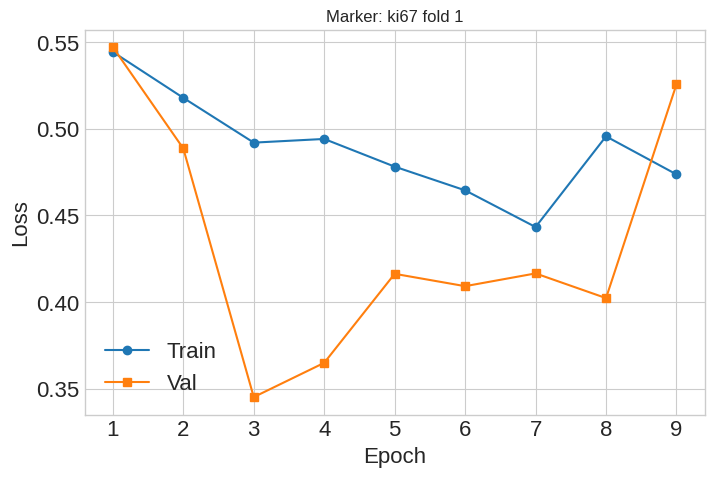

Starting fold 2 for marker ki67...
Projecting images to 3 PCs captures 75.70% of variance
Epoch   1 | Train 0.5113 | Val 0.5043
  ↳ New best val=0.5043 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.4989 | Val 0.5115
  ↳ No improvement (1/6 patience)
Epoch   3 | Train 0.4592 | Val 0.3773
  ↳ New best val=0.3773 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.4463 | Val 0.4223
  ↳ No improvement (1/6 patience)
Epoch   5 | Train 0.4414 | Val 0.3087
  ↳ New best val=0.3087 at epoch 5
  ↳ Saved checkpoint to best_model.pth
Epoch   6 | Train 0.4421 | Val 0.4065
  ↳ No improvement (1/6 patience)
Epoch   7 | Train 0.4218 | Val 0.3973
  ↳ No improvement (2/6 patience)
Epoch   8 | Train 0.4076 | Val 0.3501
  ↳ No improvement (3/6 patience)
Epoch   9 | Train 0.4000 | Val 0.3411
  ↳ No improvement (4/6 patience)
Epoch  10 | Train 0.4038 | Val 0.3584
  ↳ No improvement (5/6 patience)
Epoch  11 | Train 0.3833 | Val 0.3638
  ↳ No improvement (6/6 patience

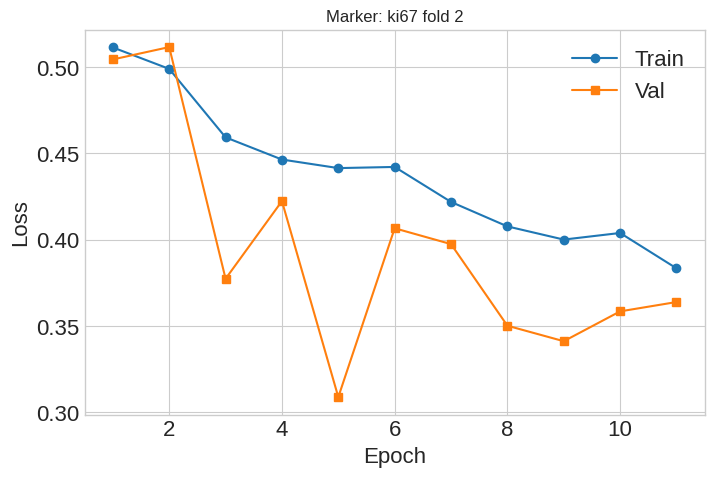

Starting fold 3 for marker ki67...
Projecting images to 3 PCs captures 75.84% of variance
Epoch   1 | Train 0.5193 | Val 0.5011
  ↳ New best val=0.5011 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.4985 | Val 0.4533
  ↳ New best val=0.4533 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4754 | Val 0.4186
  ↳ New best val=0.4186 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.4359 | Val 0.3580
  ↳ New best val=0.3580 at epoch 4
  ↳ Saved checkpoint to best_model.pth
Epoch   5 | Train 0.4167 | Val 0.4525
  ↳ No improvement (1/6 patience)
Epoch   6 | Train 0.4070 | Val 0.2749
  ↳ New best val=0.2749 at epoch 6
  ↳ Saved checkpoint to best_model.pth
Epoch   7 | Train 0.3835 | Val 0.3128
  ↳ No improvement (1/6 patience)
Epoch   8 | Train 0.3904 | Val 0.3114
  ↳ No improvement (2/6 patience)
Epoch   9 | Train 0.3964 | Val 0.3750
  ↳ No improvement (3/6 patience)
Epoch  10 | Train 0.3855 | Val 0.3773
  ↳ No improvement (4/6 

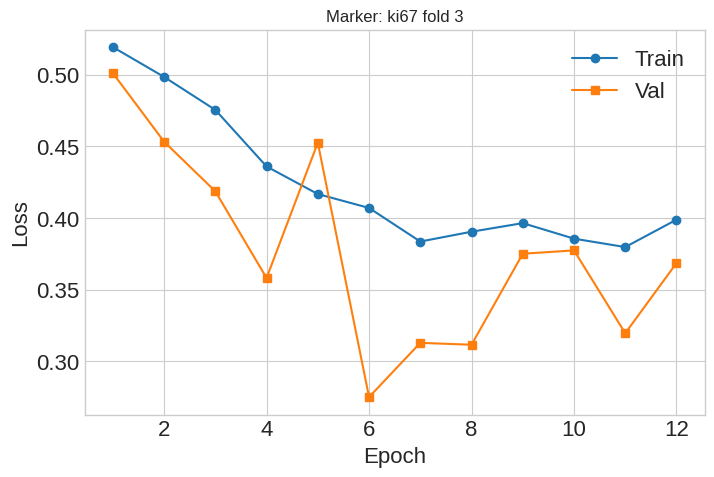

Starting fold 4 for marker ki67...
Projecting images to 3 PCs captures 74.81% of variance
Epoch   1 | Train 0.5250 | Val 0.5364
  ↳ New best val=0.5364 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.5025 | Val 0.5008
  ↳ New best val=0.5008 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4924 | Val 0.3849
  ↳ New best val=0.3849 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.4714 | Val 0.3773
  ↳ New best val=0.3773 at epoch 4
  ↳ Saved checkpoint to best_model.pth
Epoch   5 | Train 0.4471 | Val 0.4205
  ↳ No improvement (1/6 patience)
Epoch   6 | Train 0.4301 | Val 0.3916
  ↳ No improvement (2/6 patience)
Epoch   7 | Train 0.4264 | Val 0.3650
  ↳ New best val=0.3650 at epoch 7
  ↳ Saved checkpoint to best_model.pth
Epoch   8 | Train 0.4161 | Val 0.3973
  ↳ No improvement (1/6 patience)
Epoch   9 | Train 0.4263 | Val 0.4277
  ↳ No improvement (2/6 patience)
Epoch  10 | Train 0.4575 | Val 0.5485
  ↳ No improvement (3/6 

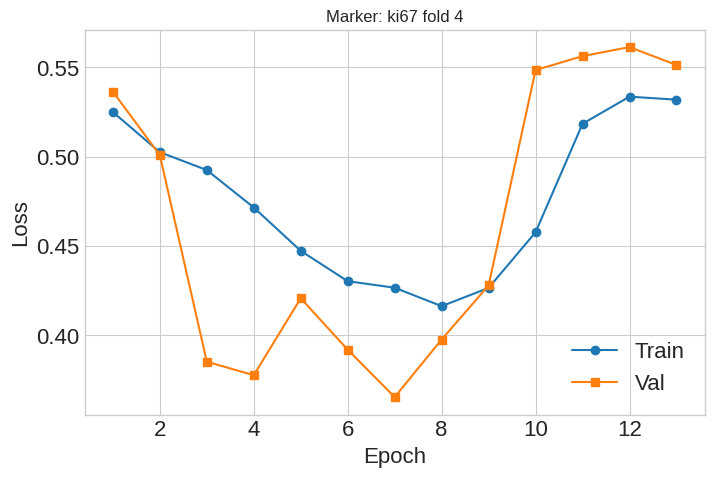

Starting fold 5 for marker ki67...
Projecting images to 3 PCs captures 76.43% of variance
Epoch   1 | Train 0.5166 | Val 0.5119
  ↳ New best val=0.5119 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.5037 | Val 0.4934
  ↳ New best val=0.4934 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4883 | Val 0.4408
  ↳ New best val=0.4408 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.4609 | Val 0.3721
  ↳ New best val=0.3721 at epoch 4
  ↳ Saved checkpoint to best_model.pth
Epoch   5 | Train 0.4325 | Val 0.3985
  ↳ No improvement (1/6 patience)
Epoch   6 | Train 0.4059 | Val 0.3499
  ↳ New best val=0.3499 at epoch 6
  ↳ Saved checkpoint to best_model.pth
Epoch   7 | Train 0.3939 | Val 0.3776
  ↳ No improvement (1/6 patience)
Epoch   8 | Train 0.4104 | Val 0.3711
  ↳ No improvement (2/6 patience)
Epoch   9 | Train 0.4086 | Val 0.4113
  ↳ No improvement (3/6 patience)
Epoch  10 | Train 0.4325 | Val 0.4361
  ↳ No improvement (4/6 

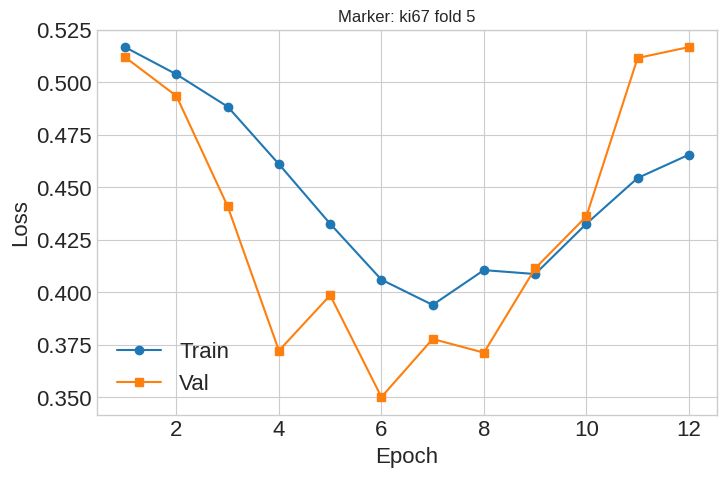

Marker: CD3
Starting fold 1 for marker CD3...
Projecting images to 3 PCs captures 74.03% of variance
Epoch   1 | Train 0.5404 | Val 0.5493
  ↳ New best val=0.5493 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.5155 | Val 0.4880
  ↳ New best val=0.4880 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.5009 | Val 0.3874
  ↳ New best val=0.3874 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.5006 | Val 0.4473
  ↳ No improvement (1/6 patience)
Epoch   5 | Train 0.4863 | Val 0.4618
  ↳ No improvement (2/6 patience)
Epoch   6 | Train -inf | Val 0.3697
  ↳ New best val=0.3697 at epoch 6
  ↳ Saved checkpoint to best_model.pth
Epoch   7 | Train 0.4677 | Val 0.4477
  ↳ No improvement (1/6 patience)
Epoch   8 | Train 0.4911 | Val 0.4946
  ↳ No improvement (2/6 patience)
Epoch   9 | Train 0.4745 | Val 0.5141
  ↳ No improvement (3/6 patience)
Epoch  10 | Train 0.4765 | Val 0.4928
  ↳ No improvement (4/6 patience)
Epoch  11 | Train 0.4

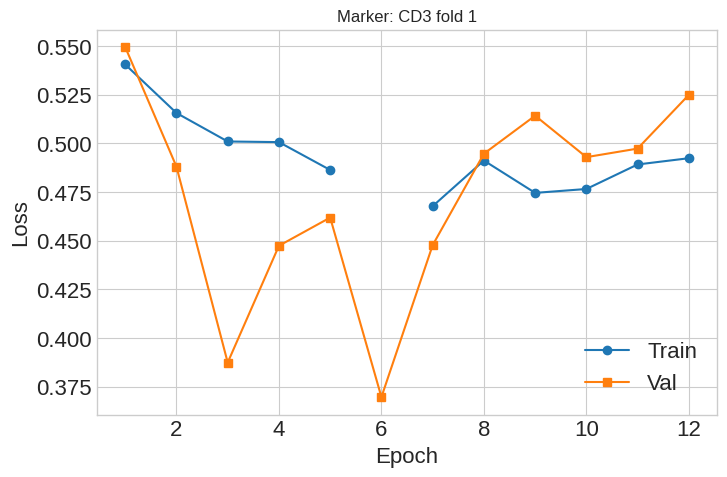

Starting fold 2 for marker CD3...
Projecting images to 3 PCs captures 75.74% of variance
Epoch   1 | Train 0.5292 | Val 0.5206
  ↳ New best val=0.5206 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.5066 | Val 0.4995
  ↳ New best val=0.4995 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4992 | Val 0.4913
  ↳ New best val=0.4913 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.4924 | Val 0.4866
  ↳ New best val=0.4866 at epoch 4
  ↳ Saved checkpoint to best_model.pth
Epoch   5 | Train 0.4744 | Val 0.4452
  ↳ New best val=0.4452 at epoch 5
  ↳ Saved checkpoint to best_model.pth
Epoch   6 | Train 0.4391 | Val 0.3964
  ↳ New best val=0.3964 at epoch 6
  ↳ Saved checkpoint to best_model.pth
Epoch   7 | Train 0.4275 | Val 0.3852
  ↳ New best val=0.3852 at epoch 7
  ↳ Saved checkpoint to best_model.pth
Epoch   8 | Train 0.4045 | Val 0.3794
  ↳ New best val=0.3794 at epoch 8
  ↳ Saved checkpoint to best_model.pth
Epoch   9 | Tra

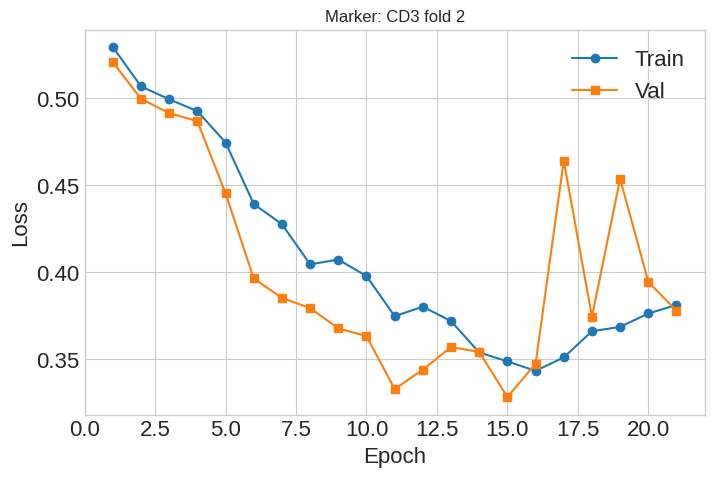

Starting fold 3 for marker CD3...
Projecting images to 3 PCs captures 75.87% of variance
Epoch   1 | Train 0.5163 | Val 0.5198
  ↳ New best val=0.5198 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.4941 | Val 0.4983
  ↳ New best val=0.4983 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4746 | Val 0.4144
  ↳ New best val=0.4144 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.4438 | Val 0.3633
  ↳ New best val=0.3633 at epoch 4
  ↳ Saved checkpoint to best_model.pth
Epoch   5 | Train 0.4353 | Val 0.3917
  ↳ No improvement (1/6 patience)
Epoch   6 | Train 0.4289 | Val 0.3688
  ↳ No improvement (2/6 patience)
Epoch   7 | Train 0.4233 | Val 0.3583
  ↳ New best val=0.3583 at epoch 7
  ↳ Saved checkpoint to best_model.pth
Epoch   8 | Train 0.4132 | Val 0.3341
  ↳ New best val=0.3341 at epoch 8
  ↳ Saved checkpoint to best_model.pth
Epoch   9 | Train 0.4023 | Val 0.3460
  ↳ No improvement (1/6 patience)
Epoch  10 | Train 0.396

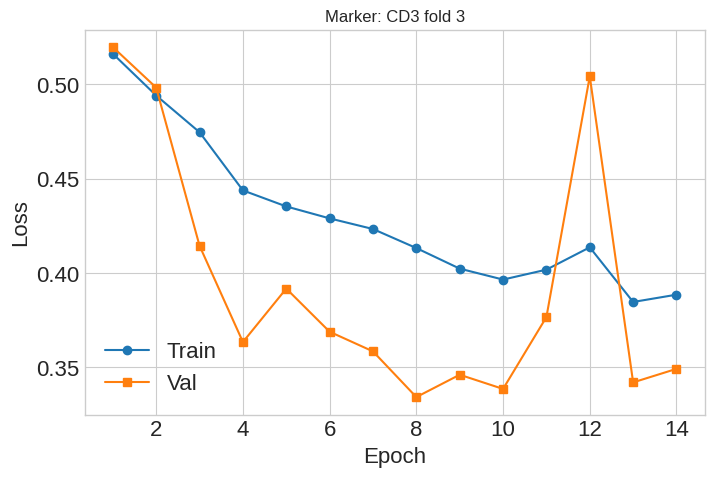

Starting fold 4 for marker CD3...
Projecting images to 3 PCs captures 74.81% of variance
Epoch   1 | Train 0.5080 | Val 0.3927
  ↳ New best val=0.3927 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.4864 | Val 0.4865
  ↳ No improvement (1/6 patience)
Epoch   3 | Train 0.4441 | Val 0.4104
  ↳ No improvement (2/6 patience)
Epoch   4 | Train 0.4257 | Val 0.4051
  ↳ No improvement (3/6 patience)
Epoch   5 | Train 0.4254 | Val 0.3938
  ↳ No improvement (4/6 patience)
Epoch   6 | Train 0.4239 | Val 0.3848
  ↳ New best val=0.3848 at epoch 6
  ↳ Saved checkpoint to best_model.pth
Epoch   7 | Train 0.4183 | Val 0.3849
  ↳ No improvement (1/6 patience)
Epoch   8 | Train 0.4118 | Val 0.3864
  ↳ No improvement (2/6 patience)
Epoch   9 | Train 0.4118 | Val 0.4475
  ↳ No improvement (3/6 patience)
Epoch  10 | Train 0.4247 | Val 0.4730
  ↳ No improvement (4/6 patience)
Epoch  11 | Train 0.4568 | Val 0.4399
  ↳ No improvement (5/6 patience)
Epoch  12 | Train 0.4523 | Val 0.4729
 

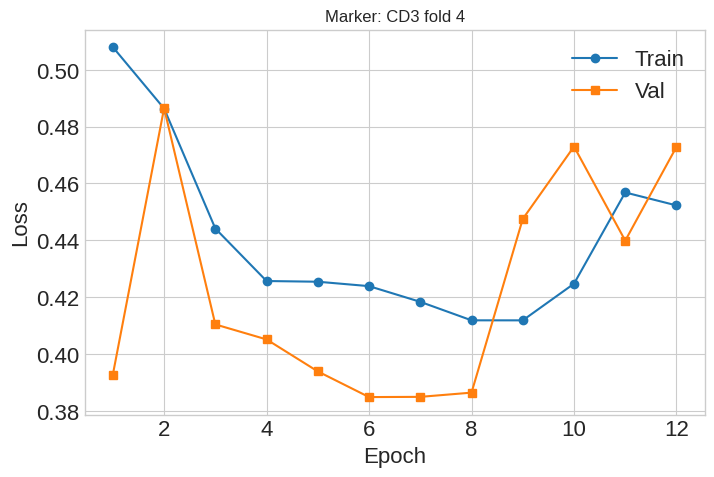

Starting fold 5 for marker CD3...
Projecting images to 3 PCs captures 76.46% of variance
Epoch   1 | Train 0.5232 | Val 0.4266
  ↳ New best val=0.4266 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.5010 | Val 0.4481
  ↳ No improvement (1/6 patience)
Epoch   3 | Train 0.4958 | Val 0.4446
  ↳ No improvement (2/6 patience)
Epoch   4 | Train 0.4820 | Val 0.4096
  ↳ New best val=0.4096 at epoch 4
  ↳ Saved checkpoint to best_model.pth
Epoch   5 | Train 0.4590 | Val 0.4473
  ↳ No improvement (1/6 patience)
Epoch   6 | Train 0.4426 | Val 0.4360
  ↳ No improvement (2/6 patience)
Epoch   7 | Train 0.4309 | Val 0.3681
  ↳ New best val=0.3681 at epoch 7
  ↳ Saved checkpoint to best_model.pth
Epoch   8 | Train 0.4388 | Val 0.3736
  ↳ No improvement (1/6 patience)
Epoch   9 | Train 0.4321 | Val 0.3701
  ↳ No improvement (2/6 patience)
Epoch  10 | Train 0.4203 | Val 0.3147
  ↳ New best val=0.3147 at epoch 10
  ↳ Saved checkpoint to best_model.pth
Epoch  11 | Train 0.4163 | Val

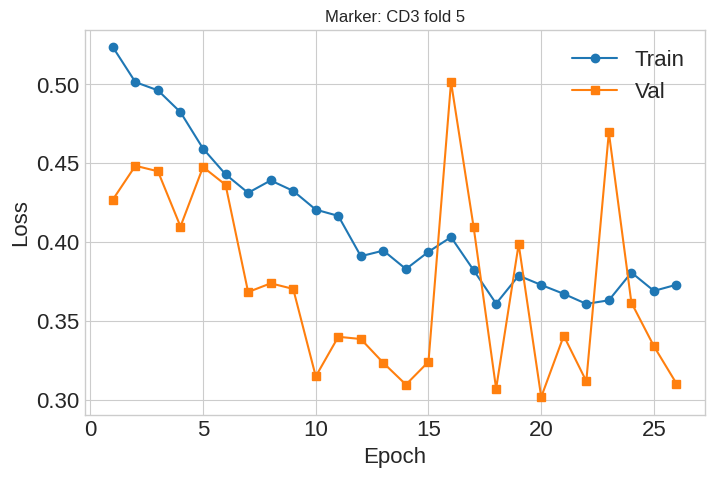

Marker: CD20
Starting fold 1 for marker CD20...
Projecting images to 3 PCs captures 74.18% of variance
Epoch   1 | Train 0.5371 | Val 0.5295
  ↳ New best val=0.5295 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.4987 | Val 0.5280
  ↳ New best val=0.5280 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4806 | Val 0.3565
  ↳ New best val=0.3565 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.4690 | Val 0.2170
  ↳ New best val=0.2170 at epoch 4
  ↳ Saved checkpoint to best_model.pth
Epoch   5 | Train 0.4413 | Val 0.3426
  ↳ No improvement (1/6 patience)
Epoch   6 | Train 0.4222 | Val 0.3348
  ↳ No improvement (2/6 patience)
Epoch   7 | Train 0.4111 | Val 0.3374
  ↳ No improvement (3/6 patience)
Epoch   8 | Train 0.4281 | Val 0.2903
  ↳ No improvement (4/6 patience)
Epoch   9 | Train 0.3925 | Val 0.2918
  ↳ No improvement (5/6 patience)
Epoch  10 | Train 0.3746 | Val 0.2662
  ↳ No improvement (6/6 patience)
--Early stopping 

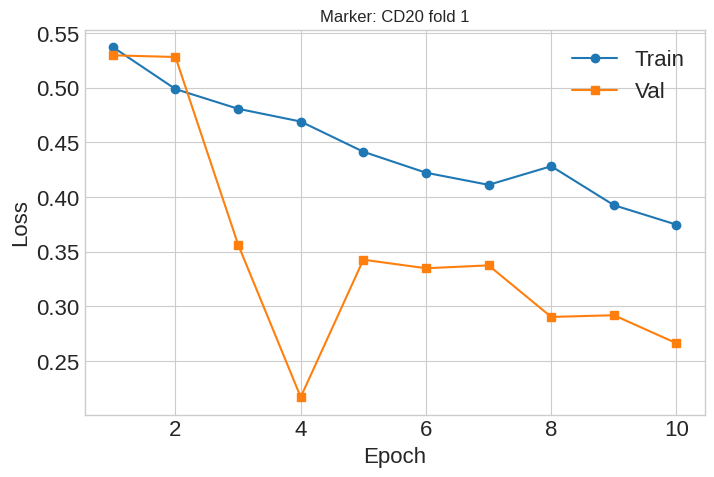

Starting fold 2 for marker CD20...
Projecting images to 3 PCs captures 75.89% of variance
Epoch   1 | Train 0.5180 | Val 0.4631
  ↳ New best val=0.4631 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.4934 | Val 0.2754
  ↳ New best val=0.2754 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4735 | Val 0.4062
  ↳ No improvement (1/6 patience)
Epoch   4 | Train 0.4486 | Val 0.4063
  ↳ No improvement (2/6 patience)
Epoch   5 | Train 0.4113 | Val 0.3534
  ↳ No improvement (3/6 patience)
Epoch   6 | Train 0.3845 | Val 0.3254
  ↳ No improvement (4/6 patience)
Epoch   7 | Train 0.3695 | Val 0.2870
  ↳ No improvement (5/6 patience)
Epoch   8 | Train 0.3651 | Val 0.3126
  ↳ No improvement (6/6 patience)
--Early stopping at epoch 8. Best epoch was 2 with val=0.2754
--Restored model weights from epoch 2 (val=0.2754)


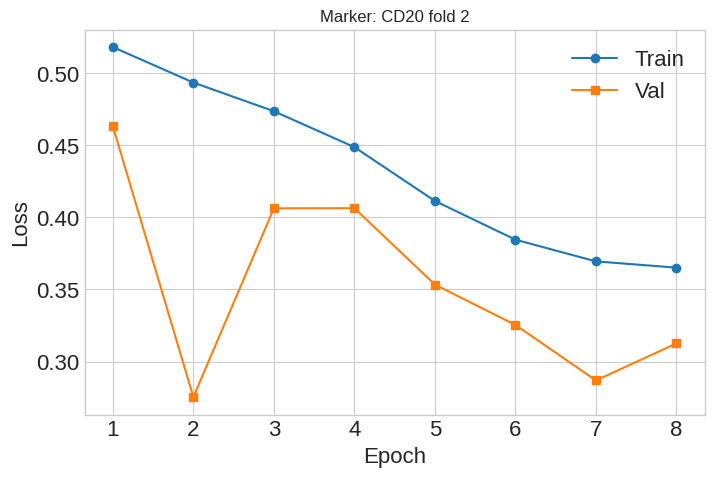

Starting fold 3 for marker CD20...
Projecting images to 3 PCs captures 76.01% of variance
Epoch   1 | Train 0.5300 | Val 0.5218
  ↳ New best val=0.5218 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.5066 | Val 0.5026
  ↳ New best val=0.5026 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4928 | Val 0.4892
  ↳ New best val=0.4892 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.4643 | Val 0.3615
  ↳ New best val=0.3615 at epoch 4
  ↳ Saved checkpoint to best_model.pth
Epoch   5 | Train 0.4113 | Val 0.2691
  ↳ New best val=0.2691 at epoch 5
  ↳ Saved checkpoint to best_model.pth
Epoch   6 | Train 0.4180 | Val 0.3030
  ↳ No improvement (1/6 patience)
Epoch   7 | Train 0.4012 | Val 0.2655
  ↳ New best val=0.2655 at epoch 7
  ↳ Saved checkpoint to best_model.pth
Epoch   8 | Train 0.4075 | Val 0.3725
  ↳ No improvement (1/6 patience)
Epoch   9 | Train 0.3962 | Val 0.4110
  ↳ No improvement (2/6 patience)
Epoch  10 | Train 0.42

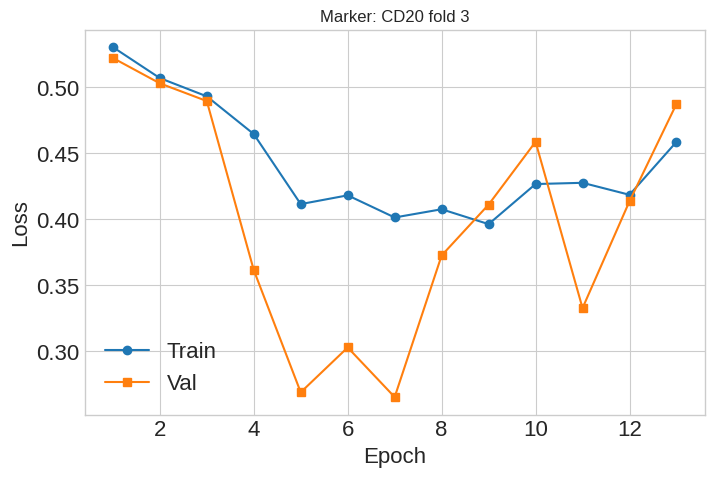

Starting fold 4 for marker CD20...
Projecting images to 3 PCs captures 74.94% of variance
Epoch   1 | Train 0.5219 | Val 0.4895
  ↳ New best val=0.4895 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.5036 | Val 0.4846
  ↳ New best val=0.4846 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4661 | Val 0.4037
  ↳ New best val=0.4037 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.4530 | Val 0.2826
  ↳ New best val=0.2826 at epoch 4
  ↳ Saved checkpoint to best_model.pth
Epoch   5 | Train 0.4350 | Val 0.4247
  ↳ No improvement (1/6 patience)
Epoch   6 | Train 0.4198 | Val 0.3668
  ↳ No improvement (2/6 patience)
Epoch   7 | Train 0.4282 | Val 0.4124
  ↳ No improvement (3/6 patience)
Epoch   8 | Train 0.4732 | Val 0.5446
  ↳ No improvement (4/6 patience)
Epoch   9 | Train 0.5089 | Val 0.5175
  ↳ No improvement (5/6 patience)
Epoch  10 | Train 0.4998 | Val 0.5189
  ↳ No improvement (6/6 patience)
--Early stopping at epoch 10. 

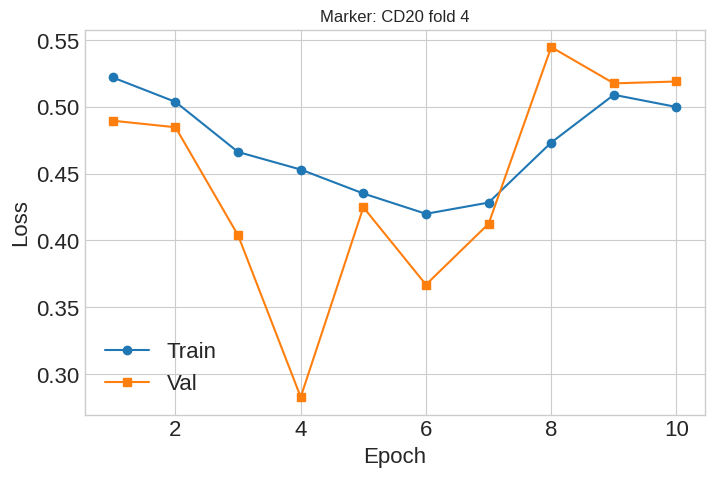

Starting fold 5 for marker CD20...
Projecting images to 3 PCs captures 76.58% of variance
Epoch   1 | Train 0.5344 | Val 0.5285
  ↳ New best val=0.5285 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.5046 | Val 0.5124
  ↳ New best val=0.5124 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4924 | Val 0.4907
  ↳ New best val=0.4907 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.4781 | Val 0.4838
  ↳ New best val=0.4838 at epoch 4
  ↳ Saved checkpoint to best_model.pth
Epoch   5 | Train 0.4504 | Val 0.3620
  ↳ New best val=0.3620 at epoch 5
  ↳ Saved checkpoint to best_model.pth
Epoch   6 | Train 0.4489 | Val 0.3222
  ↳ New best val=0.3222 at epoch 6
  ↳ Saved checkpoint to best_model.pth
Epoch   7 | Train 0.4177 | Val 0.3353
  ↳ No improvement (1/6 patience)
Epoch   8 | Train 0.4208 | Val 0.3878
  ↳ No improvement (2/6 patience)
Epoch   9 | Train 0.4544 | Val 0.4696
  ↳ No improvement (3/6 patience)
Epoch  10 | Train 0.45

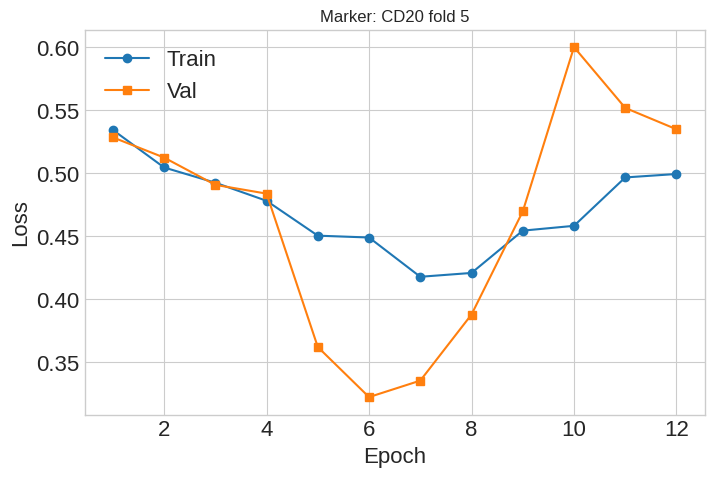

Marker: CD45
Starting fold 1 for marker CD45...
Projecting images to 3 PCs captures 75.25% of variance
Epoch   1 | Train 0.5266 | Val 0.5230
  ↳ New best val=0.5230 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.4890 | Val 0.4980
  ↳ New best val=0.4980 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4786 | Val 0.3157
  ↳ New best val=0.3157 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.4770 | Val 0.4454
  ↳ No improvement (1/6 patience)
Epoch   5 | Train 0.4598 | Val 0.4613
  ↳ No improvement (2/6 patience)
Epoch   6 | Train 0.4455 | Val 0.3728
  ↳ No improvement (3/6 patience)
Epoch   7 | Train 0.4328 | Val 0.2934
  ↳ New best val=0.2934 at epoch 7
  ↳ Saved checkpoint to best_model.pth
Epoch   8 | Train 0.4660 | Val 0.3818
  ↳ No improvement (1/6 patience)
Epoch   9 | Train 0.4409 | Val 0.4644
  ↳ No improvement (2/6 patience)
Epoch  10 | Train 0.4622 | Val 0.5361
  ↳ No improvement (3/6 patience)
Epoch  11 | Train

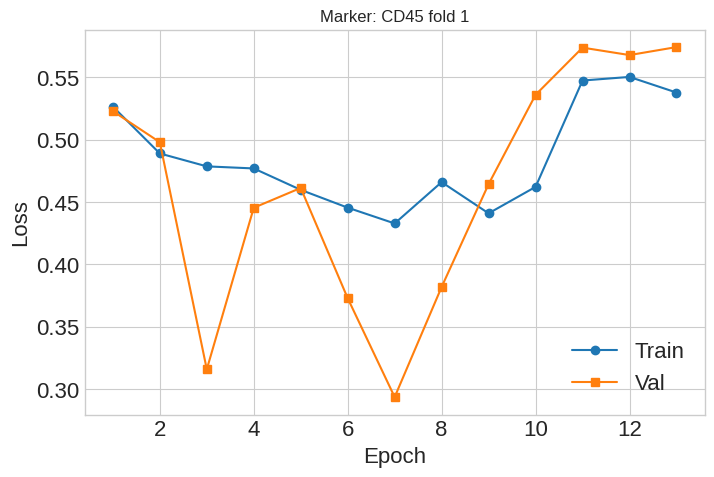

Starting fold 2 for marker CD45...
Projecting images to 3 PCs captures 76.82% of variance
Epoch   1 | Train 0.5171 | Val 0.3947
  ↳ New best val=0.3947 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.4904 | Val 0.5125
  ↳ No improvement (1/6 patience)
Epoch   3 | Train 0.4685 | Val 0.4287
  ↳ No improvement (2/6 patience)
Epoch   4 | Train 0.4501 | Val 0.4596
  ↳ No improvement (3/6 patience)
Epoch   5 | Train 0.4200 | Val 0.3598
  ↳ New best val=0.3598 at epoch 5
  ↳ Saved checkpoint to best_model.pth
Epoch   6 | Train 0.3915 | Val 0.3839
  ↳ No improvement (1/6 patience)
Epoch   7 | Train 0.3801 | Val 0.3643
  ↳ No improvement (2/6 patience)
Epoch   8 | Train 0.3646 | Val 0.3555
  ↳ New best val=0.3555 at epoch 8
  ↳ Saved checkpoint to best_model.pth
Epoch   9 | Train 0.3773 | Val 0.3375
  ↳ New best val=0.3375 at epoch 9
  ↳ Saved checkpoint to best_model.pth
Epoch  10 | Train 0.3935 | Val 0.4093
  ↳ No improvement (1/6 patience)
Epoch  11 | Train 0.4282 | Val

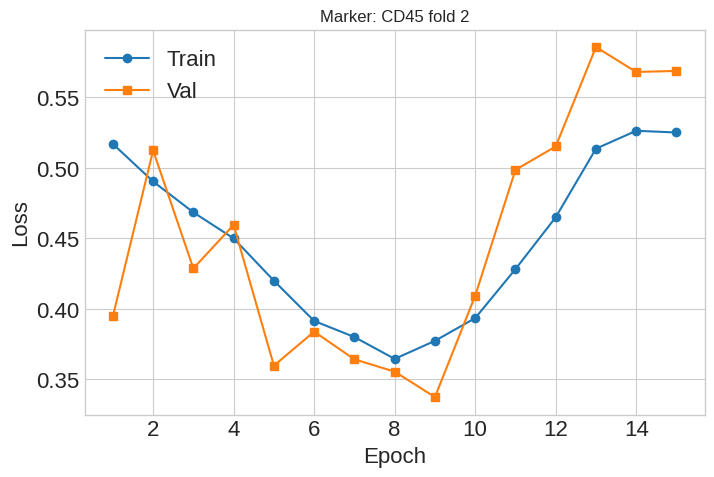

Starting fold 3 for marker CD45...
Projecting images to 3 PCs captures 76.61% of variance
Epoch   1 | Train 0.5050 | Val 0.6300
  ↳ New best val=0.6300 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.4975 | Val 0.5179
  ↳ New best val=0.5179 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4861 | Val 0.5072
  ↳ New best val=0.5072 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.4599 | Val 0.3248
  ↳ New best val=0.3248 at epoch 4
  ↳ Saved checkpoint to best_model.pth
Epoch   5 | Train 0.4391 | Val 0.3939
  ↳ No improvement (1/6 patience)
Epoch   6 | Train 0.4265 | Val 0.3358
  ↳ No improvement (2/6 patience)
Epoch   7 | Train 0.4040 | Val 0.3010
  ↳ New best val=0.3010 at epoch 7
  ↳ Saved checkpoint to best_model.pth
Epoch   8 | Train 0.4147 | Val 0.2992
  ↳ New best val=0.2992 at epoch 8
  ↳ Saved checkpoint to best_model.pth
Epoch   9 | Train 0.3934 | Val 0.2932
  ↳ New best val=0.2932 at epoch 9
  ↳ Saved checkpoint 

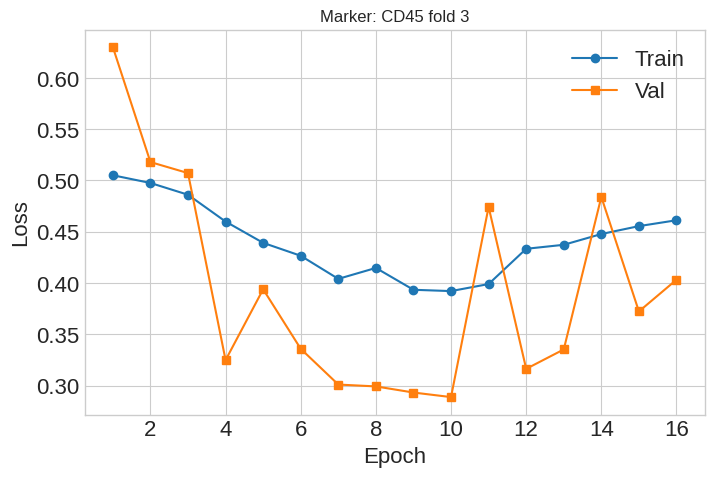

Starting fold 4 for marker CD45...
Projecting images to 3 PCs captures 75.61% of variance
Epoch   1 | Train 0.5003 | Val 0.4959
  ↳ New best val=0.4959 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.4667 | Val 0.4288
  ↳ New best val=0.4288 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4525 | Val 0.4299
  ↳ No improvement (1/6 patience)
Epoch   4 | Train 0.4129 | Val 0.4125
  ↳ New best val=0.4125 at epoch 4
  ↳ Saved checkpoint to best_model.pth
Epoch   5 | Train 0.3994 | Val 0.3052
  ↳ New best val=0.3052 at epoch 5
  ↳ Saved checkpoint to best_model.pth
Epoch   6 | Train 0.3665 | Val 0.3343
  ↳ No improvement (1/6 patience)
Epoch   7 | Train 0.3673 | Val 0.3233
  ↳ No improvement (2/6 patience)
Epoch   8 | Train 0.3627 | Val 0.3222
  ↳ No improvement (3/6 patience)
Epoch   9 | Train 0.3484 | Val 0.3060
  ↳ No improvement (4/6 patience)
Epoch  10 | Train 0.3389 | Val 0.3157
  ↳ No improvement (5/6 patience)
Epoch  11 | Train 0.3384 | Val

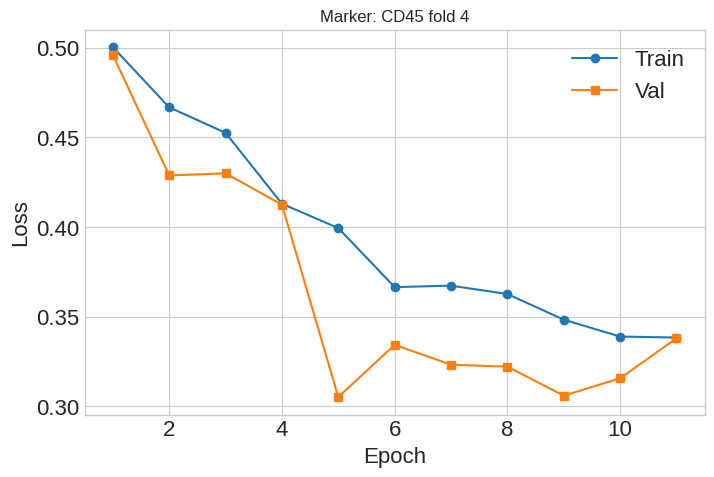

Starting fold 5 for marker CD45...
Projecting images to 3 PCs captures 77.34% of variance
Epoch   1 | Train 0.5208 | Val 0.5052
  ↳ New best val=0.5052 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.4914 | Val 0.4883
  ↳ New best val=0.4883 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4751 | Val 0.4020
  ↳ New best val=0.4020 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.4426 | Val 0.4059
  ↳ No improvement (1/6 patience)
Epoch   5 | Train 0.4086 | Val 0.3791
  ↳ New best val=0.3791 at epoch 5
  ↳ Saved checkpoint to best_model.pth
Epoch   6 | Train 0.3941 | Val 0.3677
  ↳ New best val=0.3677 at epoch 6
  ↳ Saved checkpoint to best_model.pth
Epoch   7 | Train 0.3960 | Val 0.3555
  ↳ New best val=0.3555 at epoch 7
  ↳ Saved checkpoint to best_model.pth
Epoch   8 | Train 0.3864 | Val 0.3574
  ↳ No improvement (1/6 patience)
Epoch   9 | Train 0.3784 | Val 0.3399
  ↳ New best val=0.3399 at epoch 9
  ↳ Saved checkpoint 

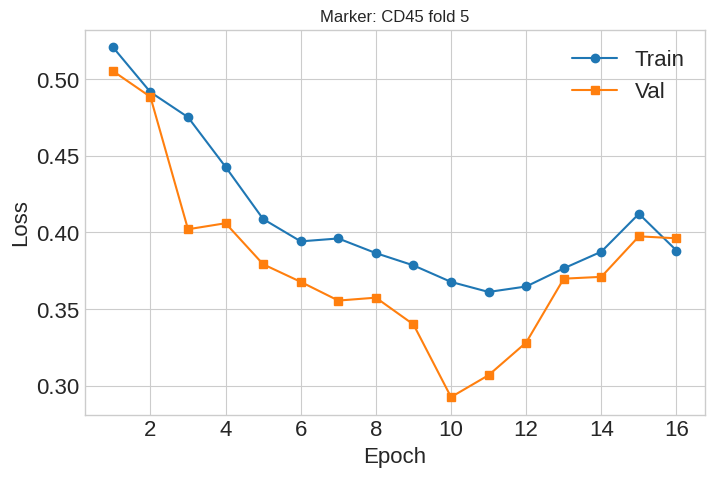

Marker: CD68
Starting fold 1 for marker CD68...
Projecting images to 3 PCs captures 74.11% of variance
Epoch   1 | Train 0.5413 | Val 0.5384
  ↳ New best val=0.5384 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.5126 | Val 0.5070
  ↳ New best val=0.5070 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.5091 | Val 0.4485
  ↳ New best val=0.4485 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.5065 | Val 0.3279
  ↳ New best val=0.3279 at epoch 4
  ↳ Saved checkpoint to best_model.pth
Epoch   5 | Train 0.4698 | Val 0.4262
  ↳ No improvement (1/6 patience)
Epoch   6 | Train 0.4608 | Val 0.4771
  ↳ No improvement (2/6 patience)
Epoch   7 | Train 0.4344 | Val 0.3132
  ↳ New best val=0.3132 at epoch 7
  ↳ Saved checkpoint to best_model.pth
Epoch   8 | Train 0.4757 | Val 0.3927
  ↳ No improvement (1/6 patience)
Epoch   9 | Train 0.5076 | Val 0.5714
  ↳ No improvement (2/6 patience)
Epoch  10 | Train 0.5563 | Val 0.5602
  ↳ No impr

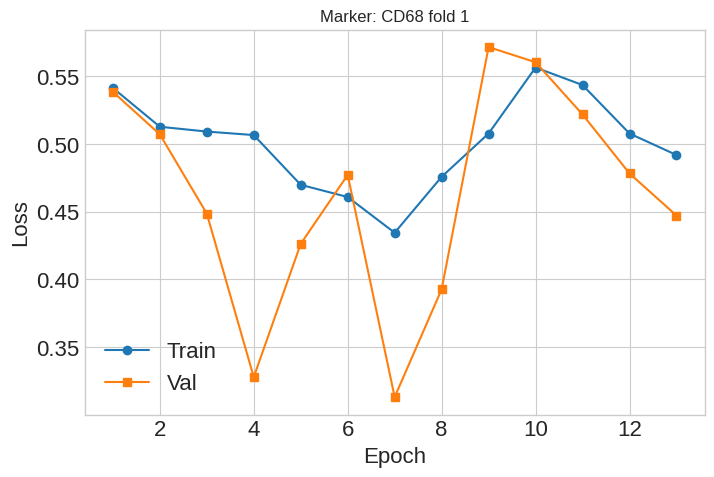

Starting fold 2 for marker CD68...
Projecting images to 3 PCs captures 75.80% of variance
Epoch   1 | Train 0.5267 | Val 0.4543
  ↳ New best val=0.4543 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.5014 | Val 0.3487
  ↳ New best val=0.3487 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4702 | Val 0.4548
  ↳ No improvement (1/6 patience)
Epoch   4 | Train 0.4514 | Val 0.3943
  ↳ No improvement (2/6 patience)
Epoch   5 | Train 0.4251 | Val 0.3937
  ↳ No improvement (3/6 patience)
Epoch   6 | Train 0.4255 | Val 0.3296
  ↳ New best val=0.3296 at epoch 6
  ↳ Saved checkpoint to best_model.pth
Epoch   7 | Train 0.4207 | Val 0.3897
  ↳ No improvement (1/6 patience)
Epoch   8 | Train 0.4614 | Val 0.4849
  ↳ No improvement (2/6 patience)
Epoch   9 | Train 0.4801 | Val 0.5508
  ↳ No improvement (3/6 patience)
Epoch  10 | Train 0.5033 | Val 0.5899
  ↳ No improvement (4/6 patience)
Epoch  11 | Train 0.5279 | Val 0.5944
  ↳ No improvement (5/6 patience

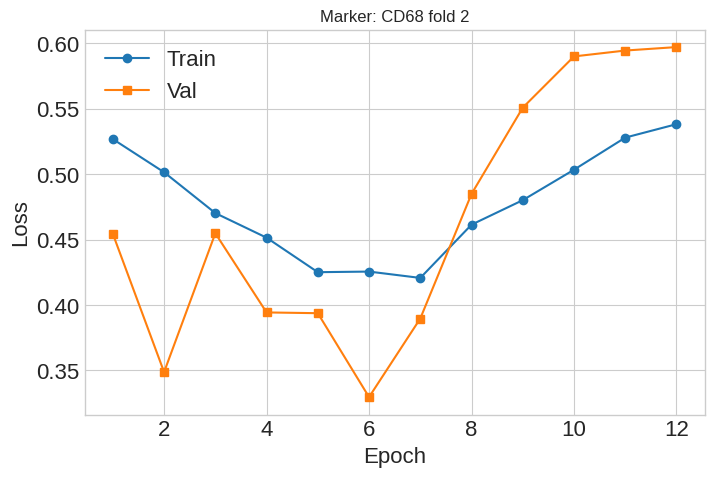

Starting fold 3 for marker CD68...
Projecting images to 3 PCs captures 75.94% of variance
Epoch   1 | Train 0.5267 | Val 0.5141
  ↳ New best val=0.5141 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.5055 | Val 0.4951
  ↳ New best val=0.4951 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4822 | Val 0.4030
  ↳ New best val=0.4030 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.4558 | Val 0.4466
  ↳ No improvement (1/6 patience)
Epoch   5 | Train 0.4250 | Val 0.4194
  ↳ No improvement (2/6 patience)
Epoch   6 | Train 0.4072 | Val 0.3647
  ↳ New best val=0.3647 at epoch 6
  ↳ Saved checkpoint to best_model.pth
Epoch   7 | Train 0.4174 | Val 0.3807
  ↳ No improvement (1/6 patience)
Epoch   8 | Train 0.4299 | Val 0.3455
  ↳ New best val=0.3455 at epoch 8
  ↳ Saved checkpoint to best_model.pth
Epoch   9 | Train 0.4629 | Val 0.5056
  ↳ No improvement (1/6 patience)
Epoch  10 | Train 0.4685 | Val 0.5417
  ↳ No improvement (2/6 

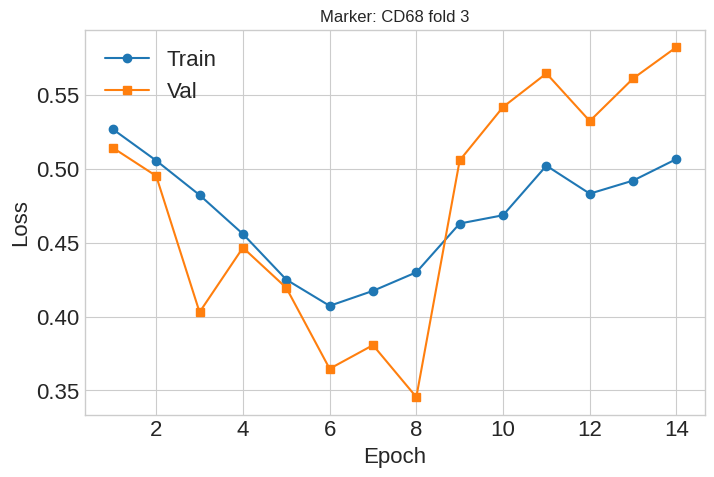

Starting fold 4 for marker CD68...
Projecting images to 3 PCs captures 74.92% of variance
Epoch   1 | Train 0.5126 | Val 0.4835
  ↳ New best val=0.4835 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.4933 | Val 0.4182
  ↳ New best val=0.4182 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4445 | Val 0.3413
  ↳ New best val=0.3413 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.4207 | Val 0.3257
  ↳ New best val=0.3257 at epoch 4
  ↳ Saved checkpoint to best_model.pth
Epoch   5 | Train 0.4150 | Val 0.3530
  ↳ No improvement (1/6 patience)
Epoch   6 | Train 0.3847 | Val 0.3233
  ↳ New best val=0.3233 at epoch 6
  ↳ Saved checkpoint to best_model.pth
Epoch   7 | Train 0.3896 | Val 0.2946
  ↳ New best val=0.2946 at epoch 7
  ↳ Saved checkpoint to best_model.pth
Epoch   8 | Train 0.3533 | Val 0.3265
  ↳ No improvement (1/6 patience)
Epoch   9 | Train 0.3422 | Val 0.2760
  ↳ New best val=0.2760 at epoch 9
  ↳ Saved checkpoint 

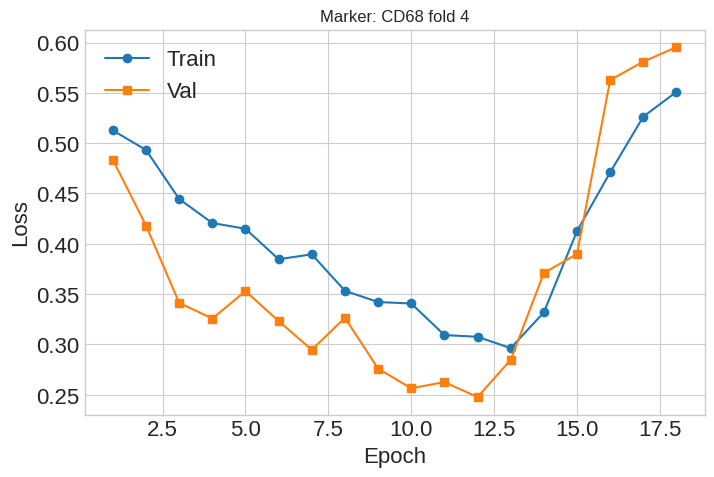

Starting fold 5 for marker CD68...
Projecting images to 3 PCs captures 76.54% of variance
Epoch   1 | Train 0.5080 | Val 0.3883
  ↳ New best val=0.3883 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.4838 | Val 0.2854
  ↳ New best val=0.2854 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4563 | Val 0.4039
  ↳ No improvement (1/6 patience)
Epoch   4 | Train 0.4092 | Val 0.3960
  ↳ No improvement (2/6 patience)
Epoch   5 | Train 0.4153 | Val 0.3878
  ↳ No improvement (3/6 patience)
Epoch   6 | Train 0.4030 | Val 0.2554
  ↳ New best val=0.2554 at epoch 6
  ↳ Saved checkpoint to best_model.pth
Epoch   7 | Train 0.3916 | Val 0.2930
  ↳ No improvement (1/6 patience)
Epoch   8 | Train 0.3826 | Val 0.2961
  ↳ No improvement (2/6 patience)
Epoch   9 | Train 0.3927 | Val 0.5528
  ↳ No improvement (3/6 patience)
Epoch  10 | Train 0.4943 | Val 0.5842
  ↳ No improvement (4/6 patience)
Epoch  11 | Train 0.5220 | Val 0.5489
  ↳ No improvement (5/6 patience

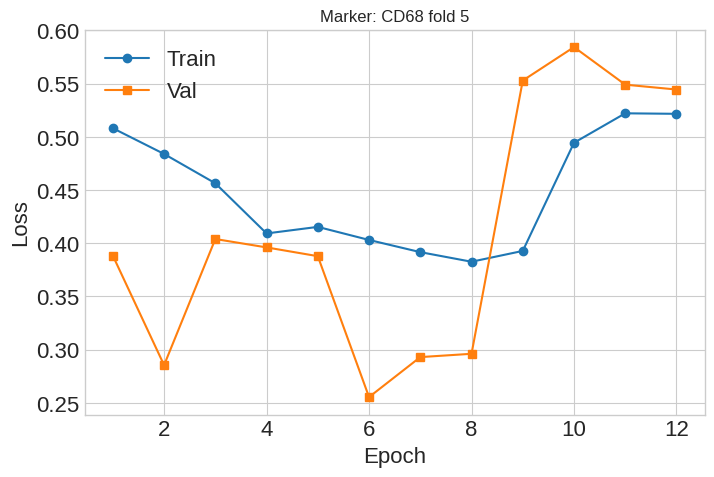

Marker: sma
Starting fold 1 for marker sma...
Projecting images to 3 PCs captures 76.05% of variance
Epoch   1 | Train 0.5204 | Val 0.5097
  ↳ New best val=0.5097 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.4708 | Val 0.5071
  ↳ New best val=0.5071 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4693 | Val 0.4351
  ↳ New best val=0.4351 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.4743 | Val 0.4260
  ↳ New best val=0.4260 at epoch 4
  ↳ Saved checkpoint to best_model.pth
Epoch   5 | Train 0.4468 | Val 0.3443
  ↳ New best val=0.3443 at epoch 5
  ↳ Saved checkpoint to best_model.pth
Epoch   6 | Train 0.4361 | Val 0.3454
  ↳ No improvement (1/6 patience)
Epoch   7 | Train 0.4079 | Val 0.3522
  ↳ No improvement (2/6 patience)
Epoch   8 | Train 0.4334 | Val 0.4269
  ↳ No improvement (3/6 patience)
Epoch   9 | Train 0.4094 | Val 0.4743
  ↳ No improvement (4/6 patience)
Epoch  10 | Train 0.4175 | Val 0.4216
  ↳ No improv

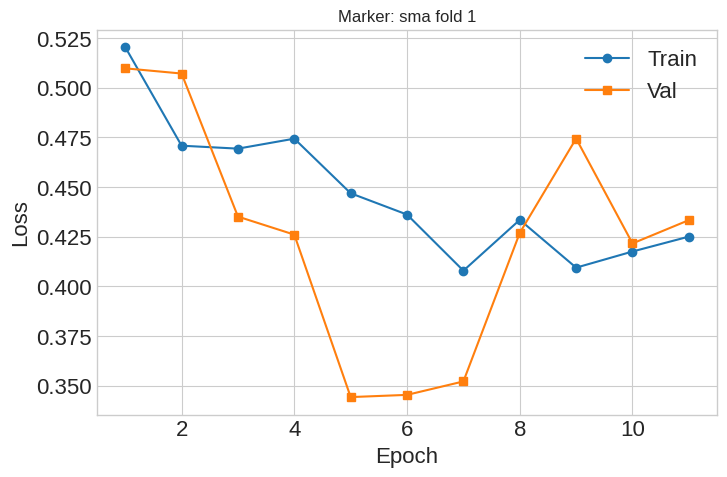

Starting fold 2 for marker sma...
Projecting images to 3 PCs captures 78.05% of variance
Epoch   1 | Train 0.4985 | Val 0.4877
  ↳ New best val=0.4877 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.4621 | Val 0.4479
  ↳ New best val=0.4479 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4428 | Val 0.4306
  ↳ New best val=0.4306 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.4331 | Val 0.4634
  ↳ No improvement (1/6 patience)
Epoch   5 | Train 0.4190 | Val 0.2923
  ↳ New best val=0.2923 at epoch 5
  ↳ Saved checkpoint to best_model.pth
Epoch   6 | Train 0.4043 | Val 0.3069
  ↳ No improvement (1/6 patience)
Epoch   7 | Train 0.3846 | Val 0.2992
  ↳ No improvement (2/6 patience)
Epoch   8 | Train 0.3590 | Val 0.2998
  ↳ No improvement (3/6 patience)
Epoch   9 | Train 0.3752 | Val 0.2850
  ↳ New best val=0.2850 at epoch 9
  ↳ Saved checkpoint to best_model.pth
Epoch  10 | Train 0.3545 | Val 0.2982
  ↳ No improvement (1/6 p

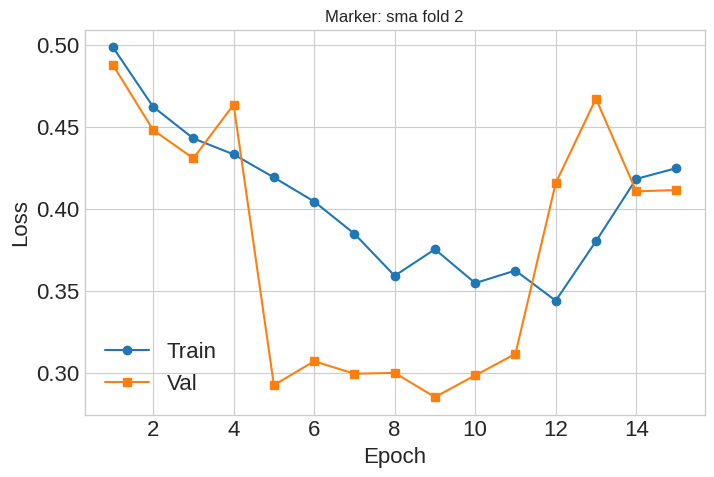

Starting fold 3 for marker sma...
Projecting images to 3 PCs captures 78.68% of variance
Epoch   1 | Train 0.5123 | Val 0.4756
  ↳ New best val=0.4756 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.4791 | Val 0.2962
  ↳ New best val=0.2962 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4673 | Val 0.3964
  ↳ No improvement (1/6 patience)
Epoch   4 | Train 0.4419 | Val 0.4276
  ↳ No improvement (2/6 patience)
Epoch   5 | Train 0.4099 | Val 0.3750
  ↳ No improvement (3/6 patience)
Epoch   6 | Train 0.4081 | Val 0.3098
  ↳ No improvement (4/6 patience)
Epoch   7 | Train 0.4008 | Val 0.2706
  ↳ New best val=0.2706 at epoch 7
  ↳ Saved checkpoint to best_model.pth
Epoch   8 | Train 0.4053 | Val 0.3150
  ↳ No improvement (1/6 patience)
Epoch   9 | Train 0.3847 | Val 0.4013
  ↳ No improvement (2/6 patience)
Epoch  10 | Train 0.4077 | Val 0.3871
  ↳ No improvement (3/6 patience)
Epoch  11 | Train 0.4087 | Val 0.3174
  ↳ No improvement (4/6 patience)

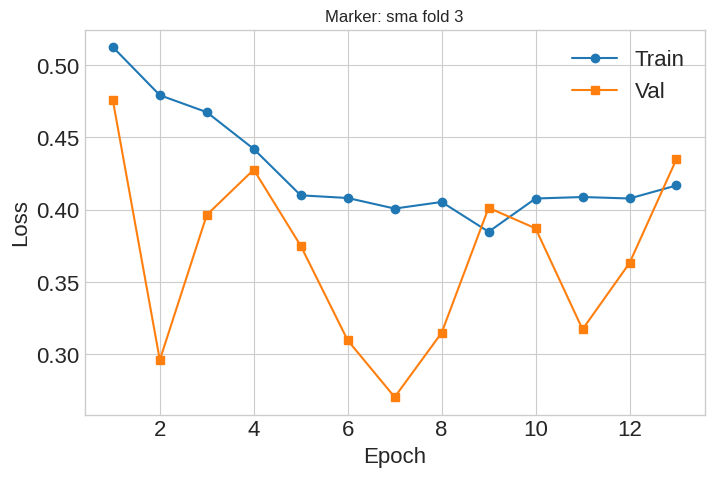

Starting fold 4 for marker sma...
Projecting images to 3 PCs captures 78.00% of variance
Epoch   1 | Train 0.4899 | Val 0.4867
  ↳ New best val=0.4867 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.4519 | Val 0.4254
  ↳ New best val=0.4254 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4276 | Val 0.3689
  ↳ New best val=0.3689 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.3880 | Val 0.3337
  ↳ New best val=0.3337 at epoch 4
  ↳ Saved checkpoint to best_model.pth
Epoch   5 | Train 0.3630 | Val 0.3051
  ↳ New best val=0.3051 at epoch 5
  ↳ Saved checkpoint to best_model.pth
Epoch   6 | Train 0.3556 | Val 0.3193
  ↳ No improvement (1/6 patience)
Epoch   7 | Train 0.3607 | Val 0.3385
  ↳ No improvement (2/6 patience)
Epoch   8 | Train 0.3204 | Val 0.3244
  ↳ No improvement (3/6 patience)
Epoch   9 | Train 0.3100 | Val 0.3087
  ↳ No improvement (4/6 patience)
Epoch  10 | Train 0.3191 | Val 0.2808
  ↳ New best val=0.2808 a

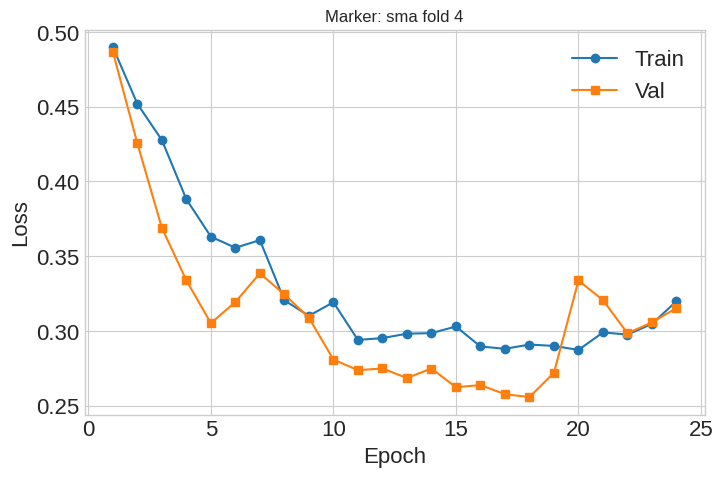

Starting fold 5 for marker sma...
Projecting images to 3 PCs captures 79.23% of variance
Epoch   1 | Train 0.5219 | Val 0.5168
  ↳ New best val=0.5168 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.4815 | Val 0.5092
  ↳ New best val=0.5092 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4725 | Val 0.4814
  ↳ New best val=0.4814 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.4663 | Val 0.4663
  ↳ New best val=0.4663 at epoch 4
  ↳ Saved checkpoint to best_model.pth
Epoch   5 | Train 0.4632 | Val 0.3723
  ↳ New best val=0.3723 at epoch 5
  ↳ Saved checkpoint to best_model.pth
Epoch   6 | Train 0.4607 | Val 0.3639
  ↳ New best val=0.3639 at epoch 6
  ↳ Saved checkpoint to best_model.pth
Epoch   7 | Train 0.4727 | Val 0.4768
  ↳ No improvement (1/6 patience)
Epoch   8 | Train 0.4518 | Val 0.4774
  ↳ No improvement (2/6 patience)
Epoch   9 | Train 0.5225 | Val 0.5471
  ↳ No improvement (3/6 patience)
Epoch  10 | Train 0.528

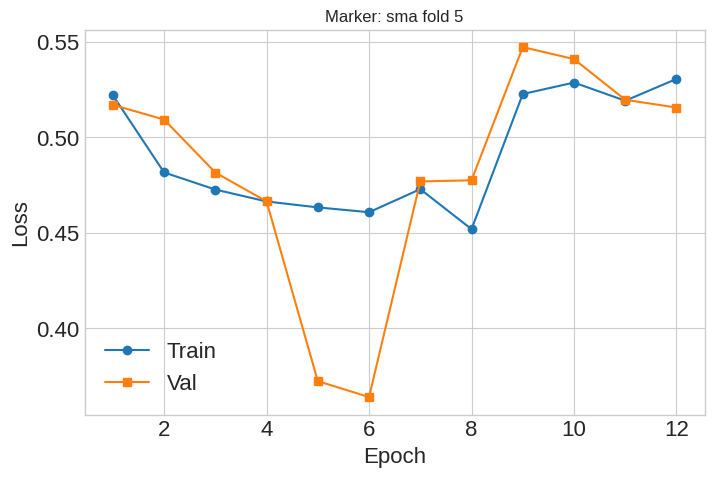

Marker: pan_cytokeratin
Starting fold 1 for marker pan_cytokeratin...
Projecting images to 3 PCs captures 60.36% of variance
Epoch   1 | Train 0.5127 | Val 0.4804
  ↳ New best val=0.4804 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.4741 | Val 0.4579
  ↳ New best val=0.4579 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4652 | Val 0.4429
  ↳ New best val=0.4429 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.4610 | Val 0.4463
  ↳ No improvement (1/6 patience)
Epoch   5 | Train 0.4470 | Val 0.4101
  ↳ New best val=0.4101 at epoch 5
  ↳ Saved checkpoint to best_model.pth
Epoch   6 | Train 0.4244 | Val 0.3644
  ↳ New best val=0.3644 at epoch 6
  ↳ Saved checkpoint to best_model.pth
Epoch   7 | Train 0.3913 | Val 0.3157
  ↳ New best val=0.3157 at epoch 7
  ↳ Saved checkpoint to best_model.pth
Epoch   8 | Train 0.4204 | Val 0.4101
  ↳ No improvement (1/6 patience)
Epoch   9 | Train 0.3953 | Val 0.3215
  ↳ No improvement (2

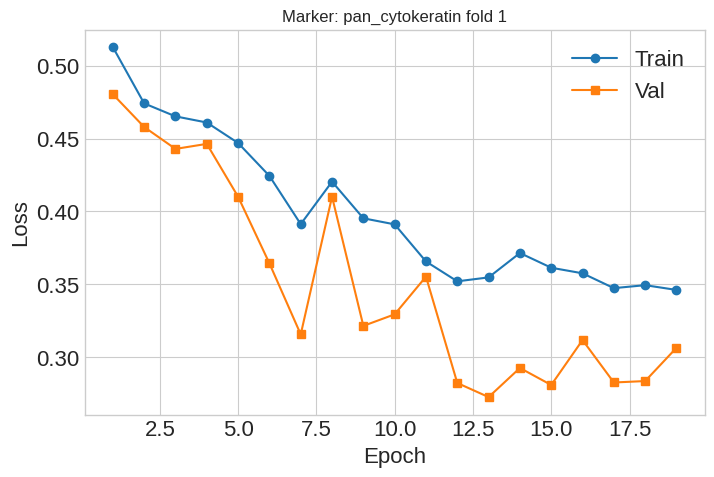

Starting fold 2 for marker pan_cytokeratin...
Projecting images to 3 PCs captures 58.67% of variance
Epoch   1 | Train 0.4880 | Val 0.3985
  ↳ New best val=0.3985 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.4406 | Val 0.3364
  ↳ New best val=0.3364 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4336 | Val 0.3501
  ↳ No improvement (1/6 patience)
Epoch   4 | Train 0.3828 | Val 0.3763
  ↳ No improvement (2/6 patience)
Epoch   5 | Train 0.3745 | Val 0.2964
  ↳ New best val=0.2964 at epoch 5
  ↳ Saved checkpoint to best_model.pth
Epoch   6 | Train 0.3630 | Val 0.3053
  ↳ No improvement (1/6 patience)
Epoch   7 | Train 0.3353 | Val 0.2763
  ↳ New best val=0.2763 at epoch 7
  ↳ Saved checkpoint to best_model.pth
Epoch   8 | Train 0.3387 | Val 0.2508
  ↳ New best val=0.2508 at epoch 8
  ↳ Saved checkpoint to best_model.pth
Epoch   9 | Train 0.3204 | Val 0.2698
  ↳ No improvement (1/6 patience)
Epoch  10 | Train 0.2937 | Val 0.2426
  ↳ New best 

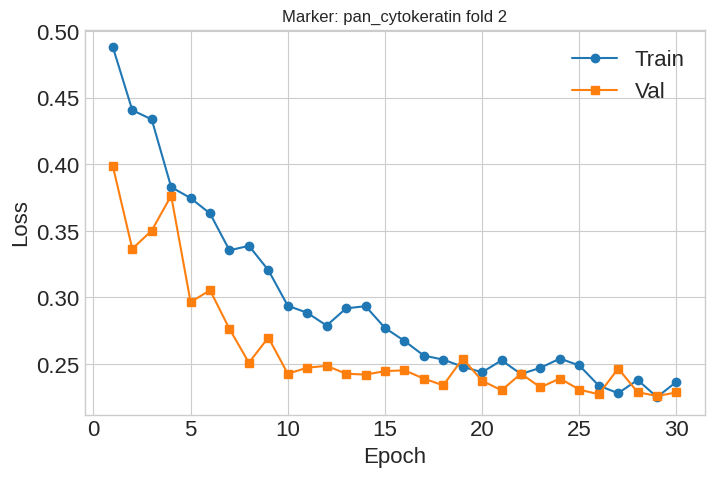

Starting fold 3 for marker pan_cytokeratin...
Projecting images to 3 PCs captures 58.99% of variance
Epoch   1 | Train 0.4681 | Val 0.4643
  ↳ New best val=0.4643 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.4400 | Val 0.4349
  ↳ New best val=0.4349 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4189 | Val 0.4144
  ↳ New best val=0.4144 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.3961 | Val 0.3438
  ↳ New best val=0.3438 at epoch 4
  ↳ Saved checkpoint to best_model.pth
Epoch   5 | Train 0.3578 | Val 0.2829
  ↳ New best val=0.2829 at epoch 5
  ↳ Saved checkpoint to best_model.pth
Epoch   6 | Train 0.3570 | Val 0.2947
  ↳ No improvement (1/6 patience)
Epoch   7 | Train 0.3145 | Val 0.2474
  ↳ New best val=0.2474 at epoch 7
  ↳ Saved checkpoint to best_model.pth
Epoch   8 | Train 0.2979 | Val 0.2507
  ↳ No improvement (1/6 patience)
Epoch   9 | Train 0.2978 | Val 0.2183
  ↳ New best val=0.2183 at epoch 9
  ↳ Saved 

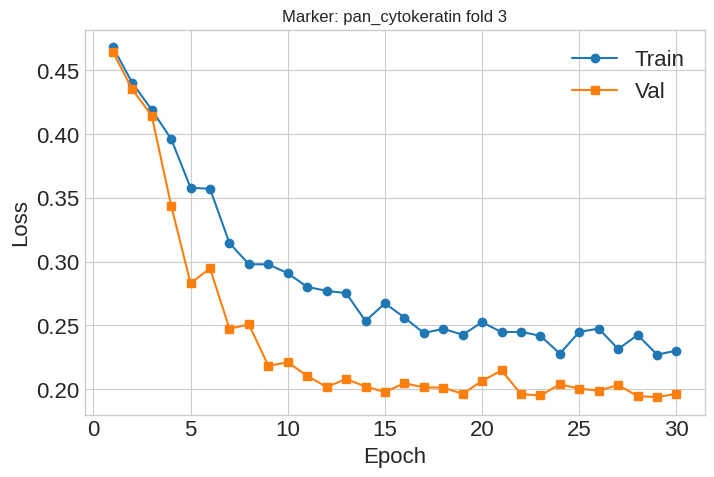

Starting fold 4 for marker pan_cytokeratin...
Projecting images to 3 PCs captures 57.82% of variance
Validation batch 3, sample 0 SSIM returned NaN or Inf, skipping batch
Epoch   1 | Train 0.4751 | Val 0.3721
  ↳ New best val=0.3721 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.4272 | Val 0.3516
  ↳ New best val=0.3516 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4104 | Val 0.4586
  ↳ No improvement (1/6 patience)
Epoch   4 | Train 0.3817 | Val 0.3442
  ↳ New best val=0.3442 at epoch 4
  ↳ Saved checkpoint to best_model.pth
Epoch   5 | Train 0.3504 | Val 0.3160
  ↳ New best val=0.3160 at epoch 5
  ↳ Saved checkpoint to best_model.pth
Epoch   6 | Train 0.3238 | Val 0.3063
  ↳ New best val=0.3063 at epoch 6
  ↳ Saved checkpoint to best_model.pth
Epoch   7 | Train 0.3088 | Val 0.2905
  ↳ New best val=0.2905 at epoch 7
  ↳ Saved checkpoint to best_model.pth
Epoch   8 | Train 0.2956 | Val 0.2562
  ↳ New best val=0.2562 at epoch 8
  ↳ Saved ch

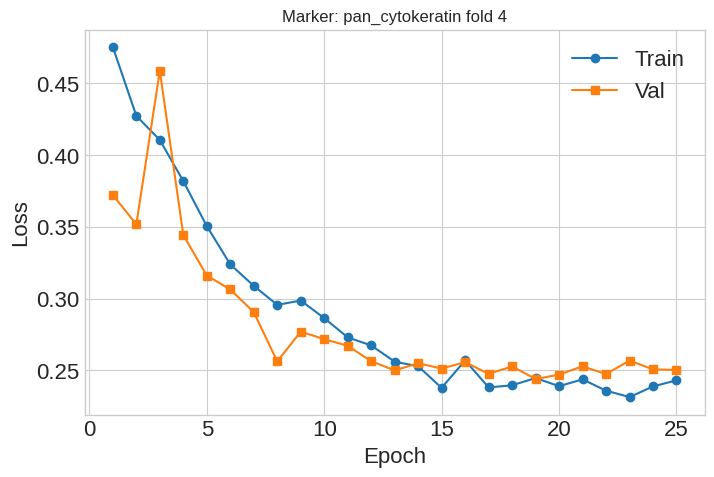

Starting fold 5 for marker pan_cytokeratin...
Projecting images to 3 PCs captures 58.51% of variance
Epoch   1 | Train 0.4845 | Val 0.4889
  ↳ New best val=0.4889 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.4422 | Val 0.4522
  ↳ New best val=0.4522 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4259 | Val 0.4288
  ↳ New best val=0.4288 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.4092 | Val 0.3895
  ↳ New best val=0.3895 at epoch 4
  ↳ Saved checkpoint to best_model.pth
Epoch   5 | Train 0.3764 | Val 0.4635
  ↳ No improvement (1/6 patience)
Epoch   6 | Train 0.3566 | Val 0.3146
  ↳ New best val=0.3146 at epoch 6
  ↳ Saved checkpoint to best_model.pth
Epoch   7 | Train 0.3282 | Val 0.3014
  ↳ New best val=0.3014 at epoch 7
  ↳ Saved checkpoint to best_model.pth
Epoch   8 | Train 0.3149 | Val 0.3104
  ↳ No improvement (1/6 patience)
Epoch   9 | Train 0.2958 | Val 0.2905
  ↳ New best val=0.2905 at epoch 9
  ↳ Saved 

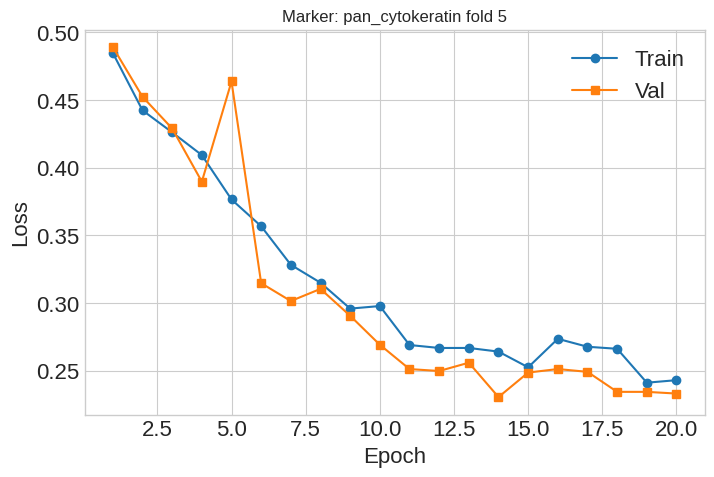

Marker: cytokeratin_5
Starting fold 1 for marker cytokeratin_5...
Projecting images to 3 PCs captures 74.15% of variance
Epoch   1 | Train 0.5402 | Val 0.5400
  ↳ New best val=0.5400 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.5141 | Val 0.5092
  ↳ New best val=0.5092 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.5072 | Val 0.4958
  ↳ New best val=0.4958 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.5086 | Val 0.3837
  ↳ New best val=0.3837 at epoch 4
  ↳ Saved checkpoint to best_model.pth
Epoch   5 | Train 0.4928 | Val 0.4488
  ↳ No improvement (1/6 patience)
Epoch   6 | Train 0.4779 | Val 0.3925
  ↳ No improvement (2/6 patience)
Epoch   7 | Train 0.4581 | Val 0.3766
  ↳ New best val=0.3766 at epoch 7
  ↳ Saved checkpoint to best_model.pth
Epoch   8 | Train 0.4673 | Val 0.4265
  ↳ No improvement (1/6 patience)
Epoch   9 | Train 0.4720 | Val 0.3755
  ↳ New best val=0.3755 at epoch 9
  ↳ Saved checkpoint to best_m

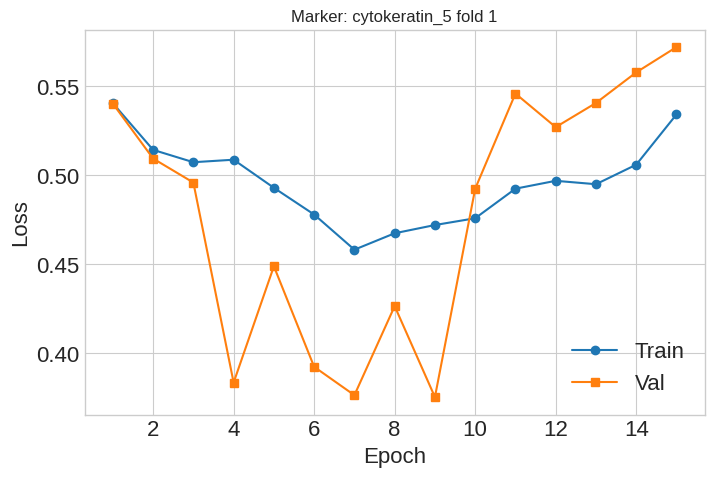

Starting fold 2 for marker cytokeratin_5...
Projecting images to 3 PCs captures 75.86% of variance
Epoch   1 | Train 0.5114 | Val 0.5880
  ↳ New best val=0.5880 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.4969 | Val 0.4413
  ↳ New best val=0.4413 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4716 | Val 0.4597
  ↳ No improvement (1/6 patience)
Epoch   4 | Train 0.4537 | Val 0.4527
  ↳ No improvement (2/6 patience)
Epoch   5 | Train 0.4406 | Val 0.4276
  ↳ New best val=0.4276 at epoch 5
  ↳ Saved checkpoint to best_model.pth
Epoch   6 | Train 0.4311 | Val 0.4326
  ↳ No improvement (1/6 patience)
Epoch   7 | Train 0.4281 | Val 0.4437
  ↳ No improvement (2/6 patience)
Epoch   8 | Train 0.4076 | Val 0.4010
  ↳ New best val=0.4010 at epoch 8
  ↳ Saved checkpoint to best_model.pth
Epoch   9 | Train 0.4170 | Val 0.3538
  ↳ New best val=0.3538 at epoch 9
  ↳ Saved checkpoint to best_model.pth
Epoch  10 | Train 0.4258 | Val 0.4092
  ↳ No improvem

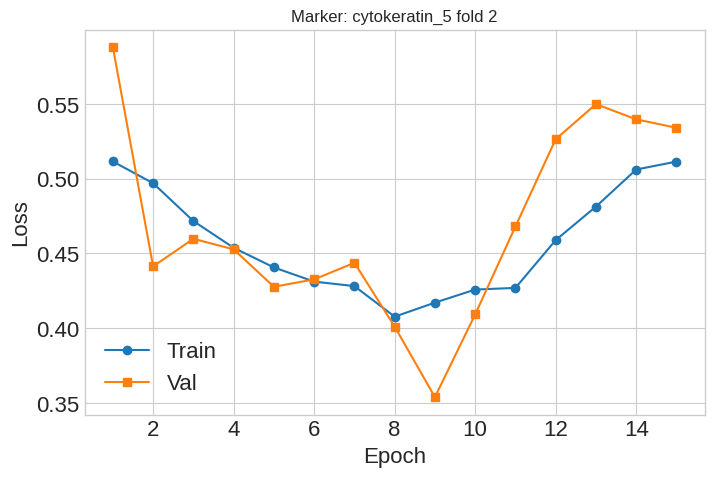

Starting fold 3 for marker cytokeratin_5...
Projecting images to 3 PCs captures 75.96% of variance
Epoch   1 | Train 0.5259 | Val 0.5018
  ↳ New best val=0.5018 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.5024 | Val 0.4615
  ↳ New best val=0.4615 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4946 | Val 0.4553
  ↳ New best val=0.4553 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.4857 | Val 0.4011
  ↳ New best val=0.4011 at epoch 4
  ↳ Saved checkpoint to best_model.pth
Epoch   5 | Train 0.4744 | Val 0.4516
  ↳ No improvement (1/6 patience)
Epoch   6 | Train 0.4628 | Val 0.3377
  ↳ New best val=0.3377 at epoch 6
  ↳ Saved checkpoint to best_model.pth
Epoch   7 | Train 0.4318 | Val 0.3495
  ↳ No improvement (1/6 patience)
Epoch   8 | Train 0.4210 | Val 0.3363
  ↳ New best val=0.3363 at epoch 8
  ↳ Saved checkpoint to best_model.pth
Epoch   9 | Train 0.4129 | Val 0.3626
  ↳ No improvement (1/6 patience)
Epoch  10 | T

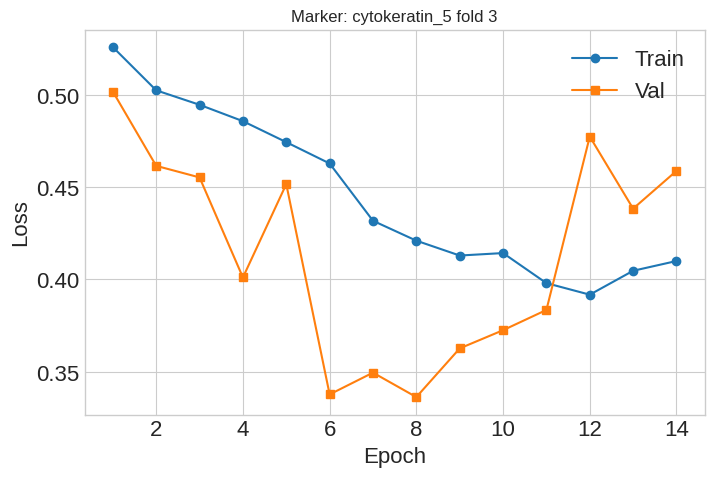

Starting fold 4 for marker cytokeratin_5...
Projecting images to 3 PCs captures 74.91% of variance
Epoch   1 | Train 0.5124 | Val 0.4958
  ↳ New best val=0.4958 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.4969 | Val 0.5235
  ↳ No improvement (1/6 patience)
Epoch   3 | Train 0.4771 | Val 0.3989
  ↳ New best val=0.3989 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.4445 | Val 0.3673
  ↳ New best val=0.3673 at epoch 4
  ↳ Saved checkpoint to best_model.pth
Epoch   5 | Train 0.4312 | Val 0.3997
  ↳ No improvement (1/6 patience)
Epoch   6 | Train 0.4101 | Val 0.3278
  ↳ New best val=0.3278 at epoch 6
  ↳ Saved checkpoint to best_model.pth
Epoch   7 | Train 0.3816 | Val 0.3538
  ↳ No improvement (1/6 patience)
Epoch   8 | Train 0.3907 | Val 0.3612
  ↳ No improvement (2/6 patience)
Epoch   9 | Train 0.3689 | Val 0.3379
  ↳ No improvement (3/6 patience)
Epoch  10 | Train 0.3751 | Val 0.3720
  ↳ No improvement (4/6 patience)
Epoch  11 | Train 0.4

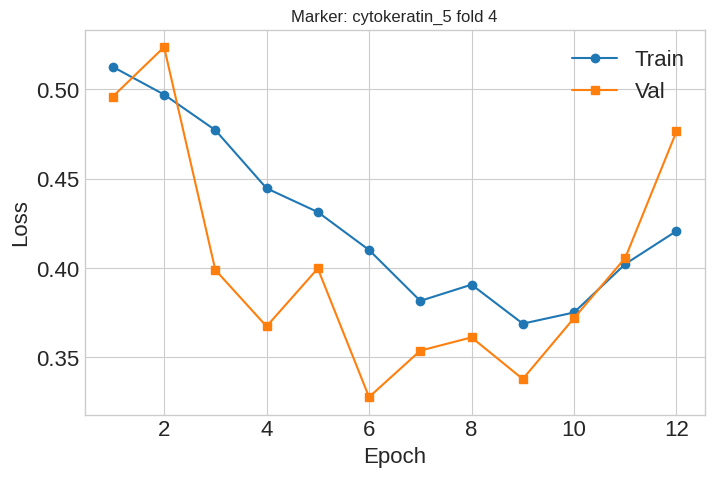

Starting fold 5 for marker cytokeratin_5...
Projecting images to 3 PCs captures 76.57% of variance
Epoch   1 | Train 0.5226 | Val 0.5015
  ↳ New best val=0.5015 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.5017 | Val 0.4381
  ↳ New best val=0.4381 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4791 | Val 0.4138
  ↳ New best val=0.4138 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.4574 | Val 0.4720
  ↳ No improvement (1/6 patience)
Epoch   5 | Train 0.4399 | Val 0.4371
  ↳ No improvement (2/6 patience)
Epoch   6 | Train 0.4243 | Val 0.3841
  ↳ New best val=0.3841 at epoch 6
  ↳ Saved checkpoint to best_model.pth
Epoch   7 | Train 0.4060 | Val 0.3944
  ↳ No improvement (1/6 patience)
Epoch   8 | Train 0.3946 | Val 0.3483
  ↳ New best val=0.3483 at epoch 8
  ↳ Saved checkpoint to best_model.pth
Epoch   9 | Train 0.3773 | Val 0.3316
  ↳ New best val=0.3316 at epoch 9
  ↳ Saved checkpoint to best_model.pth
Epoch  10 | T

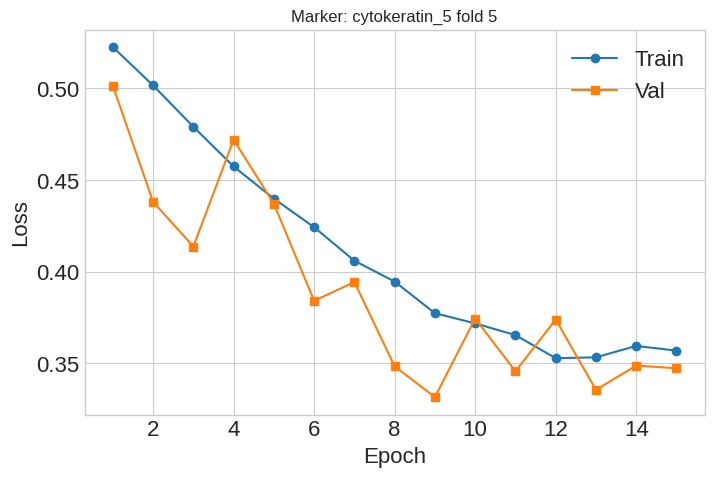

Marker: cytokeratin_8_18
Starting fold 1 for marker cytokeratin_8_18...
Projecting images to 3 PCs captures 74.50% of variance
Epoch   1 | Train 0.5310 | Val 0.5374
  ↳ New best val=0.5374 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.4970 | Val 0.5074
  ↳ New best val=0.5074 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4889 | Val 0.5068
  ↳ New best val=0.5068 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.4878 | Val 0.4993
  ↳ New best val=0.4993 at epoch 4
  ↳ Saved checkpoint to best_model.pth
Epoch   5 | Train 0.4799 | Val 0.4872
  ↳ New best val=0.4872 at epoch 5
  ↳ Saved checkpoint to best_model.pth
Epoch   6 | Train 0.4717 | Val 0.4924
  ↳ No improvement (1/6 patience)
Epoch   7 | Train 0.4574 | Val 0.3818
  ↳ New best val=0.3818 at epoch 7
  ↳ Saved checkpoint to best_model.pth
Epoch   8 | Train 0.4599 | Val 0.4943
  ↳ No improvement (1/6 patience)
Epoch   9 | Train 0.4114 | Val 0.3142
  ↳ New best val=0.

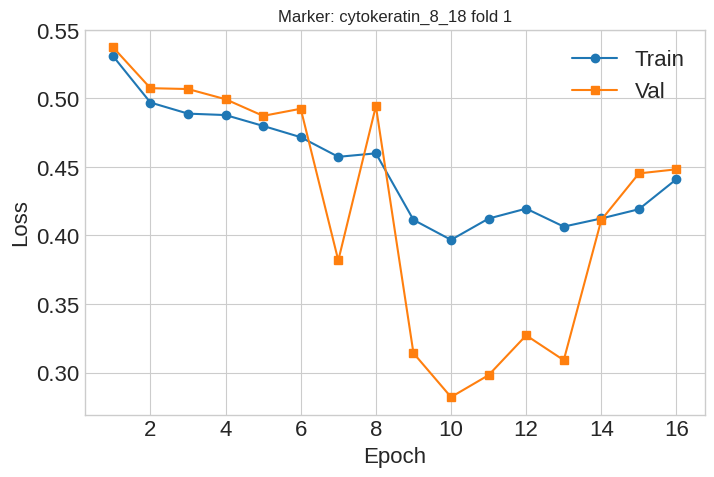

Starting fold 2 for marker cytokeratin_8_18...
Projecting images to 3 PCs captures 76.44% of variance
Epoch   1 | Train 0.5029 | Val 0.3630
  ↳ New best val=0.3630 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.4803 | Val 0.3880
  ↳ No improvement (1/6 patience)
Epoch   3 | Train 0.4623 | Val 0.4523
  ↳ No improvement (2/6 patience)
Epoch   4 | Train 0.4365 | Val 0.4033
  ↳ No improvement (3/6 patience)
Epoch   5 | Train 0.3967 | Val 0.3293
  ↳ New best val=0.3293 at epoch 5
  ↳ Saved checkpoint to best_model.pth
Epoch   6 | Train 0.4115 | Val 0.3641
  ↳ No improvement (1/6 patience)
Epoch   7 | Train 0.3886 | Val 0.3333
  ↳ No improvement (2/6 patience)
Epoch   8 | Train 0.4026 | Val 0.3254
  ↳ New best val=0.3254 at epoch 8
  ↳ Saved checkpoint to best_model.pth
Epoch   9 | Train 0.4068 | Val 0.5221
  ↳ No improvement (1/6 patience)
Epoch  10 | Train 0.4092 | Val 0.4007
  ↳ No improvement (2/6 patience)
Epoch  11 | Train 0.4194 | Val 0.4066
  ↳ No improvement (

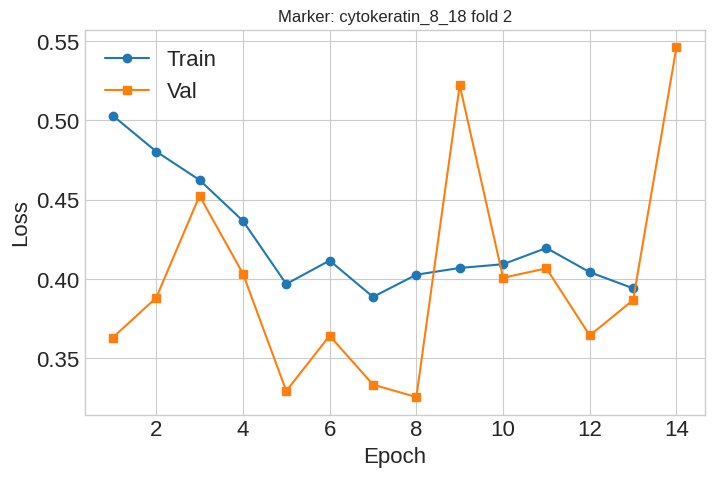

Starting fold 3 for marker cytokeratin_8_18...
Projecting images to 3 PCs captures 76.63% of variance
Epoch   1 | Train 0.5165 | Val 0.5029
  ↳ New best val=0.5029 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.4924 | Val 0.4830
  ↳ New best val=0.4830 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4818 | Val 0.4752
  ↳ New best val=0.4752 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.4767 | Val 0.4604
  ↳ New best val=0.4604 at epoch 4
  ↳ Saved checkpoint to best_model.pth
Epoch   5 | Train 0.4568 | Val 0.3304
  ↳ New best val=0.3304 at epoch 5
  ↳ Saved checkpoint to best_model.pth
Epoch   6 | Train 0.4376 | Val 0.4739
  ↳ No improvement (1/6 patience)
Epoch   7 | Train 0.3823 | Val 0.3277
  ↳ New best val=0.3277 at epoch 7
  ↳ Saved checkpoint to best_model.pth
Epoch   8 | Train 0.3680 | Val 0.3144
  ↳ New best val=0.3144 at epoch 8
  ↳ Saved checkpoint to best_model.pth
Epoch   9 | Train 0.3599 | Val 0.2841
  ↳ 

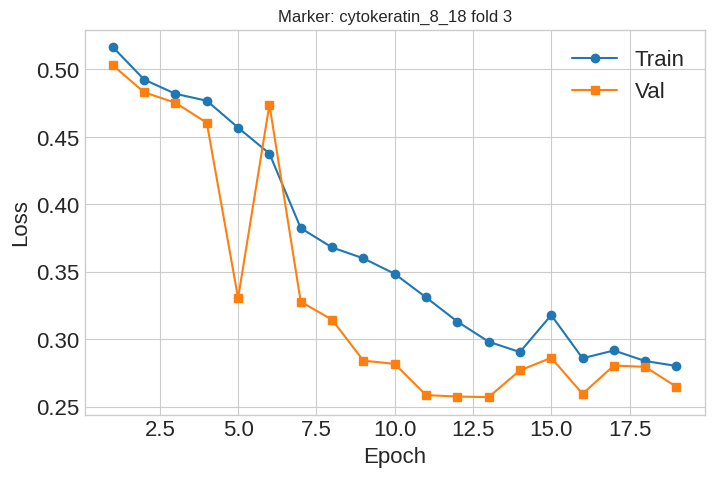

Starting fold 4 for marker cytokeratin_8_18...
Projecting images to 3 PCs captures 75.40% of variance
Epoch   1 | Train 0.5025 | Val 0.3554
  ↳ New best val=0.3554 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.4684 | Val 0.3755
  ↳ No improvement (1/6 patience)
Epoch   3 | Train 0.4423 | Val 0.3667
  ↳ No improvement (2/6 patience)
Epoch   4 | Train 0.4264 | Val 0.3721
  ↳ No improvement (3/6 patience)
Epoch   5 | Train 0.4034 | Val 0.3316
  ↳ New best val=0.3316 at epoch 5
  ↳ Saved checkpoint to best_model.pth
Epoch   6 | Train 0.3814 | Val 0.3753
  ↳ No improvement (1/6 patience)
Epoch   7 | Train 0.3720 | Val 0.3299
  ↳ New best val=0.3299 at epoch 7
  ↳ Saved checkpoint to best_model.pth
Epoch   8 | Train 0.3505 | Val 0.3456
  ↳ No improvement (1/6 patience)
Epoch   9 | Train 0.3522 | Val 0.3033
  ↳ New best val=0.3033 at epoch 9
  ↳ Saved checkpoint to best_model.pth
Epoch  10 | Train 0.3387 | Val 0.3044
  ↳ No improvement (1/6 patience)
Epoch  11 | Train 

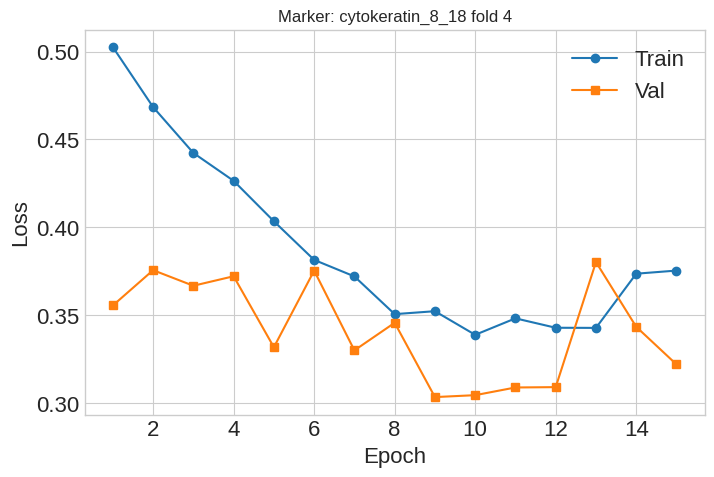

Starting fold 5 for marker cytokeratin_8_18...
Projecting images to 3 PCs captures 77.14% of variance
Epoch   1 | Train 0.5283 | Val 0.5169
  ↳ New best val=0.5169 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.4990 | Val 0.4978
  ↳ New best val=0.4978 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4919 | Val 0.4911
  ↳ New best val=0.4911 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.4835 | Val 0.4729
  ↳ New best val=0.4729 at epoch 4
  ↳ Saved checkpoint to best_model.pth
Epoch   5 | Train 0.4707 | Val 0.4665
  ↳ New best val=0.4665 at epoch 5
  ↳ Saved checkpoint to best_model.pth
Epoch   6 | Train 0.4620 | Val 0.3882
  ↳ New best val=0.3882 at epoch 6
  ↳ Saved checkpoint to best_model.pth
Epoch   7 | Train 0.4215 | Val 0.3998
  ↳ No improvement (1/6 patience)
Epoch   8 | Train 0.4192 | Val 0.4086
  ↳ No improvement (2/6 patience)
Epoch   9 | Train 0.4148 | Val 0.4484
  ↳ No improvement (3/6 patience)
Epoch  10 

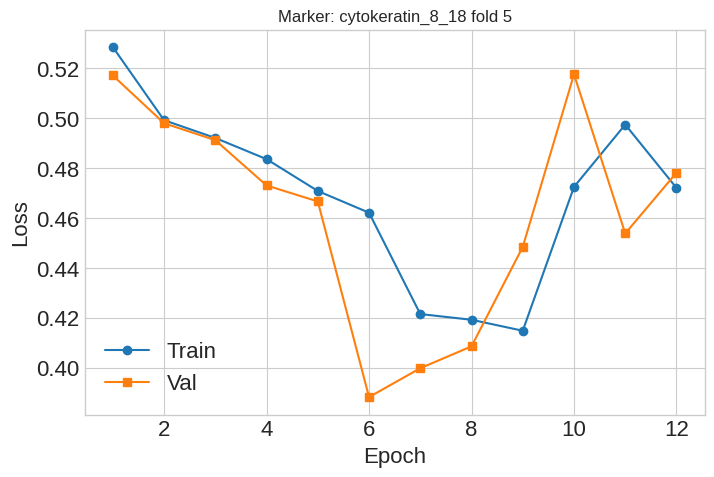

Total training time across all markers: 123.57 minutes


In [ ]:
control = [0,37,38] #histone_h3, dna1, dna2

marker_tasks = [
    ("ki67", 28, control),
    ("CD3", 13, control),
    ("CD20", 24, control),
    ("CD45", 22, control),
    ("CD68", 11, control),
    ("sma", 1, control),
    ("pan_cytokeratin", 35, control),
    ("cytokeratin_5", 2, control),
    ("cytokeratin_8_18", 5, control),

    #Keren 2018:
    #("CD11c", 15, control),
    #("CD16", 18, control),
    #("hla_dr", 4, control),
]

d_results = []
start_time = time.time()

#K-fold with K=5
for title, target_idx, control_markers_indices in marker_tasks:
    print(f"Marker: {title}")
    res = main(target_idx, control_markers_indices, title=title)
    d_results.append(res)
    del res

total_time = time.time() - start_time
print(f"Total training time across all markers: {total_time/60:.2f} minutes")



In [ ]:
d_df = pd.DataFrame(d_results)

from google.colab import files
d_df.to_csv("d_results_9Sep_5fold.csv", index=False)
files.download("d_results_9Sep_5fold.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#d_df = pd.read_csv("d_results_9Sep_5fold.csv")
d_df.head()


,marker,RMSE_mean,RMSE_std,Pearson_mean,Pearson_std,R2_mean,R2_std
0,ki67,0.271127,0.047052,0.044328,0.017426,-53.065883,12.832474
1,CD3,0.166591,0.086731,0.049078,0.007454,-13.463264,13.786746
2,CD20,0.171062,0.072629,0.038145,0.044427,-61.976014,47.469434
3,CD45,0.178634,0.036003,0.147215,0.072426,-16.075906,10.039185
4,CD68,0.242371,0.086242,0.026860,0.016585,-53.512059,33.551381


### Proof of Concept - Laussane

Marker: pan_cytokeratin
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 170MB/s]


Starting training...


Epoch 1: 100%|██████████| 19/19 [00:07<00:00,  2.63it/s]


---Epoch 1: Train Loss=0.3792, Val Loss=0.3205


Epoch 2: 100%|██████████| 19/19 [00:04<00:00,  4.14it/s]


---Epoch 2: Train Loss=0.3202, Val Loss=0.3204


Epoch 3: 100%|██████████| 19/19 [00:04<00:00,  4.24it/s]


---Epoch 3: Train Loss=0.3202, Val Loss=0.3204


Epoch 4: 100%|██████████| 19/19 [00:04<00:00,  4.02it/s]


---Epoch 4: Train Loss=0.3201, Val Loss=0.3203


Epoch 5: 100%|██████████| 19/19 [00:04<00:00,  3.90it/s]


---Epoch 5: Train Loss=0.3202, Val Loss=0.3205


Epoch 6: 100%|██████████| 19/19 [00:04<00:00,  4.07it/s]


---Epoch 6: Train Loss=0.3197, Val Loss=0.3180


Epoch 7: 100%|██████████| 19/19 [00:04<00:00,  3.85it/s]


---Epoch 7: Train Loss=0.3067, Val Loss=0.2957


Epoch 8: 100%|██████████| 19/19 [00:04<00:00,  4.05it/s]


---Epoch 8: Train Loss=0.2908, Val Loss=0.3014


Epoch 9: 100%|██████████| 19/19 [00:04<00:00,  4.09it/s]


---Epoch 9: Train Loss=0.3096, Val Loss=0.2745


Epoch 10: 100%|██████████| 19/19 [00:04<00:00,  4.18it/s]


---Epoch 10: Train Loss=0.2845, Val Loss=0.2688


Epoch 11: 100%|██████████| 19/19 [00:04<00:00,  3.87it/s]


---Epoch 11: Train Loss=0.2864, Val Loss=0.2647


Epoch 12: 100%|██████████| 19/19 [00:04<00:00,  4.02it/s]


---Epoch 12: Train Loss=0.2568, Val Loss=0.2458


Epoch 13: 100%|██████████| 19/19 [00:04<00:00,  3.85it/s]


---Epoch 13: Train Loss=0.2540, Val Loss=0.2339


Epoch 14: 100%|██████████| 19/19 [00:04<00:00,  4.03it/s]


---Epoch 14: Train Loss=0.2598, Val Loss=0.2528


Epoch 15: 100%|██████████| 19/19 [00:05<00:00,  3.74it/s]


---Epoch 15: Train Loss=0.2807, Val Loss=0.2381


Epoch 16: 100%|██████████| 19/19 [00:04<00:00,  4.06it/s]


---Epoch 16: Train Loss=0.2556, Val Loss=0.2522


Epoch 17: 100%|██████████| 19/19 [00:04<00:00,  4.01it/s]


---Epoch 17: Train Loss=0.2646, Val Loss=0.2300


Epoch 18: 100%|██████████| 19/19 [00:04<00:00,  3.90it/s]


---Epoch 18: Train Loss=0.2542, Val Loss=0.2492


Epoch 19: 100%|██████████| 19/19 [00:04<00:00,  3.84it/s]


---Epoch 19: Train Loss=0.2694, Val Loss=0.2491


Epoch 20: 100%|██████████| 19/19 [00:04<00:00,  3.85it/s]


---Epoch 20: Train Loss=0.2471, Val Loss=0.2314


Epoch 21: 100%|██████████| 19/19 [00:05<00:00,  3.72it/s]


---Epoch 21: Train Loss=0.2544, Val Loss=0.2342


Epoch 22: 100%|██████████| 19/19 [00:04<00:00,  3.90it/s]


---Epoch 22: Train Loss=0.2432, Val Loss=0.2250


Epoch 23: 100%|██████████| 19/19 [00:04<00:00,  3.95it/s]


---Epoch 23: Train Loss=0.2414, Val Loss=0.2235


Epoch 24: 100%|██████████| 19/19 [00:04<00:00,  3.95it/s]


---Epoch 24: Train Loss=0.2360, Val Loss=0.2273


Epoch 25: 100%|██████████| 19/19 [00:04<00:00,  4.01it/s]


---Epoch 25: Train Loss=0.2434, Val Loss=0.2322


Epoch 26: 100%|██████████| 19/19 [00:04<00:00,  3.99it/s]


---Epoch 26: Train Loss=0.2360, Val Loss=0.2362


Epoch 27: 100%|██████████| 19/19 [00:04<00:00,  3.81it/s]


---Epoch 27: Train Loss=0.2466, Val Loss=0.2361


Epoch 28: 100%|██████████| 19/19 [00:04<00:00,  3.93it/s]


---Epoch 28: Train Loss=0.2376, Val Loss=0.2227


Epoch 29: 100%|██████████| 19/19 [00:04<00:00,  3.94it/s]


---Epoch 29: Train Loss=0.2336, Val Loss=0.2210


Epoch 30: 100%|██████████| 19/19 [00:05<00:00,  3.79it/s]


---Epoch 30: Train Loss=0.2308, Val Loss=0.2225


Epoch 31: 100%|██████████| 19/19 [00:04<00:00,  4.03it/s]


---Epoch 31: Train Loss=0.2311, Val Loss=0.2400


Epoch 32: 100%|██████████| 19/19 [00:05<00:00,  3.66it/s]


---Epoch 32: Train Loss=0.2378, Val Loss=0.2213


Epoch 33: 100%|██████████| 19/19 [00:04<00:00,  3.82it/s]


---Epoch 33: Train Loss=0.2228, Val Loss=0.2212


Epoch 34: 100%|██████████| 19/19 [00:05<00:00,  3.51it/s]


---Epoch 34: Train Loss=0.2273, Val Loss=0.2191


Epoch 35: 100%|██████████| 19/19 [00:04<00:00,  3.94it/s]


---Epoch 35: Train Loss=0.2307, Val Loss=0.2234


Epoch 36: 100%|██████████| 19/19 [00:05<00:00,  3.75it/s]


---Epoch 36: Train Loss=0.2241, Val Loss=0.2276


Epoch 37: 100%|██████████| 19/19 [00:04<00:00,  3.86it/s]


---Epoch 37: Train Loss=0.2273, Val Loss=0.2168


Epoch 38: 100%|██████████| 19/19 [00:05<00:00,  3.71it/s]


---Epoch 38: Train Loss=0.2229, Val Loss=0.2168


Epoch 39: 100%|██████████| 19/19 [00:05<00:00,  3.78it/s]


---Epoch 39: Train Loss=0.2318, Val Loss=0.2416


Epoch 40: 100%|██████████| 19/19 [00:05<00:00,  3.73it/s]


---Epoch 40: Train Loss=0.2445, Val Loss=0.2369


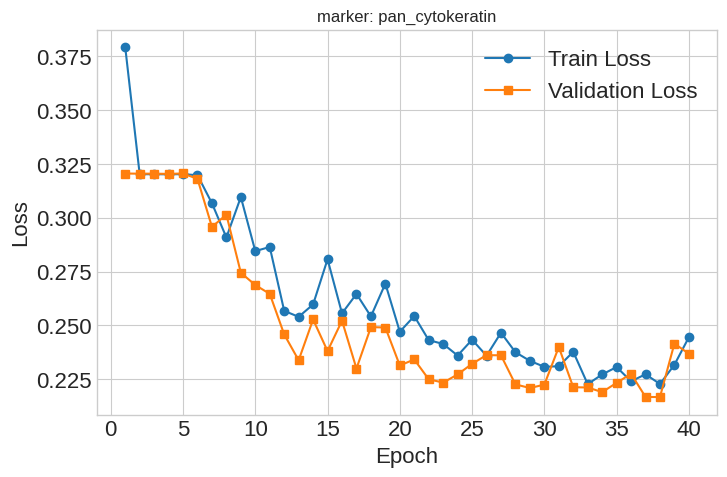

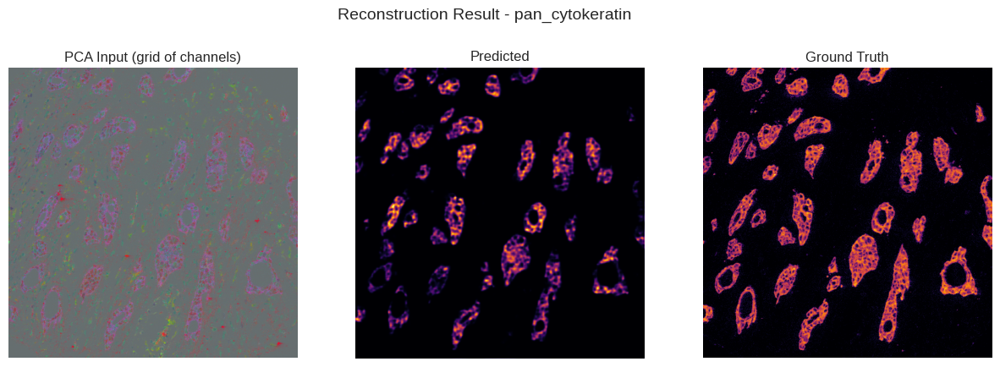

Marker: ERα
Starting training...


Epoch 1: 100%|██████████| 19/19 [00:04<00:00,  4.08it/s]


---Epoch 1: Train Loss=0.4345, Val Loss=0.3780


Epoch 2: 100%|██████████| 19/19 [00:04<00:00,  4.05it/s]


---Epoch 2: Train Loss=0.3709, Val Loss=0.3517


Epoch 3: 100%|██████████| 19/19 [00:04<00:00,  4.22it/s]


---Epoch 3: Train Loss=0.3432, Val Loss=0.3223


Epoch 4: 100%|██████████| 19/19 [00:04<00:00,  3.93it/s]


---Epoch 4: Train Loss=0.3202, Val Loss=0.3093


Epoch 5: 100%|██████████| 19/19 [00:05<00:00,  3.77it/s]


---Epoch 5: Train Loss=0.3210, Val Loss=0.3117


Epoch 6: 100%|██████████| 19/19 [00:04<00:00,  3.96it/s]


---Epoch 6: Train Loss=0.3175, Val Loss=0.2984


Epoch 7: 100%|██████████| 19/19 [00:05<00:00,  3.72it/s]


---Epoch 7: Train Loss=0.3053, Val Loss=0.2908


Epoch 8: 100%|██████████| 19/19 [00:04<00:00,  3.94it/s]


---Epoch 8: Train Loss=0.2976, Val Loss=0.2974


Epoch 9: 100%|██████████| 19/19 [00:04<00:00,  3.94it/s]


---Epoch 9: Train Loss=0.2937, Val Loss=0.2910


Epoch 10: 100%|██████████| 19/19 [00:04<00:00,  4.05it/s]


---Epoch 10: Train Loss=0.3173, Val Loss=0.2954


Epoch 11: 100%|██████████| 19/19 [00:05<00:00,  3.75it/s]


---Epoch 11: Train Loss=0.2935, Val Loss=0.2799


Epoch 12: 100%|██████████| 19/19 [00:04<00:00,  3.90it/s]


---Epoch 12: Train Loss=0.2919, Val Loss=0.2969


Epoch 13: 100%|██████████| 19/19 [00:05<00:00,  3.73it/s]


---Epoch 13: Train Loss=0.2933, Val Loss=0.2768


Epoch 14: 100%|██████████| 19/19 [00:04<00:00,  3.95it/s]


---Epoch 14: Train Loss=0.2937, Val Loss=0.2955


Epoch 15: 100%|██████████| 19/19 [00:04<00:00,  3.86it/s]


---Epoch 15: Train Loss=0.2859, Val Loss=0.2821


Epoch 16: 100%|██████████| 19/19 [00:04<00:00,  3.97it/s]


---Epoch 16: Train Loss=0.2904, Val Loss=0.2724


Epoch 17: 100%|██████████| 19/19 [00:04<00:00,  3.92it/s]


---Epoch 17: Train Loss=0.2896, Val Loss=0.2689


Epoch 18: 100%|██████████| 19/19 [00:05<00:00,  3.79it/s]


---Epoch 18: Train Loss=0.2855, Val Loss=0.2784


Epoch 19: 100%|██████████| 19/19 [00:05<00:00,  3.77it/s]


---Epoch 19: Train Loss=0.2929, Val Loss=0.2844


Epoch 20: 100%|██████████| 19/19 [00:05<00:00,  3.76it/s]


---Epoch 20: Train Loss=0.2916, Val Loss=0.2691


Epoch 21: 100%|██████████| 19/19 [00:05<00:00,  3.66it/s]


---Epoch 21: Train Loss=0.2758, Val Loss=0.2725


Epoch 22: 100%|██████████| 19/19 [00:04<00:00,  3.83it/s]


---Epoch 22: Train Loss=0.2721, Val Loss=0.2711


Epoch 23: 100%|██████████| 19/19 [00:04<00:00,  3.88it/s]


---Epoch 23: Train Loss=0.2752, Val Loss=0.2756


Epoch 24: 100%|██████████| 19/19 [00:04<00:00,  3.86it/s]


---Epoch 24: Train Loss=0.2798, Val Loss=0.2659


Epoch 25: 100%|██████████| 19/19 [00:04<00:00,  3.95it/s]


---Epoch 25: Train Loss=0.2753, Val Loss=0.3195


Epoch 26: 100%|██████████| 19/19 [00:04<00:00,  3.90it/s]


---Epoch 26: Train Loss=0.2766, Val Loss=0.2651


Epoch 27: 100%|██████████| 19/19 [00:05<00:00,  3.71it/s]


---Epoch 27: Train Loss=0.2773, Val Loss=0.2629


Epoch 28: 100%|██████████| 19/19 [00:04<00:00,  3.91it/s]


---Epoch 28: Train Loss=0.2836, Val Loss=0.2747


Epoch 29: 100%|██████████| 19/19 [00:04<00:00,  3.88it/s]


---Epoch 29: Train Loss=0.2815, Val Loss=0.2741


Epoch 30: 100%|██████████| 19/19 [00:05<00:00,  3.77it/s]


---Epoch 30: Train Loss=0.2872, Val Loss=0.2685


Epoch 31: 100%|██████████| 19/19 [00:04<00:00,  3.97it/s]


---Epoch 31: Train Loss=0.2785, Val Loss=0.3078


Epoch 32: 100%|██████████| 19/19 [00:05<00:00,  3.61it/s]


---Epoch 32: Train Loss=0.2806, Val Loss=0.2752


Epoch 33: 100%|██████████| 19/19 [00:05<00:00,  3.78it/s]


---Epoch 33: Train Loss=0.2728, Val Loss=0.2622


Epoch 34: 100%|██████████| 19/19 [00:05<00:00,  3.68it/s]


---Epoch 34: Train Loss=0.2709, Val Loss=0.2636


Epoch 35: 100%|██████████| 19/19 [00:04<00:00,  3.87it/s]


---Epoch 35: Train Loss=0.2692, Val Loss=0.2612


Epoch 36: 100%|██████████| 19/19 [00:05<00:00,  3.69it/s]


---Epoch 36: Train Loss=0.2719, Val Loss=0.2632


Epoch 37: 100%|██████████| 19/19 [00:04<00:00,  3.84it/s]


---Epoch 37: Train Loss=0.2689, Val Loss=0.2834


Epoch 38: 100%|██████████| 19/19 [00:05<00:00,  3.64it/s]


---Epoch 38: Train Loss=0.2818, Val Loss=0.2734


Epoch 39: 100%|██████████| 19/19 [00:05<00:00,  3.77it/s]


---Epoch 39: Train Loss=0.2830, Val Loss=0.2657


Epoch 40: 100%|██████████| 19/19 [00:05<00:00,  3.68it/s]


---Epoch 40: Train Loss=0.2817, Val Loss=0.2790


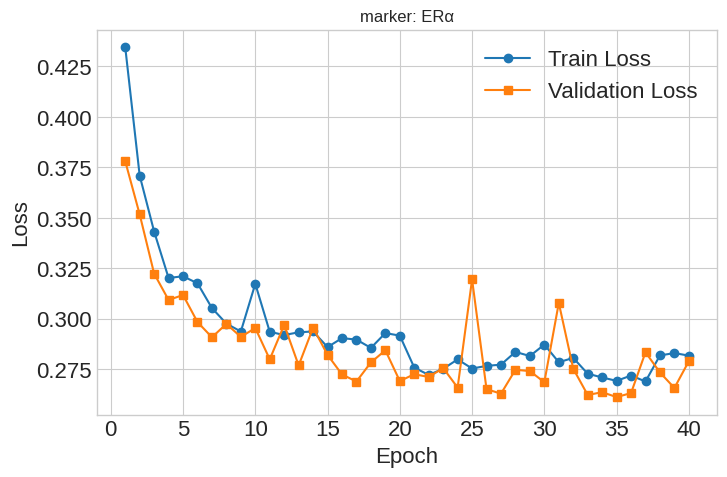

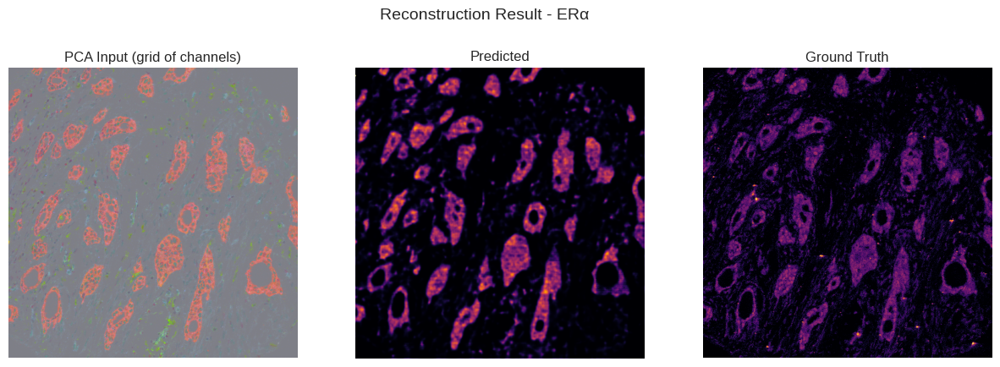

Marker: CD4
Starting training...


Epoch 1: 100%|██████████| 19/19 [00:04<00:00,  3.99it/s]


---Epoch 1: Train Loss=0.4035, Val Loss=0.3434


Epoch 2: 100%|██████████| 19/19 [00:04<00:00,  4.12it/s]


---Epoch 2: Train Loss=0.3571, Val Loss=0.3434


Epoch 3: 100%|██████████| 19/19 [00:04<00:00,  4.14it/s]


---Epoch 3: Train Loss=0.3571, Val Loss=0.3434


Epoch 4: 100%|██████████| 19/19 [00:04<00:00,  3.97it/s]


---Epoch 4: Train Loss=0.3571, Val Loss=0.3434


Epoch 5: 100%|██████████| 19/19 [00:05<00:00,  3.72it/s]


---Epoch 5: Train Loss=0.3571, Val Loss=0.3434


Epoch 6: 100%|██████████| 19/19 [00:04<00:00,  3.90it/s]


---Epoch 6: Train Loss=0.3542, Val Loss=0.3375


Epoch 7: 100%|██████████| 19/19 [00:05<00:00,  3.71it/s]


---Epoch 7: Train Loss=0.3494, Val Loss=0.3262


Epoch 8: 100%|██████████| 19/19 [00:04<00:00,  3.88it/s]


---Epoch 8: Train Loss=0.3508, Val Loss=0.3399


Epoch 9: 100%|██████████| 19/19 [00:04<00:00,  3.99it/s]


---Epoch 9: Train Loss=0.3568, Val Loss=0.3436


Epoch 10: 100%|██████████| 19/19 [00:04<00:00,  4.00it/s]


---Epoch 10: Train Loss=0.3570, Val Loss=0.3431


Epoch 11: 100%|██████████| 19/19 [00:05<00:00,  3.80it/s]


---Epoch 11: Train Loss=0.3568, Val Loss=0.3434


Epoch 12: 100%|██████████| 19/19 [00:04<00:00,  3.89it/s]


---Epoch 12: Train Loss=0.3558, Val Loss=0.3399


Epoch 13: 100%|██████████| 19/19 [00:05<00:00,  3.73it/s]


---Epoch 13: Train Loss=0.3453, Val Loss=0.3223


Epoch 14: 100%|██████████| 19/19 [00:04<00:00,  3.94it/s]


---Epoch 14: Train Loss=0.3478, Val Loss=0.3423


Epoch 15: 100%|██████████| 19/19 [00:05<00:00,  3.72it/s]


---Epoch 15: Train Loss=0.3479, Val Loss=0.3202


Epoch 16: 100%|██████████| 19/19 [00:04<00:00,  4.00it/s]


---Epoch 16: Train Loss=0.3280, Val Loss=0.3092


Epoch 17: 100%|██████████| 19/19 [00:04<00:00,  3.85it/s]


---Epoch 17: Train Loss=0.3234, Val Loss=0.3110


Epoch 18: 100%|██████████| 19/19 [00:04<00:00,  3.80it/s]


---Epoch 18: Train Loss=0.3207, Val Loss=0.3115


Epoch 19: 100%|██████████| 19/19 [00:05<00:00,  3.73it/s]


---Epoch 19: Train Loss=0.3320, Val Loss=0.3097


Epoch 20: 100%|██████████| 19/19 [00:05<00:00,  3.72it/s]


---Epoch 20: Train Loss=0.3257, Val Loss=0.3033


Epoch 21: 100%|██████████| 19/19 [00:05<00:00,  3.65it/s]


---Epoch 21: Train Loss=0.3196, Val Loss=0.3078


Epoch 22: 100%|██████████| 19/19 [00:05<00:00,  3.75it/s]


---Epoch 22: Train Loss=0.3176, Val Loss=0.3055


Epoch 23: 100%|██████████| 19/19 [00:04<00:00,  3.87it/s]


---Epoch 23: Train Loss=0.3216, Val Loss=0.3304


Epoch 24: 100%|██████████| 19/19 [00:05<00:00,  3.74it/s]


---Epoch 24: Train Loss=0.3241, Val Loss=0.3013


Epoch 25: 100%|██████████| 19/19 [00:04<00:00,  3.94it/s]


---Epoch 25: Train Loss=0.3280, Val Loss=0.3104


Epoch 26: 100%|██████████| 19/19 [00:04<00:00,  3.86it/s]


---Epoch 26: Train Loss=0.3134, Val Loss=0.3150


Epoch 27: 100%|██████████| 19/19 [00:05<00:00,  3.71it/s]


---Epoch 27: Train Loss=0.3269, Val Loss=0.3102


Epoch 28: 100%|██████████| 19/19 [00:04<00:00,  3.89it/s]


---Epoch 28: Train Loss=0.3117, Val Loss=0.2996


Epoch 29: 100%|██████████| 19/19 [00:04<00:00,  3.86it/s]


---Epoch 29: Train Loss=0.3124, Val Loss=0.3047


Epoch 30: 100%|██████████| 19/19 [00:05<00:00,  3.79it/s]


---Epoch 30: Train Loss=0.3165, Val Loss=0.2990


Epoch 31: 100%|██████████| 19/19 [00:04<00:00,  3.92it/s]


---Epoch 31: Train Loss=0.3099, Val Loss=0.2988


Epoch 32: 100%|██████████| 19/19 [00:05<00:00,  3.64it/s]


---Epoch 32: Train Loss=0.3086, Val Loss=0.2967


Epoch 33: 100%|██████████| 19/19 [00:05<00:00,  3.71it/s]


---Epoch 33: Train Loss=0.3111, Val Loss=0.2978


Epoch 34: 100%|██████████| 19/19 [00:05<00:00,  3.74it/s]


---Epoch 34: Train Loss=0.3071, Val Loss=0.2964


Epoch 35: 100%|██████████| 19/19 [00:04<00:00,  3.86it/s]


---Epoch 35: Train Loss=0.3122, Val Loss=0.2990


Epoch 36: 100%|██████████| 19/19 [00:05<00:00,  3.66it/s]


---Epoch 36: Train Loss=0.3057, Val Loss=0.2972


Epoch 37: 100%|██████████| 19/19 [00:04<00:00,  3.82it/s]


---Epoch 37: Train Loss=0.3075, Val Loss=0.3013


Epoch 38: 100%|██████████| 19/19 [00:05<00:00,  3.61it/s]


---Epoch 38: Train Loss=0.3065, Val Loss=0.2979


Epoch 39: 100%|██████████| 19/19 [00:05<00:00,  3.77it/s]


---Epoch 39: Train Loss=0.3079, Val Loss=0.3076


Epoch 40: 100%|██████████| 19/19 [00:05<00:00,  3.63it/s]


---Epoch 40: Train Loss=0.3087, Val Loss=0.3047


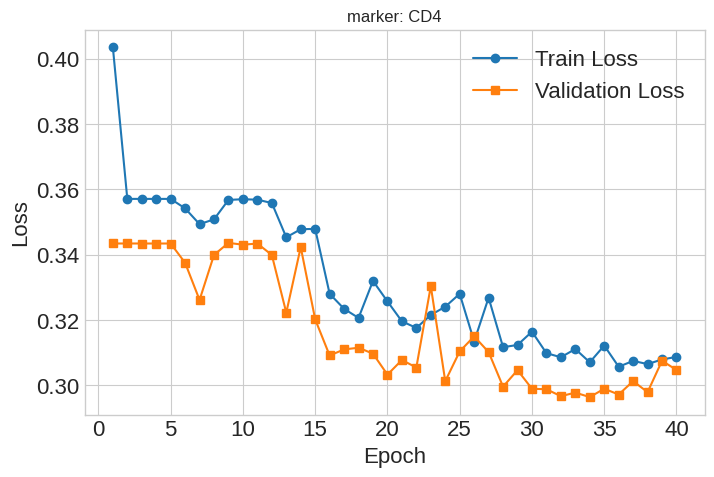

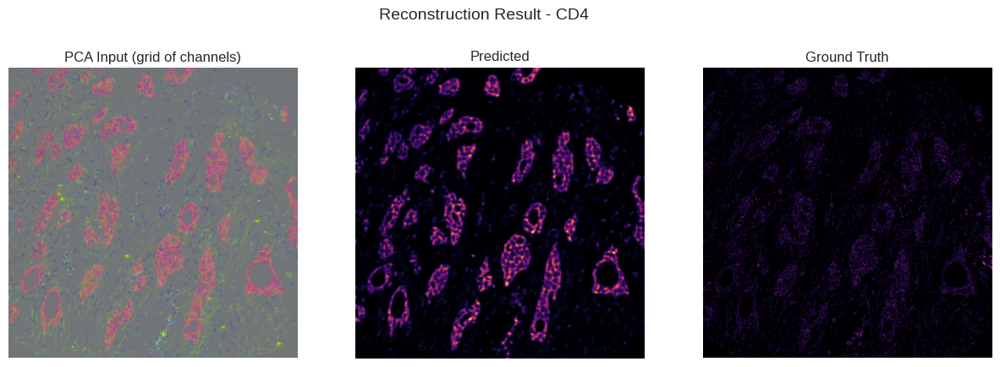

Marker: CD45ra
Starting training...


Epoch 1: 100%|██████████| 19/19 [00:04<00:00,  4.05it/s]


---Epoch 1: Train Loss=0.3833, Val Loss=0.3107


Epoch 2: 100%|██████████| 19/19 [00:04<00:00,  4.19it/s]


---Epoch 2: Train Loss=0.3303, Val Loss=0.3107


Epoch 3: 100%|██████████| 19/19 [00:04<00:00,  4.24it/s]


---Epoch 3: Train Loss=0.3303, Val Loss=0.3107


Epoch 4: 100%|██████████| 19/19 [00:04<00:00,  4.10it/s]


---Epoch 4: Train Loss=0.3303, Val Loss=0.3107


Epoch 5: 100%|██████████| 19/19 [00:04<00:00,  3.83it/s]


---Epoch 5: Train Loss=0.3303, Val Loss=0.3107


Epoch 6: 100%|██████████| 19/19 [00:04<00:00,  4.05it/s]


---Epoch 6: Train Loss=0.3303, Val Loss=0.3107


Epoch 7: 100%|██████████| 19/19 [00:04<00:00,  3.83it/s]


---Epoch 7: Train Loss=0.3303, Val Loss=0.3107


Epoch 8: 100%|██████████| 19/19 [00:04<00:00,  3.97it/s]


---Epoch 8: Train Loss=0.3303, Val Loss=0.3107


Epoch 9: 100%|██████████| 19/19 [00:04<00:00,  4.05it/s]


---Epoch 9: Train Loss=0.3303, Val Loss=0.3107


Epoch 10: 100%|██████████| 19/19 [00:04<00:00,  4.05it/s]


---Epoch 10: Train Loss=0.3303, Val Loss=0.3107


Epoch 11: 100%|██████████| 19/19 [00:04<00:00,  3.82it/s]


---Epoch 11: Train Loss=0.3303, Val Loss=0.3107


Epoch 12: 100%|██████████| 19/19 [00:04<00:00,  3.91it/s]


---Epoch 12: Train Loss=0.3303, Val Loss=0.3107


Epoch 13: 100%|██████████| 19/19 [00:05<00:00,  3.71it/s]


---Epoch 13: Train Loss=0.3303, Val Loss=0.3107


Epoch 14: 100%|██████████| 19/19 [00:04<00:00,  3.95it/s]


---Epoch 14: Train Loss=0.3303, Val Loss=0.3107


Epoch 15: 100%|██████████| 19/19 [00:05<00:00,  3.80it/s]


---Epoch 15: Train Loss=0.3299, Val Loss=0.3085


Epoch 16: 100%|██████████| 19/19 [00:04<00:00,  4.02it/s]


---Epoch 16: Train Loss=0.3310, Val Loss=0.3107


Epoch 17: 100%|██████████| 19/19 [00:04<00:00,  3.89it/s]


---Epoch 17: Train Loss=0.3303, Val Loss=0.3106


Epoch 18: 100%|██████████| 19/19 [00:04<00:00,  3.84it/s]


---Epoch 18: Train Loss=0.3303, Val Loss=0.3107


Epoch 19: 100%|██████████| 19/19 [00:05<00:00,  3.75it/s]


---Epoch 19: Train Loss=0.3303, Val Loss=0.3107


Epoch 20: 100%|██████████| 19/19 [00:05<00:00,  3.75it/s]


---Epoch 20: Train Loss=0.3303, Val Loss=0.3106


Epoch 21: 100%|██████████| 19/19 [00:05<00:00,  3.65it/s]


---Epoch 21: Train Loss=0.3302, Val Loss=0.3105


Epoch 22: 100%|██████████| 19/19 [00:05<00:00,  3.76it/s]


---Epoch 22: Train Loss=0.3302, Val Loss=0.3103


Epoch 23: 100%|██████████| 19/19 [00:04<00:00,  3.90it/s]


---Epoch 23: Train Loss=0.3296, Val Loss=0.3093


Epoch 24: 100%|██████████| 19/19 [00:04<00:00,  3.83it/s]


---Epoch 24: Train Loss=0.3226, Val Loss=0.3026


Epoch 25: 100%|██████████| 19/19 [00:04<00:00,  3.98it/s]


---Epoch 25: Train Loss=0.3257, Val Loss=0.3045


Epoch 26: 100%|██████████| 19/19 [00:04<00:00,  3.85it/s]


---Epoch 26: Train Loss=0.3201, Val Loss=0.2825


Epoch 27: 100%|██████████| 19/19 [00:05<00:00,  3.73it/s]


---Epoch 27: Train Loss=0.2985, Val Loss=0.2834


Epoch 28: 100%|██████████| 19/19 [00:04<00:00,  3.91it/s]


---Epoch 28: Train Loss=0.3200, Val Loss=0.2825


Epoch 29: 100%|██████████| 19/19 [00:04<00:00,  3.83it/s]


---Epoch 29: Train Loss=0.3075, Val Loss=0.2756


Epoch 30: 100%|██████████| 19/19 [00:05<00:00,  3.78it/s]


---Epoch 30: Train Loss=0.2941, Val Loss=0.2760


Epoch 31: 100%|██████████| 19/19 [00:04<00:00,  3.92it/s]


---Epoch 31: Train Loss=0.2879, Val Loss=0.2569


Epoch 32: 100%|██████████| 19/19 [00:05<00:00,  3.64it/s]


---Epoch 32: Train Loss=0.2796, Val Loss=0.2605


Epoch 33: 100%|██████████| 19/19 [00:05<00:00,  3.72it/s]


---Epoch 33: Train Loss=0.2761, Val Loss=0.3111


Epoch 34: 100%|██████████| 19/19 [00:05<00:00,  3.74it/s]


---Epoch 34: Train Loss=0.2807, Val Loss=0.2670


Epoch 35: 100%|██████████| 19/19 [00:04<00:00,  3.85it/s]


---Epoch 35: Train Loss=0.2872, Val Loss=0.2667


Epoch 36: 100%|██████████| 19/19 [00:05<00:00,  3.69it/s]


---Epoch 36: Train Loss=0.2860, Val Loss=0.2695


Epoch 37: 100%|██████████| 19/19 [00:04<00:00,  3.83it/s]


---Epoch 37: Train Loss=0.2772, Val Loss=0.2584


Epoch 38: 100%|██████████| 19/19 [00:05<00:00,  3.61it/s]


---Epoch 38: Train Loss=0.2785, Val Loss=0.2594


Epoch 39: 100%|██████████| 19/19 [00:05<00:00,  3.78it/s]


---Epoch 39: Train Loss=0.2732, Val Loss=0.2587


Epoch 40: 100%|██████████| 19/19 [00:05<00:00,  3.66it/s]


---Epoch 40: Train Loss=0.2913, Val Loss=0.2618


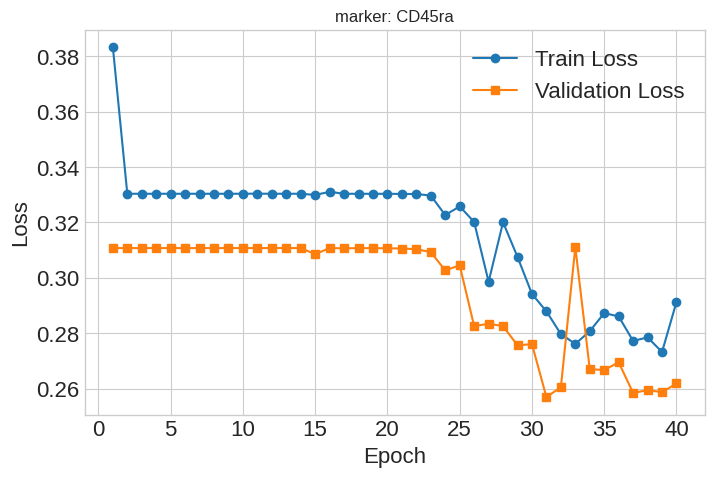

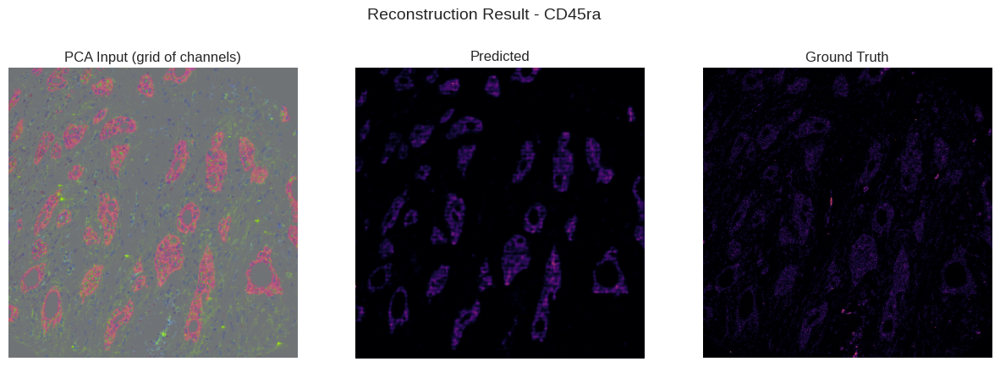

Marker: CD45
Starting training...


Epoch 1: 100%|██████████| 19/19 [00:04<00:00,  3.98it/s]


---Epoch 1: Train Loss=0.3675, Val Loss=0.2924


Epoch 2: 100%|██████████| 19/19 [00:04<00:00,  4.07it/s]


---Epoch 2: Train Loss=0.3050, Val Loss=0.2772


Epoch 3: 100%|██████████| 19/19 [00:04<00:00,  4.15it/s]


---Epoch 3: Train Loss=0.3060, Val Loss=0.2790


Epoch 4: 100%|██████████| 19/19 [00:04<00:00,  3.95it/s]


---Epoch 4: Train Loss=0.2873, Val Loss=0.2567


Epoch 5: 100%|██████████| 19/19 [00:05<00:00,  3.76it/s]


---Epoch 5: Train Loss=0.2802, Val Loss=0.2538


Epoch 6: 100%|██████████| 19/19 [00:04<00:00,  3.93it/s]


---Epoch 6: Train Loss=0.2799, Val Loss=0.2539


Epoch 7: 100%|██████████| 19/19 [00:05<00:00,  3.74it/s]


---Epoch 7: Train Loss=0.2685, Val Loss=0.2499


Epoch 8: 100%|██████████| 19/19 [00:04<00:00,  3.90it/s]


---Epoch 8: Train Loss=0.2666, Val Loss=0.2446


Epoch 9: 100%|██████████| 19/19 [00:04<00:00,  3.99it/s]


---Epoch 9: Train Loss=0.2810, Val Loss=0.2580


Epoch 10: 100%|██████████| 19/19 [00:04<00:00,  3.99it/s]


---Epoch 10: Train Loss=0.2810, Val Loss=0.2479


Epoch 11: 100%|██████████| 19/19 [00:05<00:00,  3.77it/s]


---Epoch 11: Train Loss=0.2823, Val Loss=0.2588


Epoch 12: 100%|██████████| 19/19 [00:04<00:00,  3.90it/s]


---Epoch 12: Train Loss=0.2779, Val Loss=0.2524


Epoch 13: 100%|██████████| 19/19 [00:05<00:00,  3.70it/s]


---Epoch 13: Train Loss=0.2724, Val Loss=0.2595


Epoch 14: 100%|██████████| 19/19 [00:04<00:00,  3.94it/s]


---Epoch 14: Train Loss=0.2747, Val Loss=0.2452


Epoch 15: 100%|██████████| 19/19 [00:05<00:00,  3.78it/s]


---Epoch 15: Train Loss=0.2660, Val Loss=0.2470


Epoch 16: 100%|██████████| 19/19 [00:04<00:00,  4.02it/s]


---Epoch 16: Train Loss=0.2678, Val Loss=0.2439


Epoch 17: 100%|██████████| 19/19 [00:04<00:00,  3.90it/s]


---Epoch 17: Train Loss=0.2718, Val Loss=0.2453


Epoch 18: 100%|██████████| 19/19 [00:04<00:00,  3.82it/s]


---Epoch 18: Train Loss=0.2717, Val Loss=0.2556


Epoch 19: 100%|██████████| 19/19 [00:05<00:00,  3.74it/s]


---Epoch 19: Train Loss=0.2770, Val Loss=0.2475


Epoch 20: 100%|██████████| 19/19 [00:05<00:00,  3.73it/s]


---Epoch 20: Train Loss=0.2695, Val Loss=0.2389


Epoch 21: 100%|██████████| 19/19 [00:05<00:00,  3.64it/s]


---Epoch 21: Train Loss=0.2633, Val Loss=0.2346


Epoch 22: 100%|██████████| 19/19 [00:05<00:00,  3.76it/s]


---Epoch 22: Train Loss=0.2593, Val Loss=0.2353


Epoch 23: 100%|██████████| 19/19 [00:04<00:00,  3.89it/s]


---Epoch 23: Train Loss=0.2610, Val Loss=0.2386


Epoch 24: 100%|██████████| 19/19 [00:04<00:00,  3.82it/s]


---Epoch 24: Train Loss=0.2608, Val Loss=0.2391


Epoch 25: 100%|██████████| 19/19 [00:04<00:00,  3.97it/s]


---Epoch 25: Train Loss=0.2599, Val Loss=0.2412


Epoch 26: 100%|██████████| 19/19 [00:04<00:00,  3.90it/s]


---Epoch 26: Train Loss=0.2585, Val Loss=0.2426


Epoch 27: 100%|██████████| 19/19 [00:05<00:00,  3.69it/s]


---Epoch 27: Train Loss=0.2628, Val Loss=0.2408


Epoch 28: 100%|██████████| 19/19 [00:04<00:00,  3.89it/s]


---Epoch 28: Train Loss=0.2578, Val Loss=0.2405


Epoch 29: 100%|██████████| 19/19 [00:04<00:00,  3.83it/s]


---Epoch 29: Train Loss=0.2578, Val Loss=0.2580


Epoch 30: 100%|██████████| 19/19 [00:05<00:00,  3.79it/s]


---Epoch 30: Train Loss=0.2704, Val Loss=0.2388


Epoch 31: 100%|██████████| 19/19 [00:04<00:00,  3.91it/s]


---Epoch 31: Train Loss=0.2592, Val Loss=0.2640


Epoch 32: 100%|██████████| 19/19 [00:05<00:00,  3.63it/s]


---Epoch 32: Train Loss=0.2586, Val Loss=0.2361


Epoch 33: 100%|██████████| 19/19 [00:05<00:00,  3.76it/s]


---Epoch 33: Train Loss=0.2620, Val Loss=0.2459


Epoch 34: 100%|██████████| 19/19 [00:05<00:00,  3.70it/s]


---Epoch 34: Train Loss=0.2632, Val Loss=0.2380


Epoch 35: 100%|██████████| 19/19 [00:04<00:00,  3.87it/s]


---Epoch 35: Train Loss=0.2610, Val Loss=0.2359


Epoch 36: 100%|██████████| 19/19 [00:05<00:00,  3.68it/s]


---Epoch 36: Train Loss=0.2606, Val Loss=0.2383


Epoch 37: 100%|██████████| 19/19 [00:04<00:00,  3.83it/s]


---Epoch 37: Train Loss=0.2672, Val Loss=0.2392


Epoch 38: 100%|██████████| 19/19 [00:05<00:00,  3.61it/s]


---Epoch 38: Train Loss=0.2606, Val Loss=0.2401


Epoch 39: 100%|██████████| 19/19 [00:05<00:00,  3.78it/s]


---Epoch 39: Train Loss=0.2593, Val Loss=0.2340


Epoch 40: 100%|██████████| 19/19 [00:05<00:00,  3.68it/s]


---Epoch 40: Train Loss=0.2592, Val Loss=0.2403


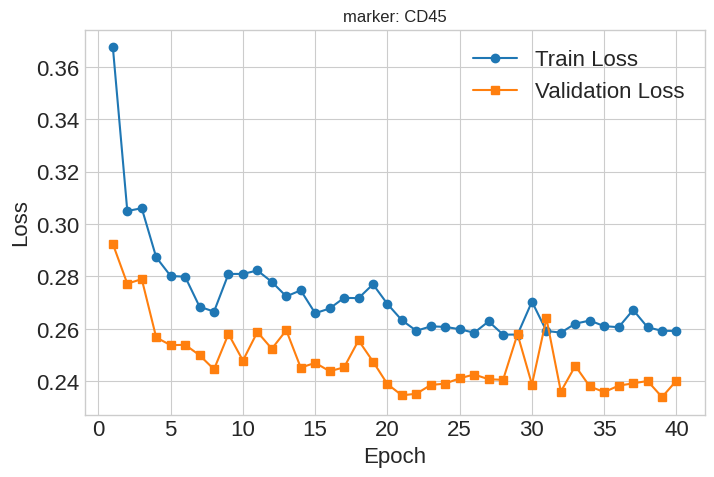

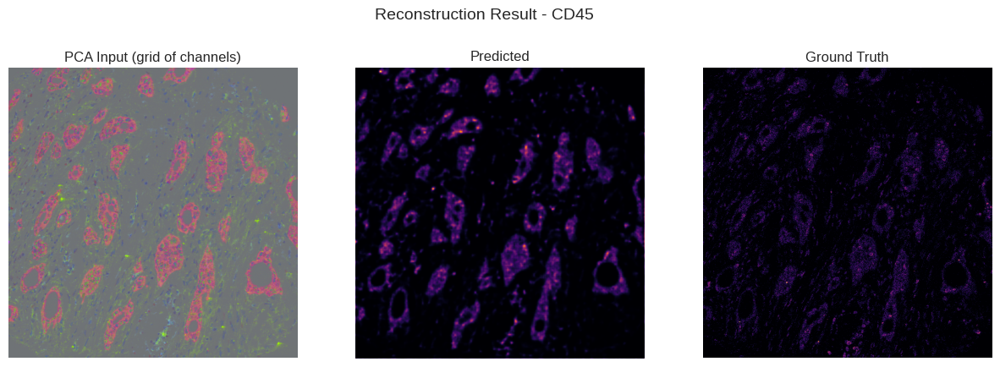

In [ ]:
control = [0,37,38] #histone_h3, dna1, dna2

marker_tasks = [
    ("pan_cytokeratin", 35, control),
    ("ERα", 25, control),
    ("CD4", 31, control),
    ("CD45ra", 20, control),
    ("CD45", 22, control)
]

all_results = []
for title, target_idx, control_markers_indices in marker_tasks:
    print(f"Marker: {title}")
    res = main(target_idx, control_markers_indices, title=title)
    all_results.append(res)

In [ ]:
df = pd.DataFrame(all_results)
df.head()

,marker,RMSE_mean,RMSE_std,PSNR_mean,PSNR_std,Pearson_mean,Pearson_std
0,pan_cytokeratin,0.125960,0.041202,18.595354,3.521101,0.699560,0.225047
1,ERα,0.101822,0.035360,20.386624,3.118561,0.688730,0.123019
2,CD4,0.074789,0.015840,22.725413,1.898109,0.369293,0.087328
3,CD45ra,0.059462,0.015285,24.819436,2.344723,0.408479,0.104539
4,CD45,0.056633,0.016876,25.299047,2.476470,0.458784,0.090912


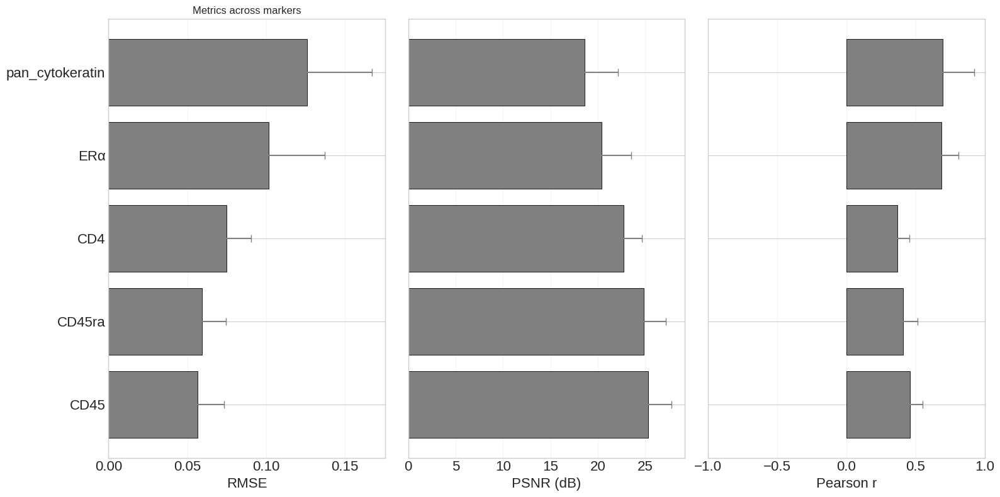

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16, 8), sharey=True)

# reverse order
markers = df["marker"][::-1]
rmse_mean, rmse_std = df["RMSE_mean"][::-1], df["RMSE_std"][::-1]
psnr_mean, psnr_std = df["PSNR_mean"][::-1], df["PSNR_std"][::-1]
pearson_mean, pearson_std = df["Pearson_mean"][::-1], df["Pearson_std"][::-1]

# --- RMSE ---
axes[0].barh(
    markers, rmse_mean,
    xerr=rmse_std, capsize=4,
    color="gray", edgecolor="black", linewidth=0.6, ecolor="gray"
)
axes[0].set_xlabel("RMSE")
axes[0].grid(axis="x", alpha=0.2)
axes[0].set_title("Metrics across markers")

# --- PSNR ---
axes[1].barh(
    markers, psnr_mean,
    xerr=psnr_std, capsize=4,
    color="gray", edgecolor="black", linewidth=0.6, ecolor="gray"
)
axes[1].set_xlabel("PSNR (dB)")
axes[1].grid(axis="x", alpha=0.2)

# --- Pearson correlation ---
axes[2].barh(
    markers, pearson_mean,
    xerr=pearson_std, capsize=4,
    color="gray", edgecolor="black", linewidth=0.6, ecolor="gray"
)
axes[2].set_xlabel("Pearson r")
axes[2].set_xlim(-1, 1)
axes[2].grid(axis="x", alpha=0.2)

plt.tight_layout()
plt.savefig("marker_metrics_all_horizontal.png", dpi=400, bbox_inches="tight")
plt.show()


### pilot - 40 epochs on 50 images

Marker: ki67
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 143MB/s]


Starting training...


Epoch 1: 100%|██████████| 19/19 [00:06<00:00,  2.83it/s]


---Epoch 1: Train Loss=0.2783, Val Loss=0.2354


Epoch 2: 100%|██████████| 19/19 [00:04<00:00,  4.26it/s]


---Epoch 2: Train Loss=0.2288, Val Loss=0.2354


Epoch 3: 100%|██████████| 19/19 [00:04<00:00,  4.59it/s]


---Epoch 3: Train Loss=0.2288, Val Loss=0.2354


Epoch 4: 100%|██████████| 19/19 [00:04<00:00,  4.18it/s]


---Epoch 4: Train Loss=0.2288, Val Loss=0.2354


Epoch 5: 100%|██████████| 19/19 [00:04<00:00,  4.21it/s]


---Epoch 5: Train Loss=0.2288, Val Loss=0.2354


Epoch 6: 100%|██████████| 19/19 [00:04<00:00,  4.14it/s]


---Epoch 6: Train Loss=0.2288, Val Loss=0.2354


Epoch 7: 100%|██████████| 19/19 [00:05<00:00,  3.64it/s]


---Epoch 7: Train Loss=0.2288, Val Loss=0.2354


Epoch 8: 100%|██████████| 19/19 [00:04<00:00,  4.28it/s]


---Epoch 8: Train Loss=0.2288, Val Loss=0.2354


Epoch 9: 100%|██████████| 19/19 [00:04<00:00,  4.43it/s]


---Epoch 9: Train Loss=0.2288, Val Loss=0.2354


Epoch 10: 100%|██████████| 19/19 [00:04<00:00,  4.13it/s]


---Epoch 10: Train Loss=0.2288, Val Loss=0.2354


Epoch 11: 100%|██████████| 19/19 [00:04<00:00,  3.98it/s]


---Epoch 11: Train Loss=0.2288, Val Loss=0.2361


Epoch 12: 100%|██████████| 19/19 [00:04<00:00,  3.93it/s]


---Epoch 12: Train Loss=0.2289, Val Loss=0.2354


Epoch 13: 100%|██████████| 19/19 [00:04<00:00,  4.18it/s]


---Epoch 13: Train Loss=0.2288, Val Loss=0.2354


Epoch 14: 100%|██████████| 19/19 [00:04<00:00,  4.26it/s]


---Epoch 14: Train Loss=0.2288, Val Loss=0.2354


Epoch 15: 100%|██████████| 19/19 [00:04<00:00,  4.02it/s]


---Epoch 15: Train Loss=0.2288, Val Loss=0.2354


Epoch 16: 100%|██████████| 19/19 [00:04<00:00,  3.98it/s]


---Epoch 16: Train Loss=0.2289, Val Loss=0.2354


Epoch 17: 100%|██████████| 19/19 [00:05<00:00,  3.51it/s]


---Epoch 17: Train Loss=0.2289, Val Loss=0.2354


Epoch 18: 100%|██████████| 19/19 [00:04<00:00,  4.11it/s]


---Epoch 18: Train Loss=0.2288, Val Loss=0.2354


Epoch 19: 100%|██████████| 19/19 [00:04<00:00,  4.10it/s]


---Epoch 19: Train Loss=0.2288, Val Loss=0.2354


Epoch 20: 100%|██████████| 19/19 [00:04<00:00,  4.28it/s]


---Epoch 20: Train Loss=0.2288, Val Loss=0.2369


Epoch 21: 100%|██████████| 19/19 [00:04<00:00,  3.84it/s]


---Epoch 21: Train Loss=0.2304, Val Loss=0.2354


Epoch 22: 100%|██████████| 19/19 [00:04<00:00,  4.12it/s]


---Epoch 22: Train Loss=0.2288, Val Loss=0.2354


Epoch 23: 100%|██████████| 19/19 [00:04<00:00,  4.02it/s]


---Epoch 23: Train Loss=0.2288, Val Loss=0.2354


Epoch 24: 100%|██████████| 19/19 [00:05<00:00,  3.50it/s]


---Epoch 24: Train Loss=0.2288, Val Loss=0.2354


Epoch 25: 100%|██████████| 19/19 [00:05<00:00,  3.63it/s]


---Epoch 25: Train Loss=0.2288, Val Loss=0.2354


Epoch 26: 100%|██████████| 19/19 [00:04<00:00,  3.81it/s]


---Epoch 26: Train Loss=0.2288, Val Loss=0.2354


Epoch 27: 100%|██████████| 19/19 [00:04<00:00,  4.09it/s]


---Epoch 27: Train Loss=0.2288, Val Loss=0.2354


Epoch 28: 100%|██████████| 19/19 [00:04<00:00,  3.95it/s]


---Epoch 28: Train Loss=0.2288, Val Loss=0.2354


Epoch 29: 100%|██████████| 19/19 [00:04<00:00,  3.98it/s]


---Epoch 29: Train Loss=0.2288, Val Loss=0.2354


Epoch 30: 100%|██████████| 19/19 [00:04<00:00,  3.91it/s]


---Epoch 30: Train Loss=0.2288, Val Loss=0.2354


Epoch 31: 100%|██████████| 19/19 [00:04<00:00,  4.27it/s]


---Epoch 31: Train Loss=0.2289, Val Loss=0.2356


Epoch 32: 100%|██████████| 19/19 [00:04<00:00,  3.88it/s]


---Epoch 32: Train Loss=0.2288, Val Loss=0.2354


Epoch 33: 100%|██████████| 19/19 [00:04<00:00,  4.27it/s]


---Epoch 33: Train Loss=0.2288, Val Loss=0.2354


Epoch 34: 100%|██████████| 19/19 [00:04<00:00,  3.96it/s]


---Epoch 34: Train Loss=0.2288, Val Loss=0.2354


Epoch 35: 100%|██████████| 19/19 [00:04<00:00,  4.09it/s]


---Epoch 35: Train Loss=0.2290, Val Loss=0.2354


Epoch 36: 100%|██████████| 19/19 [00:04<00:00,  3.88it/s]


---Epoch 36: Train Loss=0.2288, Val Loss=0.2354


Epoch 37: 100%|██████████| 19/19 [00:04<00:00,  3.96it/s]


---Epoch 37: Train Loss=0.2288, Val Loss=0.2354


Epoch 38: 100%|██████████| 19/19 [00:04<00:00,  3.90it/s]


---Epoch 38: Train Loss=0.2288, Val Loss=0.2354


Epoch 39: 100%|██████████| 19/19 [00:04<00:00,  3.97it/s]


---Epoch 39: Train Loss=0.2288, Val Loss=0.2354


Epoch 40: 100%|██████████| 19/19 [00:04<00:00,  3.92it/s]


---Epoch 40: Train Loss=0.2288, Val Loss=0.2354


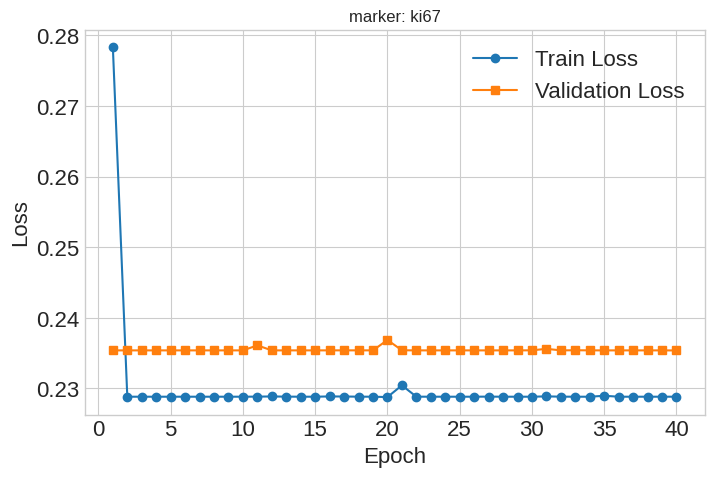

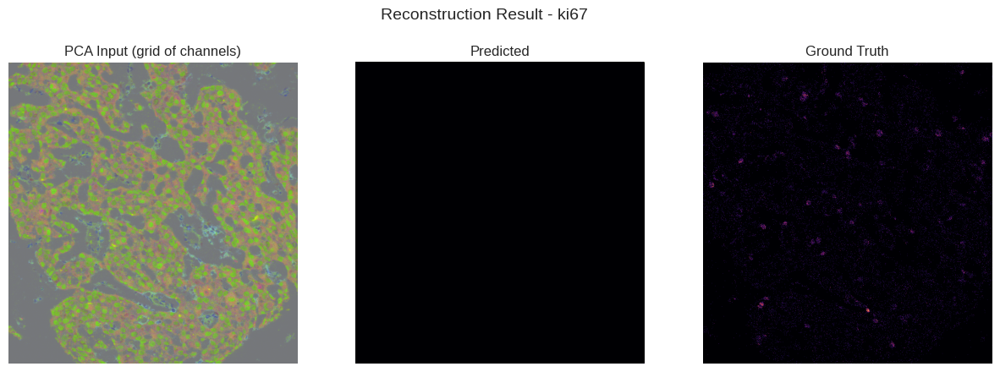

Marker: CD3
Starting training...


Epoch 1: 100%|██████████| 19/19 [00:04<00:00,  4.05it/s]


---Epoch 1: Train Loss=0.3689, Val Loss=0.3492


Epoch 2: 100%|██████████| 19/19 [00:04<00:00,  4.10it/s]


---Epoch 2: Train Loss=0.3313, Val Loss=0.3462


Epoch 3: 100%|██████████| 19/19 [00:04<00:00,  4.27it/s]


---Epoch 3: Train Loss=0.3303, Val Loss=0.3456


Epoch 4: 100%|██████████| 19/19 [00:04<00:00,  3.90it/s]


---Epoch 4: Train Loss=0.3286, Val Loss=0.3305


Epoch 5: 100%|██████████| 19/19 [00:04<00:00,  3.82it/s]


---Epoch 5: Train Loss=0.3204, Val Loss=0.3424


Epoch 6: 100%|██████████| 19/19 [00:05<00:00,  3.67it/s]


---Epoch 6: Train Loss=0.3268, Val Loss=0.3493


Epoch 7: 100%|██████████| 19/19 [00:04<00:00,  4.24it/s]


---Epoch 7: Train Loss=0.3314, Val Loss=0.3492


Epoch 8: 100%|██████████| 19/19 [00:04<00:00,  3.89it/s]


---Epoch 8: Train Loss=0.3313, Val Loss=0.3491


Epoch 9: 100%|██████████| 19/19 [00:04<00:00,  4.20it/s]


---Epoch 9: Train Loss=0.3304, Val Loss=0.3441


Epoch 10: 100%|██████████| 19/19 [00:04<00:00,  3.91it/s]


---Epoch 10: Train Loss=0.3169, Val Loss=0.3179


Epoch 11: 100%|██████████| 19/19 [00:05<00:00,  3.75it/s]


---Epoch 11: Train Loss=0.3138, Val Loss=0.3264


Epoch 12: 100%|██████████| 19/19 [00:05<00:00,  3.78it/s]


---Epoch 12: Train Loss=0.3086, Val Loss=0.3165


Epoch 13: 100%|██████████| 19/19 [00:04<00:00,  4.00it/s]


---Epoch 13: Train Loss=0.3151, Val Loss=0.3166


Epoch 14: 100%|██████████| 19/19 [00:04<00:00,  4.22it/s]


---Epoch 14: Train Loss=0.3199, Val Loss=0.3248


Epoch 15: 100%|██████████| 19/19 [00:04<00:00,  3.95it/s]


---Epoch 15: Train Loss=0.3095, Val Loss=0.3218


Epoch 16: 100%|██████████| 19/19 [00:04<00:00,  3.86it/s]


---Epoch 16: Train Loss=0.3064, Val Loss=0.3189


Epoch 17: 100%|██████████| 19/19 [00:04<00:00,  4.07it/s]


---Epoch 17: Train Loss=0.3079, Val Loss=0.3181


Epoch 18: 100%|██████████| 19/19 [00:04<00:00,  4.01it/s]


---Epoch 18: Train Loss=0.3089, Val Loss=0.3141


Epoch 19: 100%|██████████| 19/19 [00:04<00:00,  4.09it/s]


---Epoch 19: Train Loss=0.3050, Val Loss=0.3166


Epoch 20: 100%|██████████| 19/19 [00:04<00:00,  4.26it/s]


---Epoch 20: Train Loss=0.3043, Val Loss=0.3163


Epoch 21: 100%|██████████| 19/19 [00:04<00:00,  4.23it/s]


---Epoch 21: Train Loss=0.3043, Val Loss=0.3199


Epoch 22: 100%|██████████| 19/19 [00:04<00:00,  4.07it/s]


---Epoch 22: Train Loss=0.3066, Val Loss=0.3147


Epoch 23: 100%|██████████| 19/19 [00:04<00:00,  3.92it/s]


---Epoch 23: Train Loss=0.3055, Val Loss=0.3159


Epoch 24: 100%|██████████| 19/19 [00:05<00:00,  3.62it/s]


---Epoch 24: Train Loss=0.3078, Val Loss=0.3214


Epoch 25: 100%|██████████| 19/19 [00:04<00:00,  3.87it/s]


---Epoch 25: Train Loss=0.3091, Val Loss=0.3160


Epoch 26: 100%|██████████| 19/19 [00:04<00:00,  3.82it/s]


---Epoch 26: Train Loss=0.3062, Val Loss=0.3187


Epoch 27: 100%|██████████| 19/19 [00:04<00:00,  4.16it/s]


---Epoch 27: Train Loss=0.3044, Val Loss=0.3210


Epoch 28: 100%|██████████| 19/19 [00:04<00:00,  3.88it/s]


---Epoch 28: Train Loss=0.3056, Val Loss=0.3196


Epoch 29: 100%|██████████| 19/19 [00:04<00:00,  4.00it/s]


---Epoch 29: Train Loss=0.3067, Val Loss=0.3154


Epoch 30: 100%|██████████| 19/19 [00:04<00:00,  3.91it/s]


---Epoch 30: Train Loss=0.3063, Val Loss=0.3303


Epoch 31: 100%|██████████| 19/19 [00:04<00:00,  4.28it/s]


---Epoch 31: Train Loss=0.3070, Val Loss=0.3184


Epoch 32: 100%|██████████| 19/19 [00:04<00:00,  3.95it/s]


---Epoch 32: Train Loss=0.3043, Val Loss=0.3157


Epoch 33: 100%|██████████| 19/19 [00:04<00:00,  4.25it/s]


---Epoch 33: Train Loss=0.3058, Val Loss=0.3183


Epoch 34: 100%|██████████| 19/19 [00:04<00:00,  4.01it/s]


---Epoch 34: Train Loss=0.3066, Val Loss=0.3141


Epoch 35: 100%|██████████| 19/19 [00:04<00:00,  4.05it/s]


---Epoch 35: Train Loss=0.3039, Val Loss=0.3168


Epoch 36: 100%|██████████| 19/19 [00:04<00:00,  3.82it/s]


---Epoch 36: Train Loss=0.3037, Val Loss=0.3196


Epoch 37: 100%|██████████| 19/19 [00:04<00:00,  3.98it/s]


---Epoch 37: Train Loss=0.3056, Val Loss=0.3192


Epoch 38: 100%|██████████| 19/19 [00:04<00:00,  3.86it/s]


---Epoch 38: Train Loss=0.3081, Val Loss=0.3150


Epoch 39: 100%|██████████| 19/19 [00:04<00:00,  4.02it/s]


---Epoch 39: Train Loss=0.3068, Val Loss=0.3157


Epoch 40: 100%|██████████| 19/19 [00:04<00:00,  3.90it/s]


---Epoch 40: Train Loss=0.3071, Val Loss=0.3135


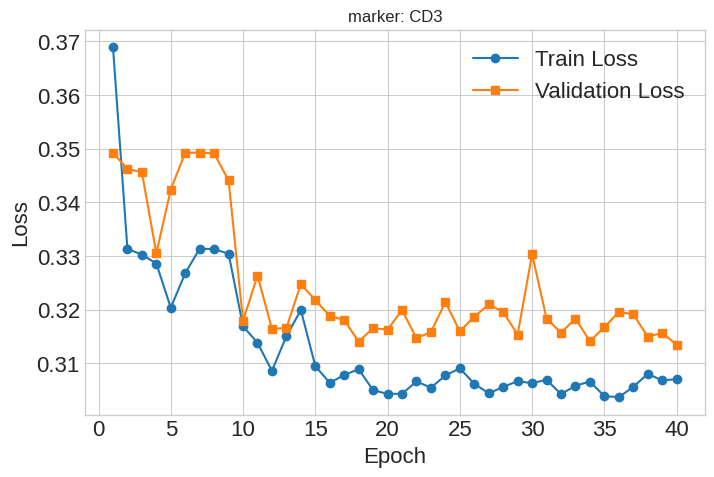

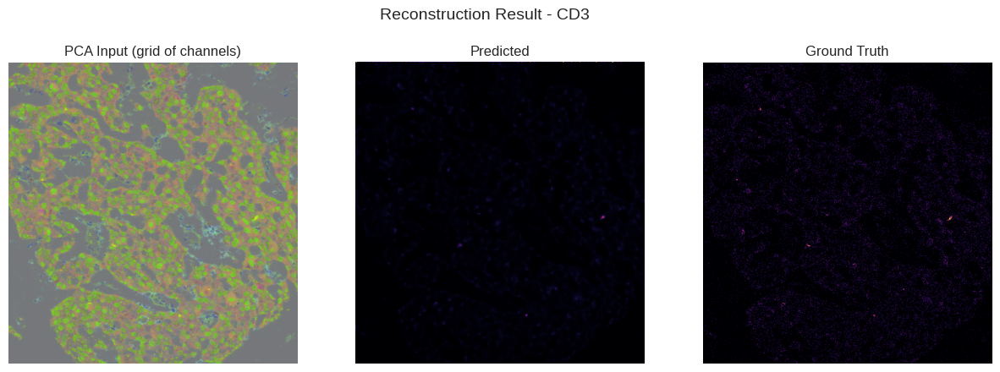

Marker: CD20
Starting training...


Epoch 1: 100%|██████████| 19/19 [00:04<00:00,  4.07it/s]


---Epoch 1: Train Loss=0.2807, Val Loss=0.2379


Epoch 2: 100%|██████████| 19/19 [00:04<00:00,  4.08it/s]


---Epoch 2: Train Loss=0.2261, Val Loss=0.2379


Epoch 3: 100%|██████████| 19/19 [00:04<00:00,  4.25it/s]


---Epoch 3: Train Loss=0.2260, Val Loss=0.2355


Epoch 4: 100%|██████████| 19/19 [00:04<00:00,  3.95it/s]


---Epoch 4: Train Loss=0.2255, Val Loss=0.2209


Epoch 5: 100%|██████████| 19/19 [00:04<00:00,  3.81it/s]


---Epoch 5: Train Loss=0.2238, Val Loss=0.2330


Epoch 6: 100%|██████████| 19/19 [00:05<00:00,  3.71it/s]


---Epoch 6: Train Loss=0.2298, Val Loss=0.2376


Epoch 7: 100%|██████████| 19/19 [00:04<00:00,  4.25it/s]


---Epoch 7: Train Loss=0.2256, Val Loss=0.2349


Epoch 8: 100%|██████████| 19/19 [00:04<00:00,  3.91it/s]


---Epoch 8: Train Loss=0.2258, Val Loss=0.2372


Epoch 9: 100%|██████████| 19/19 [00:04<00:00,  4.21it/s]


---Epoch 9: Train Loss=0.2257, Val Loss=0.2349


Epoch 10: 100%|██████████| 19/19 [00:04<00:00,  3.86it/s]


---Epoch 10: Train Loss=0.2202, Val Loss=0.2120


Epoch 11: 100%|██████████| 19/19 [00:04<00:00,  3.81it/s]


---Epoch 11: Train Loss=0.2017, Val Loss=0.2535


Epoch 12: 100%|██████████| 19/19 [00:05<00:00,  3.76it/s]


---Epoch 12: Train Loss=0.2080, Val Loss=0.2010


Epoch 13: 100%|██████████| 19/19 [00:04<00:00,  4.05it/s]


---Epoch 13: Train Loss=0.2085, Val Loss=0.2071


Epoch 14: 100%|██████████| 19/19 [00:04<00:00,  4.20it/s]


---Epoch 14: Train Loss=0.2044, Val Loss=0.2172


Epoch 15: 100%|██████████| 19/19 [00:05<00:00,  3.71it/s]


---Epoch 15: Train Loss=0.2158, Val Loss=0.2365


Epoch 16: 100%|██████████| 19/19 [00:04<00:00,  3.87it/s]


---Epoch 16: Train Loss=0.2258, Val Loss=0.2370


Epoch 17: 100%|██████████| 19/19 [00:04<00:00,  4.03it/s]


---Epoch 17: Train Loss=0.2197, Val Loss=0.2181


Epoch 18: 100%|██████████| 19/19 [00:04<00:00,  4.04it/s]


---Epoch 18: Train Loss=0.2061, Val Loss=0.2017


Epoch 19: 100%|██████████| 19/19 [00:04<00:00,  4.08it/s]


---Epoch 19: Train Loss=0.2006, Val Loss=0.1951


Epoch 20: 100%|██████████| 19/19 [00:04<00:00,  4.23it/s]


---Epoch 20: Train Loss=0.1934, Val Loss=0.1876


Epoch 21: 100%|██████████| 19/19 [00:04<00:00,  4.29it/s]


---Epoch 21: Train Loss=0.1971, Val Loss=0.1883


Epoch 22: 100%|██████████| 19/19 [00:04<00:00,  4.07it/s]


---Epoch 22: Train Loss=0.1981, Val Loss=0.2232


Epoch 23: 100%|██████████| 19/19 [00:04<00:00,  3.94it/s]


---Epoch 23: Train Loss=0.1983, Val Loss=0.1992


Epoch 24: 100%|██████████| 19/19 [00:05<00:00,  3.62it/s]


---Epoch 24: Train Loss=0.2089, Val Loss=0.2046


Epoch 25: 100%|██████████| 19/19 [00:04<00:00,  3.84it/s]


---Epoch 25: Train Loss=0.1943, Val Loss=0.1859


Epoch 26: 100%|██████████| 19/19 [00:04<00:00,  3.83it/s]


---Epoch 26: Train Loss=0.1838, Val Loss=0.1821


Epoch 27: 100%|██████████| 19/19 [00:04<00:00,  4.12it/s]


---Epoch 27: Train Loss=0.1856, Val Loss=0.1917


Epoch 28: 100%|██████████| 19/19 [00:04<00:00,  3.92it/s]


---Epoch 28: Train Loss=0.1838, Val Loss=0.1810


Epoch 29: 100%|██████████| 19/19 [00:04<00:00,  4.00it/s]


---Epoch 29: Train Loss=0.1825, Val Loss=0.1781


Epoch 30: 100%|██████████| 19/19 [00:04<00:00,  3.88it/s]


---Epoch 30: Train Loss=0.1867, Val Loss=0.1815


Epoch 31: 100%|██████████| 19/19 [00:04<00:00,  4.29it/s]


---Epoch 31: Train Loss=0.1878, Val Loss=0.1792


Epoch 32: 100%|██████████| 19/19 [00:04<00:00,  3.93it/s]


---Epoch 32: Train Loss=0.1796, Val Loss=0.1804


Epoch 33: 100%|██████████| 19/19 [00:04<00:00,  4.31it/s]


---Epoch 33: Train Loss=0.1797, Val Loss=0.1804


Epoch 34: 100%|██████████| 19/19 [00:04<00:00,  4.02it/s]


---Epoch 34: Train Loss=0.1797, Val Loss=0.1763


Epoch 35: 100%|██████████| 19/19 [00:04<00:00,  4.03it/s]


---Epoch 35: Train Loss=0.1773, Val Loss=0.1797


Epoch 36: 100%|██████████| 19/19 [00:04<00:00,  3.84it/s]


---Epoch 36: Train Loss=0.1768, Val Loss=0.1760


Epoch 37: 100%|██████████| 19/19 [00:04<00:00,  3.95it/s]


---Epoch 37: Train Loss=0.1792, Val Loss=0.1761


Epoch 38: 100%|██████████| 19/19 [00:04<00:00,  3.90it/s]


---Epoch 38: Train Loss=0.1823, Val Loss=0.1895


Epoch 39: 100%|██████████| 19/19 [00:04<00:00,  4.02it/s]


---Epoch 39: Train Loss=0.1808, Val Loss=0.1771


Epoch 40: 100%|██████████| 19/19 [00:04<00:00,  3.93it/s]


---Epoch 40: Train Loss=0.1819, Val Loss=0.1768


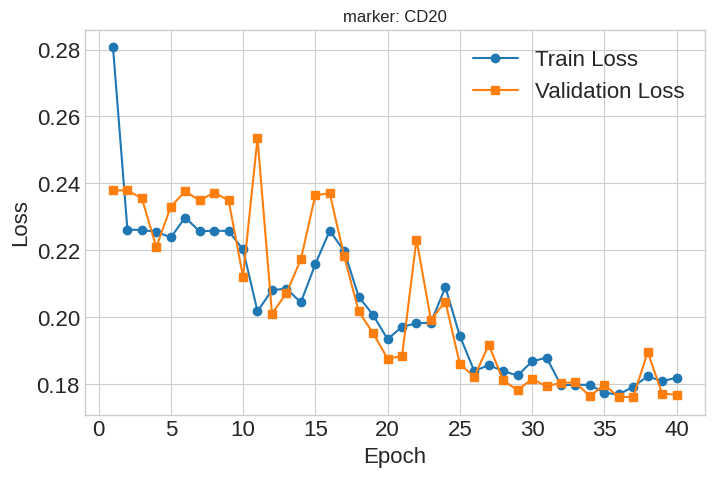

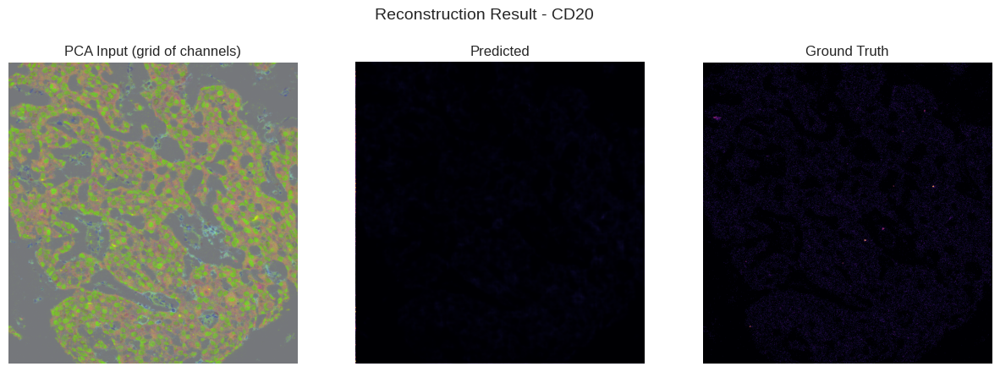

Marker: CD45
Starting training...


Epoch 1: 100%|██████████| 19/19 [00:04<00:00,  4.04it/s]


---Epoch 1: Train Loss=0.3527, Val Loss=0.3414


Epoch 2: 100%|██████████| 19/19 [00:04<00:00,  3.98it/s]


---Epoch 2: Train Loss=0.2932, Val Loss=0.3512


Epoch 3: 100%|██████████| 19/19 [00:04<00:00,  4.20it/s]


---Epoch 3: Train Loss=0.2918, Val Loss=0.2948


Epoch 4: 100%|██████████| 19/19 [00:04<00:00,  3.88it/s]


---Epoch 4: Train Loss=0.2760, Val Loss=0.2957


Epoch 5: 100%|██████████| 19/19 [00:05<00:00,  3.76it/s]


---Epoch 5: Train Loss=0.2726, Val Loss=0.2824


Epoch 6: 100%|██████████| 19/19 [00:05<00:00,  3.70it/s]


---Epoch 6: Train Loss=0.2650, Val Loss=0.2770


Epoch 7: 100%|██████████| 19/19 [00:04<00:00,  4.18it/s]


---Epoch 7: Train Loss=0.2621, Val Loss=0.2958


Epoch 8: 100%|██████████| 19/19 [00:04<00:00,  3.88it/s]


---Epoch 8: Train Loss=0.2672, Val Loss=0.2916


Epoch 9: 100%|██████████| 19/19 [00:04<00:00,  4.17it/s]


---Epoch 9: Train Loss=0.2595, Val Loss=0.2784


Epoch 10: 100%|██████████| 19/19 [00:04<00:00,  3.89it/s]


---Epoch 10: Train Loss=0.2706, Val Loss=0.2941


Epoch 11: 100%|██████████| 19/19 [00:05<00:00,  3.79it/s]


---Epoch 11: Train Loss=0.2588, Val Loss=0.2787


Epoch 12: 100%|██████████| 19/19 [00:05<00:00,  3.75it/s]


---Epoch 12: Train Loss=0.2555, Val Loss=0.2741


Epoch 13: 100%|██████████| 19/19 [00:04<00:00,  4.05it/s]


---Epoch 13: Train Loss=0.2489, Val Loss=0.2762


Epoch 14: 100%|██████████| 19/19 [00:04<00:00,  4.19it/s]


---Epoch 14: Train Loss=0.2472, Val Loss=0.2762


Epoch 15: 100%|██████████| 19/19 [00:04<00:00,  3.90it/s]


---Epoch 15: Train Loss=0.2483, Val Loss=0.2769


Epoch 16: 100%|██████████| 19/19 [00:04<00:00,  3.89it/s]


---Epoch 16: Train Loss=0.2462, Val Loss=0.2793


Epoch 17: 100%|██████████| 19/19 [00:04<00:00,  4.01it/s]


---Epoch 17: Train Loss=0.2454, Val Loss=0.2767


Epoch 18: 100%|██████████| 19/19 [00:04<00:00,  4.06it/s]


---Epoch 18: Train Loss=0.2455, Val Loss=0.2843


Epoch 19: 100%|██████████| 19/19 [00:04<00:00,  4.09it/s]


---Epoch 19: Train Loss=0.2544, Val Loss=0.2767


Epoch 20: 100%|██████████| 19/19 [00:04<00:00,  4.25it/s]


---Epoch 20: Train Loss=0.2565, Val Loss=0.2753


Epoch 21: 100%|██████████| 19/19 [00:04<00:00,  4.28it/s]


---Epoch 21: Train Loss=0.2586, Val Loss=0.2965


Epoch 22: 100%|██████████| 19/19 [00:04<00:00,  4.02it/s]


---Epoch 22: Train Loss=0.2572, Val Loss=0.2830


Epoch 23: 100%|██████████| 19/19 [00:04<00:00,  3.94it/s]


---Epoch 23: Train Loss=0.2539, Val Loss=0.2829


Epoch 24: 100%|██████████| 19/19 [00:05<00:00,  3.61it/s]


---Epoch 24: Train Loss=0.2498, Val Loss=0.2779


Epoch 25: 100%|██████████| 19/19 [00:04<00:00,  3.84it/s]


---Epoch 25: Train Loss=0.2481, Val Loss=0.2721


Epoch 26: 100%|██████████| 19/19 [00:04<00:00,  3.82it/s]


---Epoch 26: Train Loss=0.2435, Val Loss=0.2732


Epoch 27: 100%|██████████| 19/19 [00:04<00:00,  4.08it/s]


---Epoch 27: Train Loss=0.2443, Val Loss=0.2733


Epoch 28: 100%|██████████| 19/19 [00:04<00:00,  3.92it/s]


---Epoch 28: Train Loss=0.2500, Val Loss=0.2712


Epoch 29: 100%|██████████| 19/19 [00:04<00:00,  3.97it/s]


---Epoch 29: Train Loss=0.2467, Val Loss=0.2890


Epoch 30: 100%|██████████| 19/19 [00:04<00:00,  3.89it/s]


---Epoch 30: Train Loss=0.2564, Val Loss=0.2756


Epoch 31: 100%|██████████| 19/19 [00:04<00:00,  4.27it/s]


---Epoch 31: Train Loss=0.2531, Val Loss=0.2854


Epoch 32: 100%|██████████| 19/19 [00:04<00:00,  3.88it/s]


---Epoch 32: Train Loss=0.2437, Val Loss=0.2699


Epoch 33: 100%|██████████| 19/19 [00:04<00:00,  4.26it/s]


---Epoch 33: Train Loss=0.2432, Val Loss=0.2710


Epoch 34: 100%|██████████| 19/19 [00:04<00:00,  4.00it/s]


---Epoch 34: Train Loss=0.2424, Val Loss=0.2728


Epoch 35: 100%|██████████| 19/19 [00:04<00:00,  4.00it/s]


---Epoch 35: Train Loss=0.2448, Val Loss=0.2847


Epoch 36: 100%|██████████| 19/19 [00:04<00:00,  3.84it/s]


---Epoch 36: Train Loss=0.2455, Val Loss=0.2777


Epoch 37: 100%|██████████| 19/19 [00:04<00:00,  3.93it/s]


---Epoch 37: Train Loss=0.2473, Val Loss=0.2738


Epoch 38: 100%|██████████| 19/19 [00:04<00:00,  3.91it/s]


---Epoch 38: Train Loss=0.2524, Val Loss=0.2675


Epoch 39: 100%|██████████| 19/19 [00:04<00:00,  4.00it/s]


---Epoch 39: Train Loss=0.2468, Val Loss=0.2711


Epoch 40: 100%|██████████| 19/19 [00:04<00:00,  3.90it/s]


---Epoch 40: Train Loss=0.2501, Val Loss=0.2735


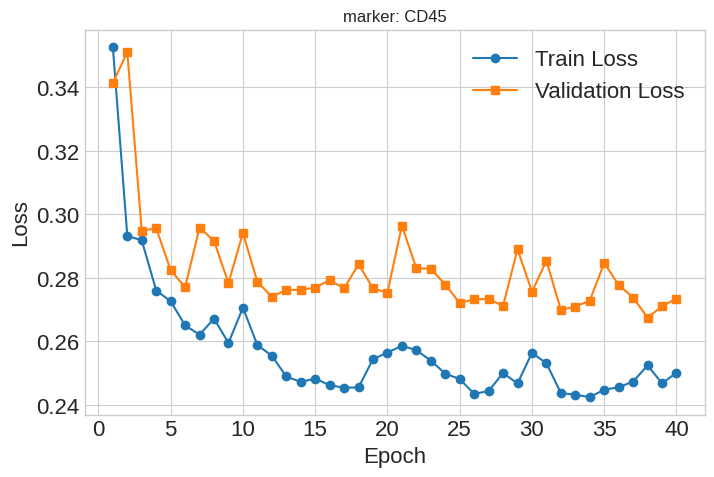

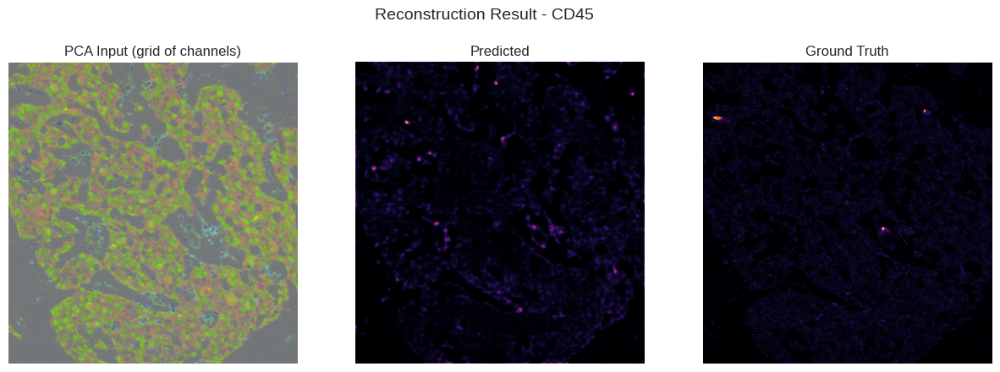

Marker: CD68
Starting training...


Epoch 1: 100%|██████████| 19/19 [00:04<00:00,  4.08it/s]


---Epoch 1: Train Loss=0.2944, Val Loss=0.2438


Epoch 2: 100%|██████████| 19/19 [00:04<00:00,  4.07it/s]


---Epoch 2: Train Loss=0.2435, Val Loss=0.2438


Epoch 3: 100%|██████████| 19/19 [00:04<00:00,  4.30it/s]


---Epoch 3: Train Loss=0.2435, Val Loss=0.2438


Epoch 4: 100%|██████████| 19/19 [00:04<00:00,  4.02it/s]


---Epoch 4: Train Loss=0.2435, Val Loss=0.2438


Epoch 5: 100%|██████████| 19/19 [00:04<00:00,  3.90it/s]


---Epoch 5: Train Loss=0.2435, Val Loss=0.2438


Epoch 6: 100%|██████████| 19/19 [00:05<00:00,  3.78it/s]


---Epoch 6: Train Loss=0.2435, Val Loss=0.2438


Epoch 7: 100%|██████████| 19/19 [00:04<00:00,  4.33it/s]


---Epoch 7: Train Loss=0.2435, Val Loss=0.2438


Epoch 8: 100%|██████████| 19/19 [00:04<00:00,  3.99it/s]


---Epoch 8: Train Loss=0.2437, Val Loss=0.2438


Epoch 9: 100%|██████████| 19/19 [00:04<00:00,  4.30it/s]


---Epoch 9: Train Loss=0.2435, Val Loss=0.2438


Epoch 10: 100%|██████████| 19/19 [00:04<00:00,  3.94it/s]


---Epoch 10: Train Loss=0.2435, Val Loss=0.2438


Epoch 11: 100%|██████████| 19/19 [00:04<00:00,  3.87it/s]


---Epoch 11: Train Loss=0.2435, Val Loss=0.2438


Epoch 12: 100%|██████████| 19/19 [00:04<00:00,  3.80it/s]


---Epoch 12: Train Loss=0.2435, Val Loss=0.2438


Epoch 13: 100%|██████████| 19/19 [00:05<00:00,  3.64it/s]


---Epoch 13: Train Loss=0.2435, Val Loss=0.2438


Epoch 14: 100%|██████████| 19/19 [00:04<00:00,  3.98it/s]


---Epoch 14: Train Loss=0.2435, Val Loss=0.2438


Epoch 15: 100%|██████████| 19/19 [00:04<00:00,  3.92it/s]


---Epoch 15: Train Loss=0.2436, Val Loss=0.2665


Epoch 16: 100%|██████████| 19/19 [00:04<00:00,  3.91it/s]


---Epoch 16: Train Loss=0.2437, Val Loss=0.2438


Epoch 17: 100%|██████████| 19/19 [00:04<00:00,  4.05it/s]


---Epoch 17: Train Loss=0.2435, Val Loss=0.2438


Epoch 18: 100%|██████████| 19/19 [00:04<00:00,  4.03it/s]


---Epoch 18: Train Loss=0.2435, Val Loss=0.2438


Epoch 19: 100%|██████████| 19/19 [00:04<00:00,  4.09it/s]


---Epoch 19: Train Loss=0.2435, Val Loss=0.2436


Epoch 20: 100%|██████████| 19/19 [00:04<00:00,  4.22it/s]


---Epoch 20: Train Loss=0.2434, Val Loss=0.2430


Epoch 21: 100%|██████████| 19/19 [00:04<00:00,  4.31it/s]


---Epoch 21: Train Loss=0.2437, Val Loss=0.2517


Epoch 22: 100%|██████████| 19/19 [00:04<00:00,  4.08it/s]


---Epoch 22: Train Loss=0.2438, Val Loss=0.2438


Epoch 23: 100%|██████████| 19/19 [00:04<00:00,  3.95it/s]


---Epoch 23: Train Loss=0.2435, Val Loss=0.2438


Epoch 24: 100%|██████████| 19/19 [00:05<00:00,  3.63it/s]


---Epoch 24: Train Loss=0.2435, Val Loss=0.2435


Epoch 25: 100%|██████████| 19/19 [00:05<00:00,  3.75it/s]


---Epoch 25: Train Loss=0.2435, Val Loss=0.2437


Epoch 26: 100%|██████████| 19/19 [00:05<00:00,  3.73it/s]


---Epoch 26: Train Loss=0.2427, Val Loss=0.2362


Epoch 27: 100%|██████████| 19/19 [00:04<00:00,  4.15it/s]


---Epoch 27: Train Loss=0.2417, Val Loss=0.2438


Epoch 28: 100%|██████████| 19/19 [00:04<00:00,  3.88it/s]


---Epoch 28: Train Loss=0.2436, Val Loss=0.2438


Epoch 29: 100%|██████████| 19/19 [00:04<00:00,  3.98it/s]


---Epoch 29: Train Loss=0.2436, Val Loss=0.2438


Epoch 30: 100%|██████████| 19/19 [00:04<00:00,  3.86it/s]


---Epoch 30: Train Loss=0.2435, Val Loss=0.2438


Epoch 31: 100%|██████████| 19/19 [00:04<00:00,  4.26it/s]


---Epoch 31: Train Loss=0.2435, Val Loss=0.2438


Epoch 32: 100%|██████████| 19/19 [00:04<00:00,  3.95it/s]


---Epoch 32: Train Loss=0.2437, Val Loss=0.2394


Epoch 33: 100%|██████████| 19/19 [00:04<00:00,  4.22it/s]


---Epoch 33: Train Loss=0.2416, Val Loss=0.2411


Epoch 34: 100%|██████████| 19/19 [00:04<00:00,  3.87it/s]


---Epoch 34: Train Loss=0.2431, Val Loss=0.2435


Epoch 35: 100%|██████████| 19/19 [00:04<00:00,  4.01it/s]


---Epoch 35: Train Loss=0.2436, Val Loss=0.2433


Epoch 36: 100%|██████████| 19/19 [00:04<00:00,  3.83it/s]


---Epoch 36: Train Loss=0.2403, Val Loss=0.2257


Epoch 37: 100%|██████████| 19/19 [00:04<00:00,  3.97it/s]


---Epoch 37: Train Loss=0.2493, Val Loss=0.2438


Epoch 38: 100%|██████████| 19/19 [00:04<00:00,  3.89it/s]


---Epoch 38: Train Loss=0.2435, Val Loss=0.2438


Epoch 39: 100%|██████████| 19/19 [00:04<00:00,  4.05it/s]


---Epoch 39: Train Loss=0.2435, Val Loss=0.2438


Epoch 40: 100%|██████████| 19/19 [00:04<00:00,  3.95it/s]


---Epoch 40: Train Loss=0.2435, Val Loss=0.2438


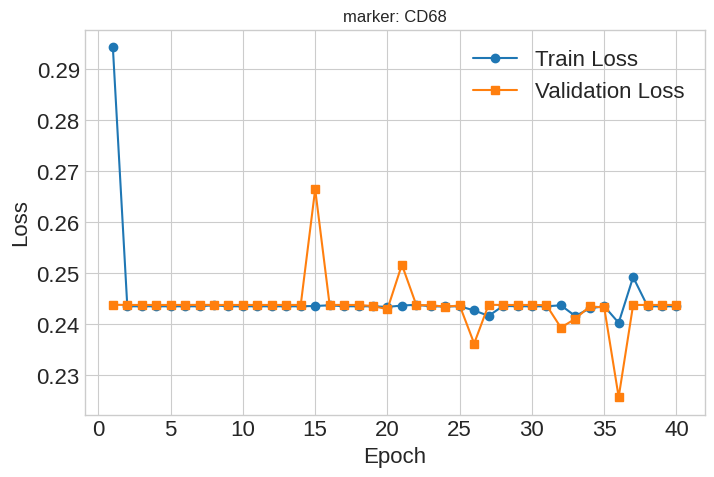

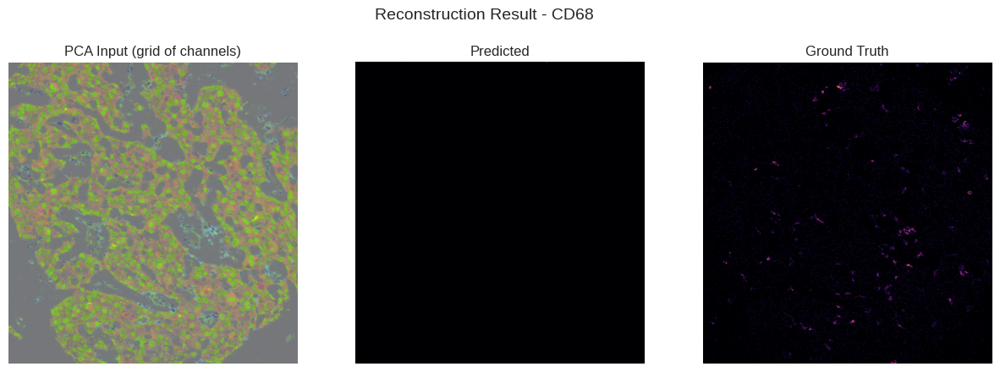

Marker: sma
Starting training...


Epoch 1: 100%|██████████| 19/19 [00:04<00:00,  4.06it/s]


---Epoch 1: Train Loss=0.3554, Val Loss=0.3624


Epoch 2: 100%|██████████| 19/19 [00:04<00:00,  4.20it/s]


---Epoch 2: Train Loss=0.3111, Val Loss=0.3624


Epoch 3: 100%|██████████| 19/19 [00:04<00:00,  4.37it/s]


---Epoch 3: Train Loss=0.3111, Val Loss=0.3624


Epoch 4: 100%|██████████| 19/19 [00:04<00:00,  4.11it/s]


---Epoch 4: Train Loss=0.3111, Val Loss=0.3624


Epoch 5: 100%|██████████| 19/19 [00:05<00:00,  3.74it/s]


---Epoch 5: Train Loss=0.3111, Val Loss=0.3624


Epoch 6: 100%|██████████| 19/19 [00:05<00:00,  3.68it/s]


---Epoch 6: Train Loss=0.3111, Val Loss=0.3624


Epoch 7: 100%|██████████| 19/19 [00:04<00:00,  4.09it/s]


---Epoch 7: Train Loss=0.3111, Val Loss=0.3624


Epoch 8: 100%|██████████| 19/19 [00:05<00:00,  3.51it/s]


---Epoch 8: Train Loss=0.3111, Val Loss=0.3624


Epoch 9: 100%|██████████| 19/19 [00:04<00:00,  4.07it/s]


---Epoch 9: Train Loss=0.3111, Val Loss=0.3624


Epoch 10: 100%|██████████| 19/19 [00:05<00:00,  3.71it/s]


---Epoch 10: Train Loss=0.3111, Val Loss=0.3624


Epoch 11: 100%|██████████| 19/19 [00:05<00:00,  3.65it/s]


---Epoch 11: Train Loss=0.3111, Val Loss=0.3623


Epoch 12: 100%|██████████| 19/19 [00:05<00:00,  3.52it/s]


---Epoch 12: Train Loss=0.3112, Val Loss=0.3624


Epoch 13: 100%|██████████| 19/19 [00:04<00:00,  3.98it/s]


---Epoch 13: Train Loss=0.3111, Val Loss=0.3624


Epoch 14: 100%|██████████| 19/19 [00:04<00:00,  4.21it/s]


---Epoch 14: Train Loss=0.3111, Val Loss=0.3624


Epoch 15: 100%|██████████| 19/19 [00:05<00:00,  3.49it/s]


---Epoch 15: Train Loss=0.3113, Val Loss=0.3624


Epoch 16: 100%|██████████| 19/19 [00:04<00:00,  3.88it/s]


---Epoch 16: Train Loss=0.3111, Val Loss=0.3624


Epoch 17: 100%|██████████| 19/19 [00:04<00:00,  4.07it/s]


---Epoch 17: Train Loss=0.3111, Val Loss=0.3624


Epoch 18: 100%|██████████| 19/19 [00:04<00:00,  4.04it/s]


---Epoch 18: Train Loss=0.3111, Val Loss=0.3624


Epoch 19: 100%|██████████| 19/19 [00:04<00:00,  4.09it/s]


---Epoch 19: Train Loss=0.3111, Val Loss=0.3624


Epoch 20: 100%|██████████| 19/19 [00:04<00:00,  4.25it/s]


---Epoch 20: Train Loss=0.3111, Val Loss=0.3624


Epoch 21: 100%|██████████| 19/19 [00:04<00:00,  4.22it/s]


---Epoch 21: Train Loss=0.3111, Val Loss=0.3624


Epoch 22: 100%|██████████| 19/19 [00:04<00:00,  4.05it/s]


---Epoch 22: Train Loss=0.3110, Val Loss=0.3715


Epoch 23: 100%|██████████| 19/19 [00:05<00:00,  3.65it/s]


---Epoch 23: Train Loss=0.3118, Val Loss=0.3624


Epoch 24: 100%|██████████| 19/19 [00:05<00:00,  3.49it/s]


---Epoch 24: Train Loss=0.3111, Val Loss=0.3624


Epoch 25: 100%|██████████| 19/19 [00:04<00:00,  4.00it/s]


---Epoch 25: Train Loss=0.3111, Val Loss=0.3624


Epoch 26: 100%|██████████| 19/19 [00:04<00:00,  3.92it/s]


---Epoch 26: Train Loss=0.3111, Val Loss=0.3624


Epoch 27: 100%|██████████| 19/19 [00:04<00:00,  4.27it/s]


---Epoch 27: Train Loss=0.3111, Val Loss=0.3624


Epoch 28: 100%|██████████| 19/19 [00:04<00:00,  3.92it/s]


---Epoch 28: Train Loss=0.3111, Val Loss=0.3624


Epoch 29: 100%|██████████| 19/19 [00:04<00:00,  4.06it/s]


---Epoch 29: Train Loss=0.3111, Val Loss=0.3624


Epoch 30: 100%|██████████| 19/19 [00:04<00:00,  3.96it/s]


---Epoch 30: Train Loss=0.3111, Val Loss=0.3624


Epoch 31: 100%|██████████| 19/19 [00:04<00:00,  4.16it/s]


---Epoch 31: Train Loss=0.3111, Val Loss=0.3624


Epoch 32: 100%|██████████| 19/19 [00:05<00:00,  3.65it/s]


---Epoch 32: Train Loss=0.3111, Val Loss=0.3624


Epoch 33: 100%|██████████| 19/19 [00:04<00:00,  4.13it/s]


---Epoch 33: Train Loss=0.3111, Val Loss=0.3624


Epoch 34: 100%|██████████| 19/19 [00:04<00:00,  3.98it/s]


---Epoch 34: Train Loss=0.3111, Val Loss=0.3624


Epoch 35: 100%|██████████| 19/19 [00:04<00:00,  4.08it/s]


---Epoch 35: Train Loss=0.3111, Val Loss=0.3624


Epoch 36: 100%|██████████| 19/19 [00:05<00:00,  3.77it/s]


---Epoch 36: Train Loss=0.3111, Val Loss=0.3624


Epoch 37: 100%|██████████| 19/19 [00:04<00:00,  3.97it/s]


---Epoch 37: Train Loss=0.3111, Val Loss=0.3624


Epoch 38: 100%|██████████| 19/19 [00:04<00:00,  3.87it/s]


---Epoch 38: Train Loss=0.3111, Val Loss=0.3624


Epoch 39: 100%|██████████| 19/19 [00:04<00:00,  3.99it/s]


---Epoch 39: Train Loss=0.3111, Val Loss=0.3624


Epoch 40: 100%|██████████| 19/19 [00:04<00:00,  3.93it/s]


---Epoch 40: Train Loss=0.3111, Val Loss=0.3624


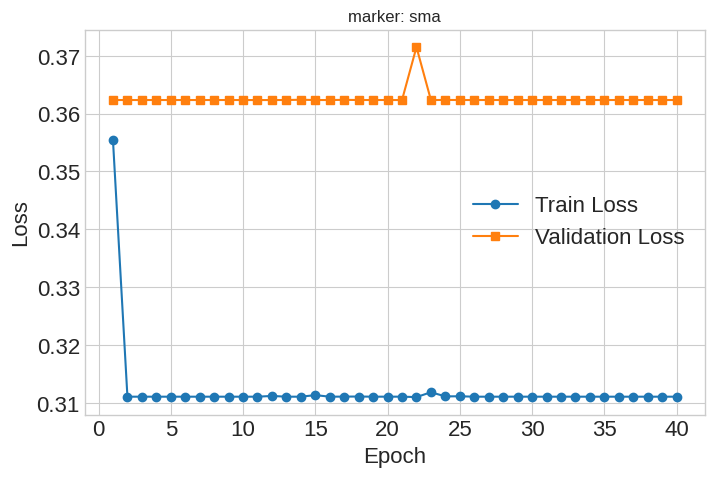

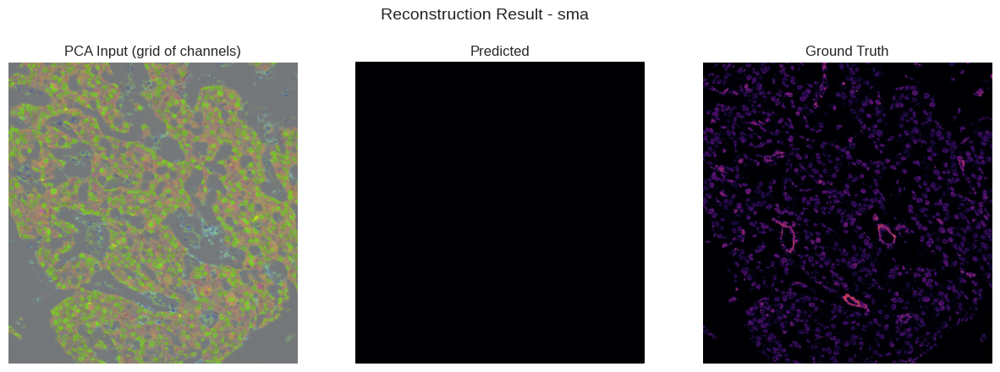

Marker: pan_cytokeratin
Starting training...


Epoch 1: 100%|██████████| 19/19 [00:04<00:00,  3.96it/s]


---Epoch 1: Train Loss=0.3464, Val Loss=0.3258


Epoch 2: 100%|██████████| 19/19 [00:04<00:00,  4.01it/s]


---Epoch 2: Train Loss=0.2785, Val Loss=0.2826


Epoch 3: 100%|██████████| 19/19 [00:04<00:00,  4.22it/s]


---Epoch 3: Train Loss=0.2737, Val Loss=0.2765


Epoch 4: 100%|██████████| 19/19 [00:05<00:00,  3.62it/s]


---Epoch 4: Train Loss=0.2770, Val Loss=0.2781


Epoch 5: 100%|██████████| 19/19 [00:04<00:00,  3.81it/s]


---Epoch 5: Train Loss=0.2496, Val Loss=0.2576


Epoch 6: 100%|██████████| 19/19 [00:05<00:00,  3.65it/s]


---Epoch 6: Train Loss=0.2529, Val Loss=0.2586


Epoch 7: 100%|██████████| 19/19 [00:04<00:00,  4.23it/s]


---Epoch 7: Train Loss=0.2391, Val Loss=0.2735


Epoch 8: 100%|██████████| 19/19 [00:04<00:00,  3.90it/s]


---Epoch 8: Train Loss=0.2530, Val Loss=0.2557


Epoch 9: 100%|██████████| 19/19 [00:04<00:00,  4.12it/s]


---Epoch 9: Train Loss=0.2480, Val Loss=0.2723


Epoch 10: 100%|██████████| 19/19 [00:04<00:00,  3.92it/s]


---Epoch 10: Train Loss=0.2475, Val Loss=0.2584


Epoch 11: 100%|██████████| 19/19 [00:05<00:00,  3.78it/s]


---Epoch 11: Train Loss=0.2368, Val Loss=0.2617


Epoch 12: 100%|██████████| 19/19 [00:05<00:00,  3.77it/s]


---Epoch 12: Train Loss=0.2348, Val Loss=0.2503


Epoch 13: 100%|██████████| 19/19 [00:04<00:00,  4.03it/s]


---Epoch 13: Train Loss=0.2480, Val Loss=0.2558


Epoch 14: 100%|██████████| 19/19 [00:04<00:00,  4.15it/s]


---Epoch 14: Train Loss=0.2386, Val Loss=0.2622


Epoch 15: 100%|██████████| 19/19 [00:04<00:00,  3.96it/s]


---Epoch 15: Train Loss=0.2331, Val Loss=0.2573


Epoch 16: 100%|██████████| 19/19 [00:04<00:00,  3.85it/s]


---Epoch 16: Train Loss=0.2302, Val Loss=0.2418


Epoch 17: 100%|██████████| 19/19 [00:04<00:00,  4.06it/s]


---Epoch 17: Train Loss=0.2358, Val Loss=0.2456


Epoch 18: 100%|██████████| 19/19 [00:04<00:00,  4.06it/s]


---Epoch 18: Train Loss=0.2341, Val Loss=0.2593


Epoch 19: 100%|██████████| 19/19 [00:04<00:00,  4.03it/s]


---Epoch 19: Train Loss=0.2424, Val Loss=0.2762


Epoch 20: 100%|██████████| 19/19 [00:04<00:00,  4.27it/s]


---Epoch 20: Train Loss=0.2370, Val Loss=0.2479


Epoch 21: 100%|██████████| 19/19 [00:04<00:00,  4.26it/s]


---Epoch 21: Train Loss=0.2353, Val Loss=0.2478


Epoch 22: 100%|██████████| 19/19 [00:04<00:00,  4.03it/s]


---Epoch 22: Train Loss=0.2261, Val Loss=0.2487


Epoch 23: 100%|██████████| 19/19 [00:04<00:00,  3.97it/s]


---Epoch 23: Train Loss=0.2250, Val Loss=0.2496


Epoch 24: 100%|██████████| 19/19 [00:05<00:00,  3.32it/s]


---Epoch 24: Train Loss=0.2278, Val Loss=0.2524


Epoch 25: 100%|██████████| 19/19 [00:04<00:00,  3.90it/s]


---Epoch 25: Train Loss=0.2232, Val Loss=0.2372


Epoch 26: 100%|██████████| 19/19 [00:04<00:00,  3.81it/s]


---Epoch 26: Train Loss=0.2212, Val Loss=0.2464


Epoch 27: 100%|██████████| 19/19 [00:04<00:00,  4.14it/s]


---Epoch 27: Train Loss=0.2252, Val Loss=0.2393


Epoch 28: 100%|██████████| 19/19 [00:04<00:00,  3.93it/s]


---Epoch 28: Train Loss=0.2191, Val Loss=0.2407


Epoch 29: 100%|██████████| 19/19 [00:04<00:00,  3.92it/s]


---Epoch 29: Train Loss=0.2196, Val Loss=0.2560


Epoch 30: 100%|██████████| 19/19 [00:04<00:00,  3.93it/s]


---Epoch 30: Train Loss=0.2318, Val Loss=0.2502


Epoch 31: 100%|██████████| 19/19 [00:04<00:00,  4.25it/s]


---Epoch 31: Train Loss=0.2223, Val Loss=0.2463


Epoch 32: 100%|██████████| 19/19 [00:04<00:00,  3.89it/s]


---Epoch 32: Train Loss=0.2210, Val Loss=0.2370


Epoch 33: 100%|██████████| 19/19 [00:04<00:00,  4.27it/s]


---Epoch 33: Train Loss=0.2242, Val Loss=0.2542


Epoch 34: 100%|██████████| 19/19 [00:04<00:00,  3.95it/s]


---Epoch 34: Train Loss=0.2259, Val Loss=0.2500


Epoch 35: 100%|██████████| 19/19 [00:04<00:00,  4.05it/s]


---Epoch 35: Train Loss=0.2239, Val Loss=0.2356


Epoch 36: 100%|██████████| 19/19 [00:04<00:00,  3.83it/s]


---Epoch 36: Train Loss=0.2167, Val Loss=0.2387


Epoch 37: 100%|██████████| 19/19 [00:04<00:00,  3.92it/s]


---Epoch 37: Train Loss=0.2324, Val Loss=0.2527


Epoch 38: 100%|██████████| 19/19 [00:04<00:00,  3.89it/s]


---Epoch 38: Train Loss=0.2305, Val Loss=0.2499


Epoch 39: 100%|██████████| 19/19 [00:04<00:00,  3.97it/s]


---Epoch 39: Train Loss=0.2207, Val Loss=0.2332


Epoch 40: 100%|██████████| 19/19 [00:04<00:00,  3.92it/s]


---Epoch 40: Train Loss=0.2314, Val Loss=0.2495


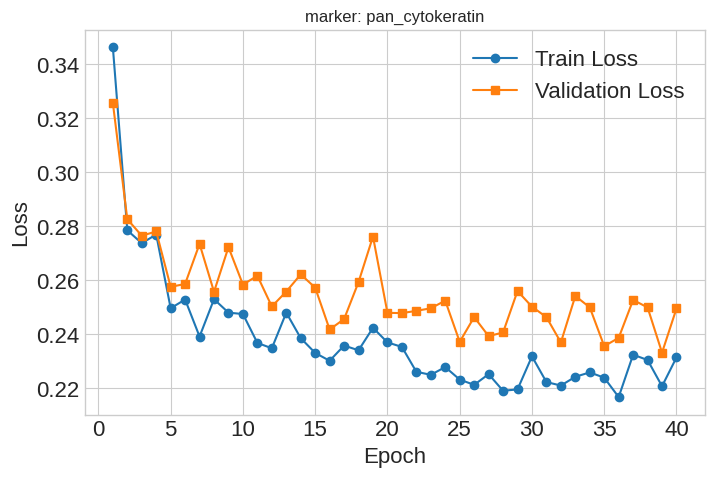

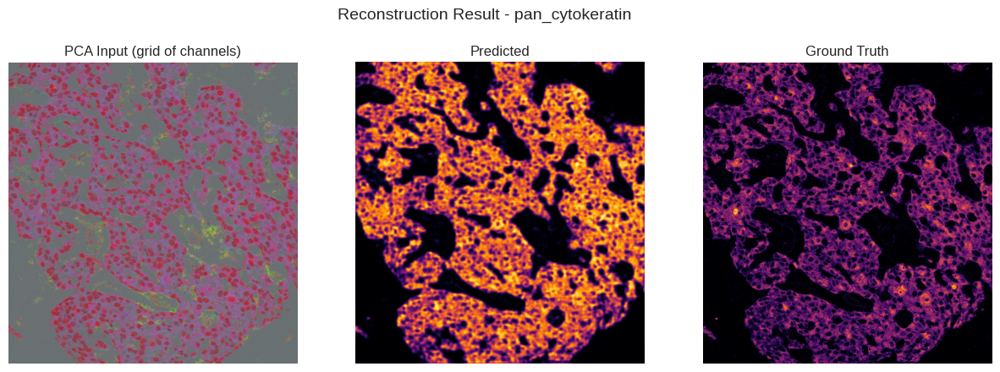

Marker: cytokeratin_5
Starting training...


Epoch 1: 100%|██████████| 19/19 [00:04<00:00,  4.10it/s]


---Epoch 1: Train Loss=0.3761, Val Loss=0.2966


Epoch 2: 100%|██████████| 19/19 [00:04<00:00,  4.01it/s]


---Epoch 2: Train Loss=0.3343, Val Loss=0.2966


Epoch 3: 100%|██████████| 19/19 [00:04<00:00,  4.31it/s]


---Epoch 3: Train Loss=0.3343, Val Loss=0.2966


Epoch 4: 100%|██████████| 19/19 [00:04<00:00,  3.99it/s]


---Epoch 4: Train Loss=0.3343, Val Loss=0.2966


Epoch 5: 100%|██████████| 19/19 [00:04<00:00,  3.93it/s]


---Epoch 5: Train Loss=0.3343, Val Loss=0.2966


Epoch 6: 100%|██████████| 19/19 [00:05<00:00,  3.77it/s]


---Epoch 6: Train Loss=0.3343, Val Loss=0.2966


Epoch 7: 100%|██████████| 19/19 [00:04<00:00,  4.20it/s]


---Epoch 7: Train Loss=0.3343, Val Loss=0.2966


Epoch 8: 100%|██████████| 19/19 [00:04<00:00,  3.95it/s]


---Epoch 8: Train Loss=0.3343, Val Loss=0.2965


Epoch 9: 100%|██████████| 19/19 [00:04<00:00,  4.23it/s]


---Epoch 9: Train Loss=0.3336, Val Loss=0.2959


Epoch 10: 100%|██████████| 19/19 [00:04<00:00,  3.84it/s]


---Epoch 10: Train Loss=0.3324, Val Loss=0.2957


Epoch 11: 100%|██████████| 19/19 [00:04<00:00,  3.81it/s]


---Epoch 11: Train Loss=0.3335, Val Loss=0.2957


Epoch 12: 100%|██████████| 19/19 [00:05<00:00,  3.73it/s]


---Epoch 12: Train Loss=0.3355, Val Loss=0.2967


Epoch 13: 100%|██████████| 19/19 [00:04<00:00,  4.05it/s]


---Epoch 13: Train Loss=0.3343, Val Loss=0.2966


Epoch 14: 100%|██████████| 19/19 [00:04<00:00,  3.91it/s]


---Epoch 14: Train Loss=0.3343, Val Loss=0.2966


Epoch 15: 100%|██████████| 19/19 [00:05<00:00,  3.43it/s]


---Epoch 15: Train Loss=0.3343, Val Loss=0.2966


Epoch 16: 100%|██████████| 19/19 [00:05<00:00,  3.46it/s]


---Epoch 16: Train Loss=0.3343, Val Loss=0.2966


Epoch 17: 100%|██████████| 19/19 [00:05<00:00,  3.78it/s]


---Epoch 17: Train Loss=0.3343, Val Loss=0.2966


Epoch 18: 100%|██████████| 19/19 [00:04<00:00,  4.03it/s]


---Epoch 18: Train Loss=0.3343, Val Loss=0.2966


Epoch 19: 100%|██████████| 19/19 [00:04<00:00,  4.08it/s]


---Epoch 19: Train Loss=0.3343, Val Loss=0.2966


Epoch 20: 100%|██████████| 19/19 [00:04<00:00,  4.18it/s]


---Epoch 20: Train Loss=0.3322, Val Loss=0.2964


Epoch 21: 100%|██████████| 19/19 [00:04<00:00,  4.28it/s]


---Epoch 21: Train Loss=0.3334, Val Loss=0.2953


Epoch 22: 100%|██████████| 19/19 [00:04<00:00,  4.05it/s]


---Epoch 22: Train Loss=0.3321, Val Loss=0.2943


Epoch 23: 100%|██████████| 19/19 [00:04<00:00,  3.85it/s]


---Epoch 23: Train Loss=0.3337, Val Loss=0.2972


Epoch 24: 100%|██████████| 19/19 [00:05<00:00,  3.61it/s]


---Epoch 24: Train Loss=0.3315, Val Loss=0.3129


Epoch 25: 100%|██████████| 19/19 [00:04<00:00,  3.86it/s]


---Epoch 25: Train Loss=0.3284, Val Loss=0.2962


Epoch 26: 100%|██████████| 19/19 [00:05<00:00,  3.55it/s]


---Epoch 26: Train Loss=0.3256, Val Loss=0.3517


Epoch 27: 100%|██████████| 19/19 [00:04<00:00,  4.13it/s]


---Epoch 27: Train Loss=0.3357, Val Loss=0.2968


Epoch 28: 100%|██████████| 19/19 [00:04<00:00,  3.89it/s]


---Epoch 28: Train Loss=0.3344, Val Loss=0.2966


Epoch 29: 100%|██████████| 19/19 [00:04<00:00,  3.99it/s]


---Epoch 29: Train Loss=0.3343, Val Loss=0.2966


Epoch 30: 100%|██████████| 19/19 [00:05<00:00,  3.67it/s]


---Epoch 30: Train Loss=0.3343, Val Loss=0.2966


Epoch 31: 100%|██████████| 19/19 [00:05<00:00,  3.78it/s]


---Epoch 31: Train Loss=0.3343, Val Loss=0.2966


Epoch 32: 100%|██████████| 19/19 [00:04<00:00,  3.84it/s]


---Epoch 32: Train Loss=0.3343, Val Loss=0.2966


Epoch 33: 100%|██████████| 19/19 [00:04<00:00,  4.21it/s]


---Epoch 33: Train Loss=0.3343, Val Loss=0.2966


Epoch 34: 100%|██████████| 19/19 [00:04<00:00,  3.99it/s]


---Epoch 34: Train Loss=0.3343, Val Loss=0.2966


Epoch 35: 100%|██████████| 19/19 [00:04<00:00,  4.01it/s]


---Epoch 35: Train Loss=0.3343, Val Loss=0.2966


Epoch 36: 100%|██████████| 19/19 [00:05<00:00,  3.78it/s]


---Epoch 36: Train Loss=0.3343, Val Loss=0.2966


Epoch 37: 100%|██████████| 19/19 [00:04<00:00,  3.95it/s]


---Epoch 37: Train Loss=0.3343, Val Loss=0.2966


Epoch 38: 100%|██████████| 19/19 [00:04<00:00,  3.85it/s]


---Epoch 38: Train Loss=0.3342, Val Loss=0.2963


Epoch 39: 100%|██████████| 19/19 [00:04<00:00,  4.00it/s]


---Epoch 39: Train Loss=0.3311, Val Loss=0.2944


Epoch 40: 100%|██████████| 19/19 [00:04<00:00,  3.92it/s]


---Epoch 40: Train Loss=0.3336, Val Loss=0.2950


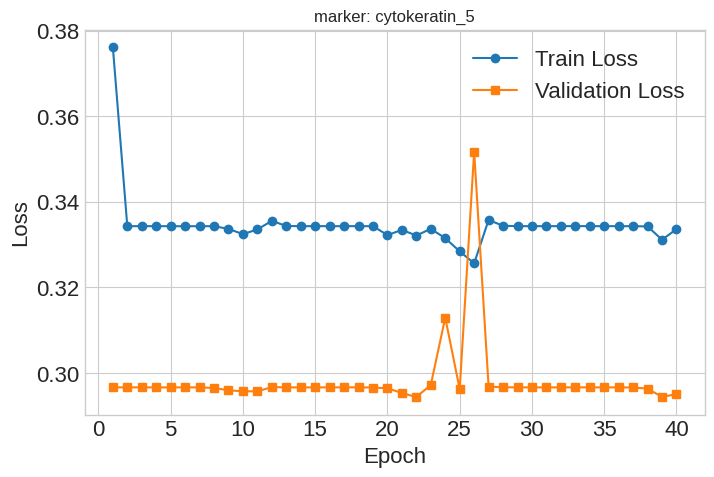

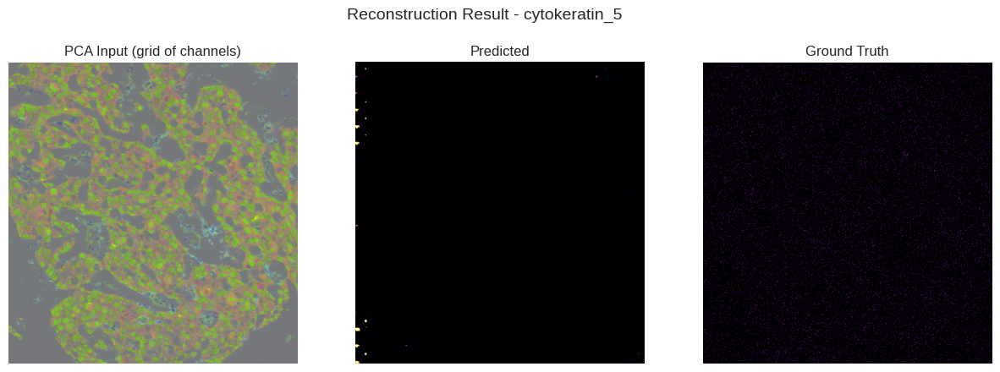

Marker: cytokeratin_8_18
Starting training...


Epoch 1: 100%|██████████| 19/19 [00:04<00:00,  3.99it/s]


---Epoch 1: Train Loss=0.3355, Val Loss=0.2873


Epoch 2: 100%|██████████| 19/19 [00:04<00:00,  4.06it/s]


---Epoch 2: Train Loss=0.2850, Val Loss=0.2873


Epoch 3: 100%|██████████| 19/19 [00:04<00:00,  4.24it/s]


---Epoch 3: Train Loss=0.2848, Val Loss=0.2870


Epoch 4: 100%|██████████| 19/19 [00:04<00:00,  3.87it/s]


---Epoch 4: Train Loss=0.2851, Val Loss=0.2871


Epoch 5: 100%|██████████| 19/19 [00:04<00:00,  3.89it/s]


---Epoch 5: Train Loss=0.2850, Val Loss=0.2873


Epoch 6: 100%|██████████| 19/19 [00:05<00:00,  3.72it/s]


---Epoch 6: Train Loss=0.2850, Val Loss=0.2873


Epoch 7: 100%|██████████| 19/19 [00:04<00:00,  4.29it/s]


---Epoch 7: Train Loss=0.2850, Val Loss=0.2873


Epoch 8: 100%|██████████| 19/19 [00:04<00:00,  3.99it/s]


---Epoch 8: Train Loss=0.2850, Val Loss=0.2873


Epoch 9: 100%|██████████| 19/19 [00:04<00:00,  4.18it/s]


---Epoch 9: Train Loss=0.2850, Val Loss=0.2873


Epoch 10: 100%|██████████| 19/19 [00:04<00:00,  3.97it/s]


---Epoch 10: Train Loss=0.2850, Val Loss=0.2873


Epoch 11: 100%|██████████| 19/19 [00:05<00:00,  3.72it/s]


---Epoch 11: Train Loss=0.2850, Val Loss=0.2873


Epoch 12: 100%|██████████| 19/19 [00:05<00:00,  3.39it/s]


---Epoch 12: Train Loss=0.2850, Val Loss=0.2873


Epoch 13: 100%|██████████| 19/19 [00:04<00:00,  4.05it/s]


---Epoch 13: Train Loss=0.2850, Val Loss=0.2873


Epoch 14: 100%|██████████| 19/19 [00:04<00:00,  4.08it/s]


---Epoch 14: Train Loss=0.2850, Val Loss=0.2873


Epoch 15: 100%|██████████| 19/19 [00:04<00:00,  3.94it/s]


---Epoch 15: Train Loss=0.2850, Val Loss=0.2872


Epoch 16: 100%|██████████| 19/19 [00:04<00:00,  3.89it/s]


---Epoch 16: Train Loss=0.2855, Val Loss=0.2873


Epoch 17: 100%|██████████| 19/19 [00:04<00:00,  4.05it/s]


---Epoch 17: Train Loss=0.2850, Val Loss=0.2873


Epoch 18: 100%|██████████| 19/19 [00:04<00:00,  4.06it/s]


---Epoch 18: Train Loss=0.2850, Val Loss=0.2873


Epoch 19: 100%|██████████| 19/19 [00:04<00:00,  4.04it/s]


---Epoch 19: Train Loss=0.2850, Val Loss=0.2873


Epoch 20: 100%|██████████| 19/19 [00:04<00:00,  4.20it/s]


---Epoch 20: Train Loss=0.2850, Val Loss=0.2873


Epoch 21: 100%|██████████| 19/19 [00:04<00:00,  4.28it/s]


---Epoch 21: Train Loss=0.2850, Val Loss=0.2873


Epoch 22: 100%|██████████| 19/19 [00:04<00:00,  4.02it/s]


---Epoch 22: Train Loss=0.2850, Val Loss=0.2873


Epoch 23: 100%|██████████| 19/19 [00:04<00:00,  3.95it/s]


---Epoch 23: Train Loss=0.2850, Val Loss=0.2873


Epoch 24: 100%|██████████| 19/19 [00:05<00:00,  3.61it/s]


---Epoch 24: Train Loss=0.2850, Val Loss=0.2873


Epoch 25: 100%|██████████| 19/19 [00:04<00:00,  3.83it/s]


---Epoch 25: Train Loss=0.2850, Val Loss=0.2873


Epoch 26: 100%|██████████| 19/19 [00:04<00:00,  3.82it/s]


---Epoch 26: Train Loss=0.2849, Val Loss=0.2872


Epoch 27: 100%|██████████| 19/19 [00:04<00:00,  4.10it/s]


---Epoch 27: Train Loss=0.2841, Val Loss=0.2876


Epoch 28: 100%|██████████| 19/19 [00:04<00:00,  3.91it/s]


---Epoch 28: Train Loss=0.2850, Val Loss=0.2873


Epoch 29: 100%|██████████| 19/19 [00:04<00:00,  3.99it/s]


---Epoch 29: Train Loss=0.2850, Val Loss=0.2873


Epoch 30: 100%|██████████| 19/19 [00:04<00:00,  3.84it/s]


---Epoch 30: Train Loss=0.2850, Val Loss=0.2873


Epoch 31: 100%|██████████| 19/19 [00:04<00:00,  4.26it/s]


---Epoch 31: Train Loss=0.2850, Val Loss=0.2873


Epoch 32: 100%|██████████| 19/19 [00:04<00:00,  3.81it/s]


---Epoch 32: Train Loss=0.2850, Val Loss=0.2873


Epoch 33: 100%|██████████| 19/19 [00:04<00:00,  4.26it/s]


---Epoch 33: Train Loss=0.2850, Val Loss=0.2872


Epoch 34: 100%|██████████| 19/19 [00:04<00:00,  3.99it/s]


---Epoch 34: Train Loss=0.2850, Val Loss=0.2872


Epoch 35: 100%|██████████| 19/19 [00:04<00:00,  3.98it/s]


---Epoch 35: Train Loss=0.2850, Val Loss=0.2872


Epoch 36: 100%|██████████| 19/19 [00:04<00:00,  3.80it/s]


---Epoch 36: Train Loss=0.2853, Val Loss=0.2873


Epoch 37: 100%|██████████| 19/19 [00:04<00:00,  3.97it/s]


---Epoch 37: Train Loss=0.2850, Val Loss=0.2873


Epoch 38: 100%|██████████| 19/19 [00:04<00:00,  3.90it/s]


---Epoch 38: Train Loss=0.2850, Val Loss=0.2873


Epoch 39: 100%|██████████| 19/19 [00:04<00:00,  4.01it/s]


---Epoch 39: Train Loss=0.2850, Val Loss=0.2873


Epoch 40: 100%|██████████| 19/19 [00:04<00:00,  3.89it/s]


---Epoch 40: Train Loss=0.2850, Val Loss=0.2873


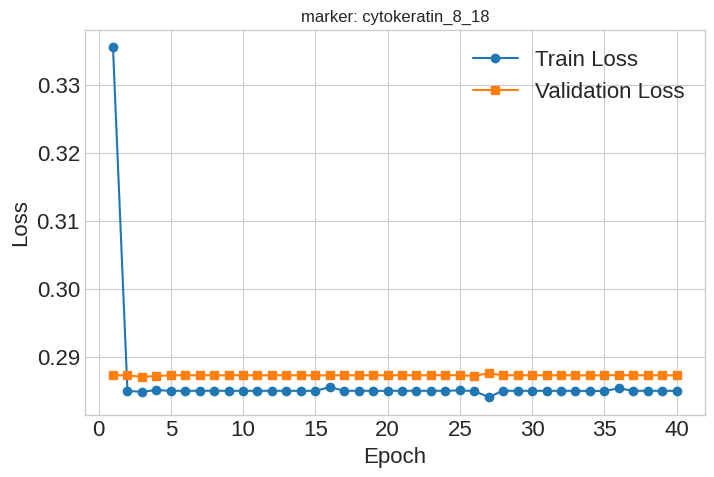

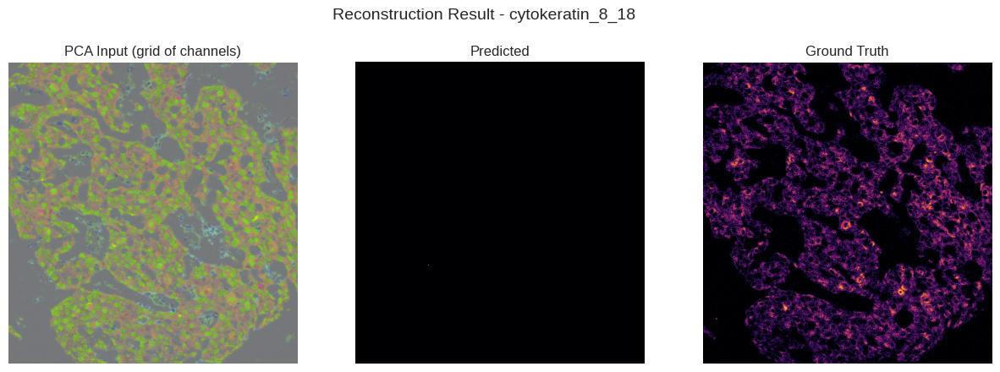

In [ ]:
control = [0,37,38] #histone_h3, dna1, dna2

marker_tasks = [
    ("ki67", 28, control),
    ("CD3", 13, control),
    ("CD20", 24, control),
    ("CD45", 22, control),
    ("CD68", 11, control),
    ("sma", 1, control),
    ("pan_cytokeratin", 35, control),
    ("cytokeratin_5", 2, control),
    ("cytokeratin_8_18", 5, control),
]

#takes about 40 min with 40 epochs per marker without cross validation and early stopping
d_results = []
for title, target_idx, control_markers_indices in marker_tasks:
    print(f"Marker: {title}")
    res = main(target_idx, control_markers_indices, title=title)
    d_results.append(res)
    del res



## Jackson 2020

In [28]:
from google.colab import drive
drive.mount('/content/drive')

# Point to your ZIP inside Drive (edit this path)
DRIVE_ZIP = "/content/drive/MyDrive/Spatial/Jackson/data.zip"
WORK_DIR = "/content/data"
ZIP_LOCAL = f"{WORK_DIR}/data.zip"
UNZIP_DIR = f"{WORK_DIR}/data"

if os.path.exists(WORK_DIR):
    shutil.rmtree(WORK_DIR)

# Copy ZIP from Drive → VM local disk (faster than reading directly from FUSE)
!mkdir -p "{WORK_DIR}"
!rsync -ah --progress "{DRIVE_ZIP}" "{ZIP_LOCAL}"

# Remove existing files and unzip locally (fast I/O)
!rm -rf "{UNZIP_DIR}"/*
!mkdir -p "{UNZIP_DIR}"
!unzip -q "{ZIP_LOCAL}" -d "{UNZIP_DIR}"

!echo "Files:" && find "{UNZIP_DIR}" -type f | wc -l
!du -sh "{UNZIP_DIR}"

Mounted at /content/drive
sending incremental file list
data.zip
        497.65M 100%   35.80MB/s    0:00:13 (xfr#1, to-chk=0/1)
Files:
50
475M	/content/data/data


In [ ]:
#index list for marker:
markers = pd.read_parquet("panel.parquet", engine="pyarrow")
markers["target"]

,target
channel_index,
0,histone_h3
1,histone_h3_trimethylate
2,cytokeratin_5
3,fibronectin
4,cytokeratin_19
5,cytokeratin_8_18
6,twist
7,cd68
8,keratin_14_krt14


Marker: CD3
Starting fold 1 for marker CD3...
Projecting images to 3 PCs captures 74.93% of variance
Epoch   1 | Train 0.5382 | Val 0.5443
  ↳ New best val=0.5443 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.5315 | Val 0.4536
  ↳ New best val=0.4536 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.5273 | Val 0.3352
  ↳ New best val=0.3352 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.5237 | Val 0.3847
  ↳ No improvement (1/6 patience)
Epoch   5 | Train 0.5294 | Val 0.4371
  ↳ No improvement (2/6 patience)
Epoch   6 | Train 0.5512 | Val 0.4938
  ↳ No improvement (3/6 patience)
Epoch   7 | Train 0.5617 | Val 0.5417
  ↳ No improvement (4/6 patience)
Epoch   8 | Train 0.5631 | Val 0.5653
  ↳ No improvement (5/6 patience)
Epoch   9 | Train -inf | Val 0.5675
  ↳ No improvement (6/6 patience)
--Early stopping at epoch 9. Best epoch was 3 with val=0.3352
--Restored model weights from epoch 3 (val=0.3352)


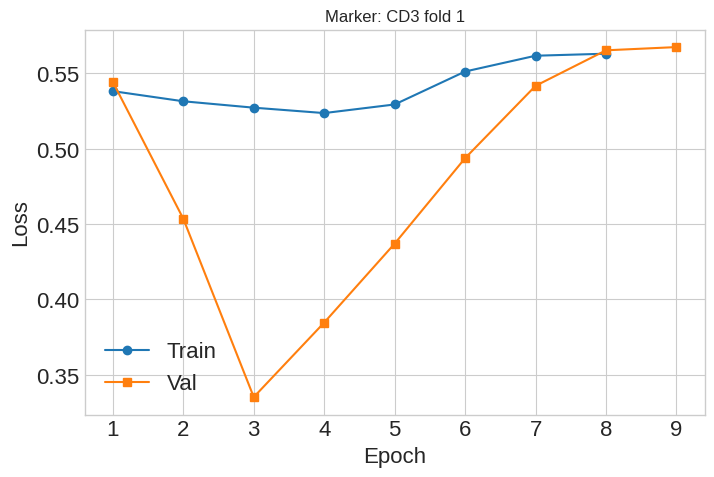

Starting fold 2 for marker CD3...
Projecting images to 3 PCs captures 75.83% of variance
Epoch   1 | Train 0.5018 | Val 0.5705
  ↳ New best val=0.5705 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.4453 | Val 0.3219
  ↳ New best val=0.3219 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4513 | Val 0.3357
  ↳ No improvement (1/6 patience)
Epoch   4 | Train 0.4310 | Val 0.3107
  ↳ New best val=0.3107 at epoch 4
  ↳ Saved checkpoint to best_model.pth
Epoch   5 | Train 0.4173 | Val 0.3825
  ↳ No improvement (1/6 patience)
Epoch   6 | Train 0.4082 | Val 0.4076
  ↳ No improvement (2/6 patience)
Epoch   7 | Train 0.3913 | Val 0.3881
  ↳ No improvement (3/6 patience)
Epoch   8 | Train 0.3765 | Val 0.2949
  ↳ New best val=0.2949 at epoch 8
  ↳ Saved checkpoint to best_model.pth
Epoch   9 | Train 0.3708 | Val 0.2974
  ↳ No improvement (1/6 patience)
Epoch  10 | Train 0.3570 | Val 0.2534
  ↳ New best val=0.2534 at epoch 10
  ↳ Saved checkpoint to best_

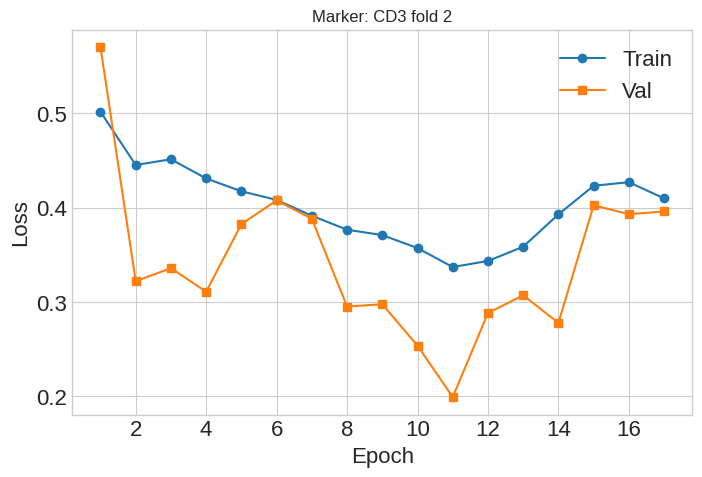

Starting fold 3 for marker CD3...
Projecting images to 3 PCs captures 74.32% of variance
Epoch   1 | Train 0.5132 | Val 0.5553
  ↳ New best val=0.5553 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.5095 | Val 0.4656
  ↳ New best val=0.4656 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4947 | Val 0.4107
  ↳ New best val=0.4107 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.4979 | Val 0.3969
  ↳ New best val=0.3969 at epoch 4
  ↳ Saved checkpoint to best_model.pth
Epoch   5 | Train 0.4687 | Val 0.3999
  ↳ No improvement (1/6 patience)
Epoch   6 | Train 0.4582 | Val 0.4014
  ↳ No improvement (2/6 patience)
Epoch   7 | Train 0.4653 | Val 0.3951
  ↳ New best val=0.3951 at epoch 7
  ↳ Saved checkpoint to best_model.pth
Epoch   8 | Train 0.4492 | Val 0.3417
  ↳ New best val=0.3417 at epoch 8
  ↳ Saved checkpoint to best_model.pth
Epoch   9 | Train 0.4528 | Val 0.5249
  ↳ No improvement (1/6 patience)
Epoch  10 | Train 0.463

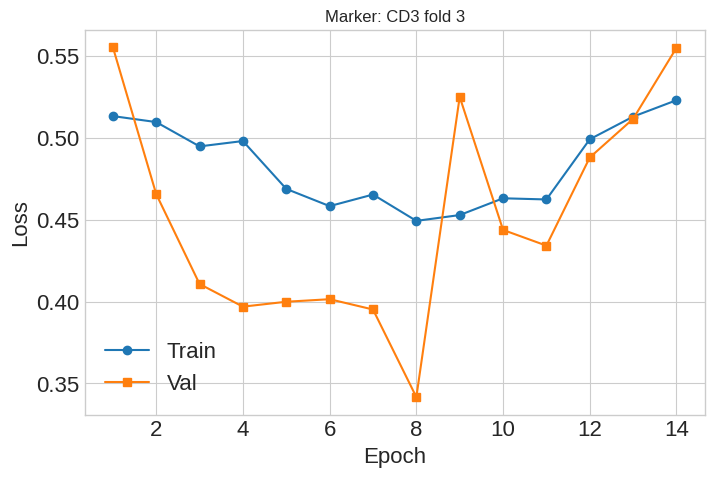

Starting fold 4 for marker CD3...
Projecting images to 3 PCs captures 75.39% of variance
Epoch   1 | Train 0.5336 | Val 0.6158
  ↳ New best val=0.6158 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.5331 | Val 0.5387
  ↳ New best val=0.5387 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.5238 | Val 0.5212
  ↳ New best val=0.5212 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.5219 | Val 0.4811
  ↳ New best val=0.4811 at epoch 4
  ↳ Saved checkpoint to best_model.pth
Epoch   5 | Train 0.5129 | Val 0.5111
  ↳ No improvement (1/6 patience)
Epoch   6 | Train 0.4956 | Val 0.5184
  ↳ No improvement (2/6 patience)
Epoch   7 | Train 0.4785 | Val 0.5010
  ↳ No improvement (3/6 patience)
Epoch   8 | Train 0.4882 | Val 0.5341
  ↳ No improvement (4/6 patience)
Epoch   9 | Train 0.4906 | Val 0.5536
  ↳ No improvement (5/6 patience)
Epoch  10 | Train 0.4903 | Val 0.5354
  ↳ No improvement (6/6 patience)
--Early stopping at epoch 10. B

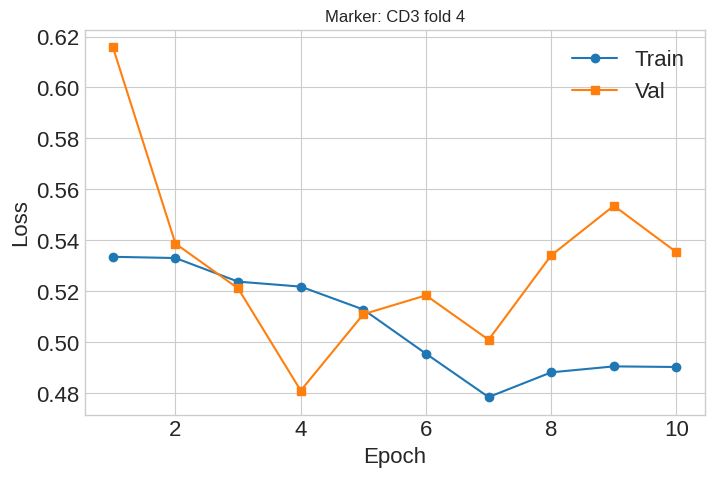

Starting fold 5 for marker CD3...
Projecting images to 3 PCs captures 74.31% of variance
Epoch   1 | Train 0.5171 | Val 0.5211
  ↳ New best val=0.5211 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.4969 | Val 0.5085
  ↳ New best val=0.5085 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4759 | Val 0.4869
  ↳ New best val=0.4869 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.4633 | Val 0.4407
  ↳ New best val=0.4407 at epoch 4
  ↳ Saved checkpoint to best_model.pth
Epoch   5 | Train 0.4491 | Val 0.3505
  ↳ New best val=0.3505 at epoch 5
  ↳ Saved checkpoint to best_model.pth
Epoch   6 | Train 0.4310 | Val 0.4231
  ↳ No improvement (1/6 patience)
Epoch   7 | Train 0.4209 | Val 0.3847
  ↳ No improvement (2/6 patience)
Epoch   8 | Train 0.4067 | Val 0.2959
  ↳ New best val=0.2959 at epoch 8
  ↳ Saved checkpoint to best_model.pth
Epoch   9 | Train 0.3942 | Val 0.3853
  ↳ No improvement (1/6 patience)
Epoch  10 | Train 0.392

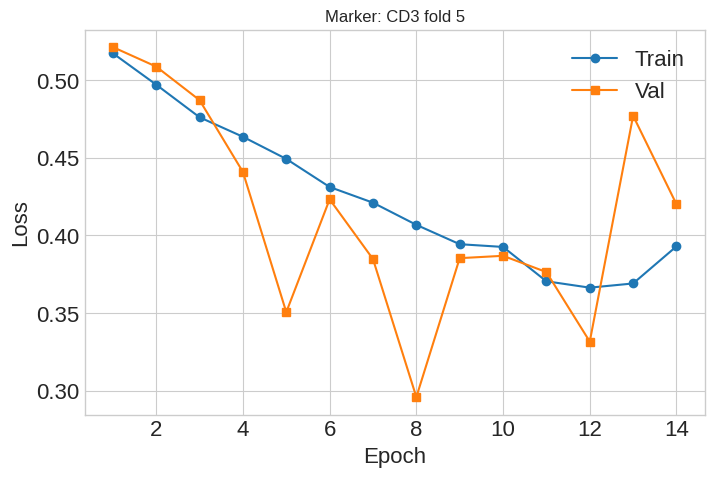

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

-------------Total training time for CD3: 19.31 minutes
Marker: CD20
Starting fold 1 for marker CD20...
Projecting images to 3 PCs captures 74.95% of variance
Epoch   1 | Train 0.5389 | Val 0.5369
  ↳ New best val=0.5369 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.5297 | Val 0.4296
  ↳ New best val=0.4296 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.5216 | Val 0.3951
  ↳ New best val=0.3951 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.5271 | Val 0.3564
  ↳ New best val=0.3564 at epoch 4
  ↳ Saved checkpoint to best_model.pth
Epoch   5 | Train 0.5520 | Val 0.5505
  ↳ No improvement (1/6 patience)
Epoch   6 | Train 0.5646 | Val 0.5656
  ↳ No improvement (2/6 patience)
Epoch   7 | Train 0.5654 | Val 0.5736
  ↳ No improvement (3/6 patience)
Epoch   8 | Train 0.5609 | Val 0.5343
  ↳ No improvement (4/6 patience)
Epoch   9 | Train 0.5580 | Val 0.5545
  ↳ No improvement (5/6 patience)
Epoch  10 | Train 0.5560 | Val 0.

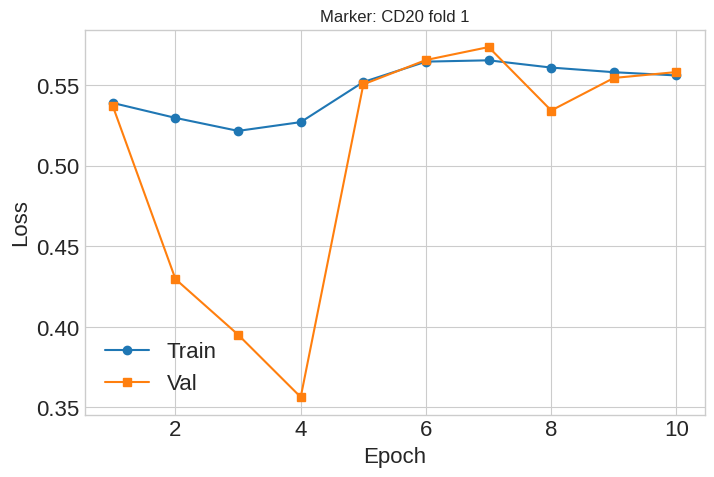

Starting fold 2 for marker CD20...
Projecting images to 3 PCs captures 75.85% of variance
Epoch   1 | Train 0.5024 | Val 0.5418
  ↳ New best val=0.5418 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.4609 | Val 0.4599
  ↳ New best val=0.4599 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4386 | Val 0.3998
  ↳ New best val=0.3998 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.4238 | Val 0.4196
  ↳ No improvement (1/6 patience)
Epoch   5 | Train 0.4267 | Val 0.2576
  ↳ New best val=0.2576 at epoch 5
  ↳ Saved checkpoint to best_model.pth
Epoch   6 | Train 0.4038 | Val 0.3894
  ↳ No improvement (1/6 patience)
Epoch   7 | Train 0.3963 | Val 0.3165
  ↳ No improvement (2/6 patience)
Epoch   8 | Train 0.3774 | Val 0.3675
  ↳ No improvement (3/6 patience)
Epoch   9 | Train 0.4050 | Val 0.3475
  ↳ No improvement (4/6 patience)
Epoch  10 | Train 0.4114 | Val 0.3481
  ↳ No improvement (5/6 patience)
Epoch  11 | Train 0.4144 | Val

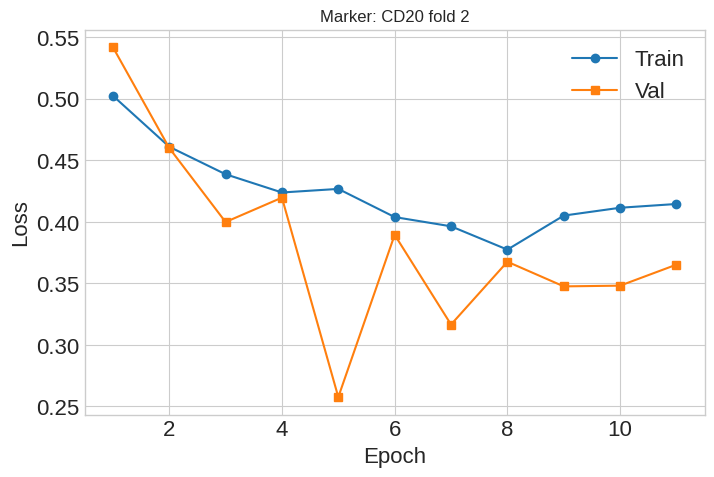

Starting fold 3 for marker CD20...
Projecting images to 3 PCs captures 74.34% of variance
Epoch   1 | Train 0.5281 | Val 0.5341
  ↳ New best val=0.5341 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.5192 | Val 0.4500
  ↳ New best val=0.4500 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.5201 | Val 0.4120
  ↳ New best val=0.4120 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.5077 | Val 0.4776
  ↳ No improvement (1/6 patience)
Epoch   5 | Train 0.5139 | Val 0.5754
  ↳ No improvement (2/6 patience)
Epoch   6 | Train 0.5195 | Val 0.5509
  ↳ No improvement (3/6 patience)
Epoch   7 | Train 0.5160 | Val 0.5439
  ↳ No improvement (4/6 patience)
Epoch   8 | Train 0.5335 | Val 0.5655
  ↳ No improvement (5/6 patience)
Epoch   9 | Train 0.5332 | Val 0.5494
  ↳ No improvement (6/6 patience)
--Early stopping at epoch 9. Best epoch was 3 with val=0.4120
--Restored model weights from epoch 3 (val=0.4120)


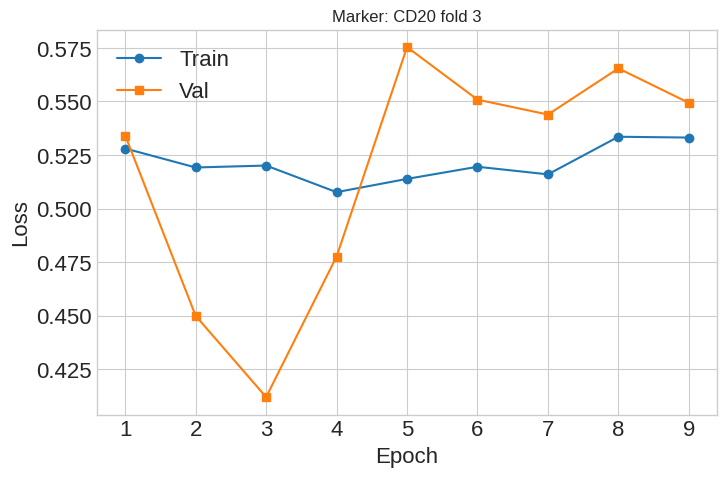

Starting fold 4 for marker CD20...
Projecting images to 3 PCs captures 75.40% of variance
Epoch   1 | Train 0.5229 | Val 0.5596
  ↳ New best val=0.5596 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.5051 | Val 0.5023
  ↳ New best val=0.5023 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Validation batch 1, sample 0 SSIM returned NaN or Inf, skipping batch
Epoch   3 | Train 0.4931 | Val 0.4817
  ↳ New best val=0.4817 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.4876 | Val 0.5035
  ↳ No improvement (1/6 patience)
Epoch   5 | Train 0.4827 | Val 0.5074
  ↳ No improvement (2/6 patience)
Epoch   6 | Train 0.4749 | Val 0.4912
  ↳ No improvement (3/6 patience)
Epoch   7 | Train 0.4677 | Val 0.4864
  ↳ No improvement (4/6 patience)
Epoch   8 | Train 0.5008 | Val 0.5393
  ↳ No improvement (5/6 patience)
Epoch   9 | Train 0.5198 | Val 0.5835
  ↳ No improvement (6/6 patience)
--Early stopping at epoch 9. Best epoch was 3 with val=0.4817
--Restored

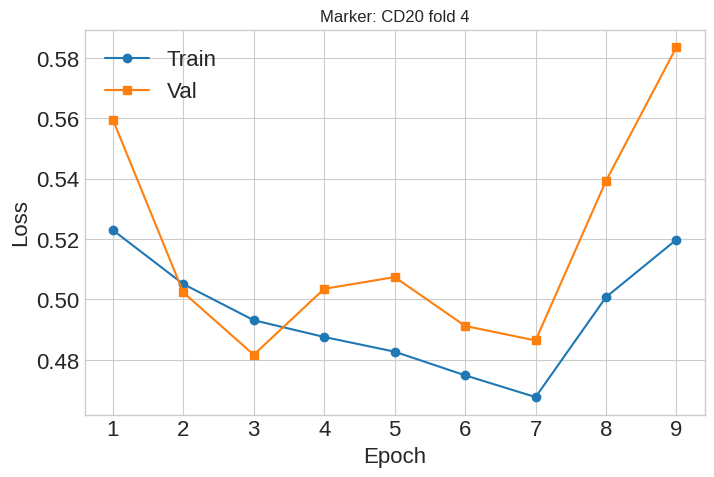

Starting fold 5 for marker CD20...
Projecting images to 3 PCs captures 74.34% of variance
Epoch   1 | Train 0.5177 | Val 0.5581
  ↳ New best val=0.5581 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.4968 | Val 0.5120
  ↳ New best val=0.5120 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4680 | Val 0.4852
  ↳ New best val=0.4852 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.4526 | Val 0.4503
  ↳ New best val=0.4503 at epoch 4
  ↳ Saved checkpoint to best_model.pth
Epoch   5 | Train 0.4469 | Val 0.4560
  ↳ No improvement (1/6 patience)
Epoch   6 | Train 0.4216 | Val 0.4757
  ↳ No improvement (2/6 patience)
Epoch   7 | Train 0.4224 | Val 0.4577
  ↳ No improvement (3/6 patience)
Epoch   8 | Train 0.4103 | Val 0.4153
  ↳ New best val=0.4153 at epoch 8
  ↳ Saved checkpoint to best_model.pth
Epoch   9 | Train 0.4152 | Val 0.4368
  ↳ No improvement (1/6 patience)
Epoch  10 | Train 0.4230 | Val 0.4809
  ↳ No improvement (2/6 

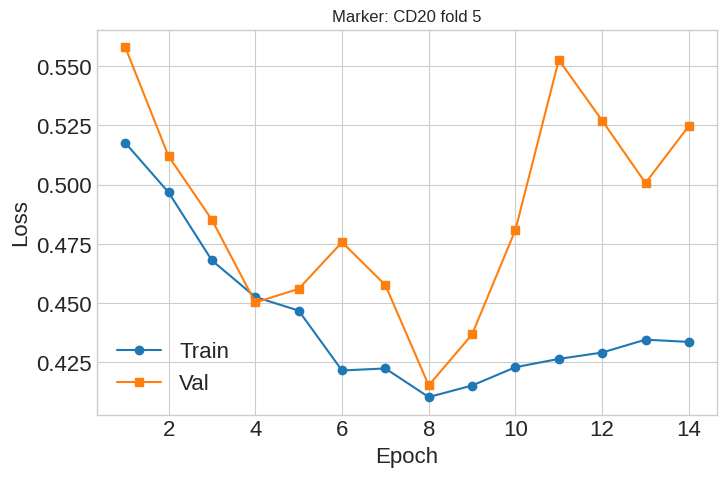

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

-------------Total training time for CD20: 18.14 minutes
Marker: CD45
Starting fold 1 for marker CD45...
Projecting images to 3 PCs captures 75.04% of variance
Epoch   1 | Train 0.5354 | Val 0.5421
  ↳ New best val=0.5421 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.5232 | Val 0.4944
  ↳ New best val=0.4944 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.5159 | Val 0.4510
  ↳ New best val=0.4510 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.5108 | Val 0.4273
  ↳ New best val=0.4273 at epoch 4
  ↳ Saved checkpoint to best_model.pth
Epoch   5 | Train 0.5074 | Val 0.4359
  ↳ No improvement (1/6 patience)
Epoch   6 | Train 0.4967 | Val 0.4334
  ↳ No improvement (2/6 patience)
Epoch   7 | Train 0.4947 | Val 0.5063
  ↳ No improvement (3/6 patience)
Epoch   8 | Train 0.4816 | Val 0.3575
  ↳ New best val=0.3575 at epoch 8
  ↳ Saved checkpoint to best_model.pth
Epoch   9 | Train 0.4787 | Val 0.3736
  ↳ No improvement (1/6 pa

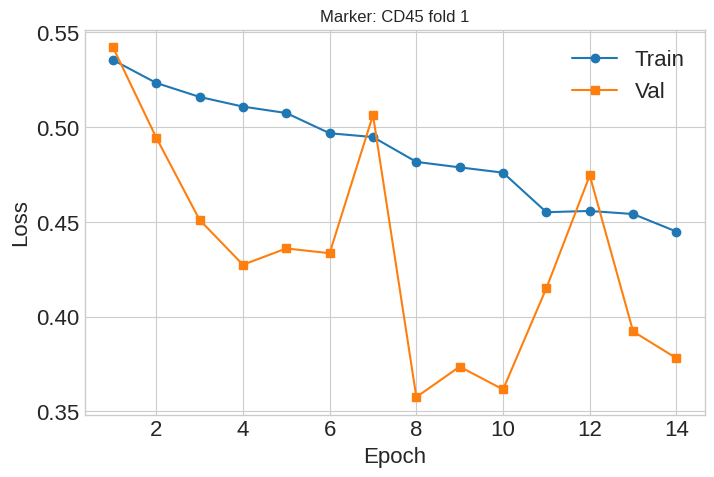

Starting fold 2 for marker CD45...
Projecting images to 3 PCs captures 75.93% of variance
Epoch   1 | Train 0.5063 | Val 0.5330
  ↳ New best val=0.5330 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.4932 | Val 0.5334
  ↳ No improvement (1/6 patience)
Epoch   3 | Train 0.4821 | Val 0.4583
  ↳ New best val=0.4583 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.4844 | Val 0.4287
  ↳ New best val=0.4287 at epoch 4
  ↳ Saved checkpoint to best_model.pth
Epoch   5 | Train 0.4810 | Val 0.4487
  ↳ No improvement (1/6 patience)
Epoch   6 | Train 0.4743 | Val 0.4759
  ↳ No improvement (2/6 patience)
Epoch   7 | Train 0.4803 | Val 0.4460
  ↳ No improvement (3/6 patience)
Epoch   8 | Train 0.4835 | Val 0.4666
  ↳ No improvement (4/6 patience)
Epoch   9 | Train 0.4950 | Val 0.5255
  ↳ No improvement (5/6 patience)
Epoch  10 | Train 0.5035 | Val 0.5460
  ↳ No improvement (6/6 patience)
--Early stopping at epoch 10. Best epoch was 4 with val=0.4287
--Resto

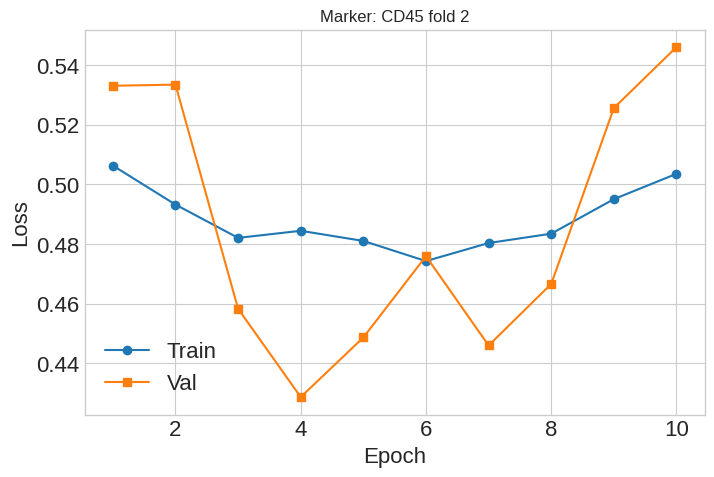

Starting fold 3 for marker CD45...
Projecting images to 3 PCs captures 74.40% of variance
Epoch   1 | Train 0.5320 | Val 0.5219
  ↳ New best val=0.5219 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.5252 | Val 0.4784
  ↳ New best val=0.4784 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train -inf | Val 0.4222
  ↳ New best val=0.4222 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.5101 | Val 0.4441
  ↳ No improvement (1/6 patience)
Epoch   5 | Train 0.5014 | Val 0.4474
  ↳ No improvement (2/6 patience)
Epoch   6 | Train 0.5001 | Val 0.4148
  ↳ New best val=0.4148 at epoch 6
  ↳ Saved checkpoint to best_model.pth
Epoch   7 | Train 0.4955 | Val 0.4482
  ↳ No improvement (1/6 patience)
Epoch   8 | Train 0.5235 | Val 0.5005
  ↳ No improvement (2/6 patience)
Epoch   9 | Train 0.5564 | Val 0.5199
  ↳ No improvement (3/6 patience)
Epoch  10 | Train 0.5628 | Val 0.5471
  ↳ No improvement (4/6 patience)
Epoch  11 | Train 0.5649 | Val 0

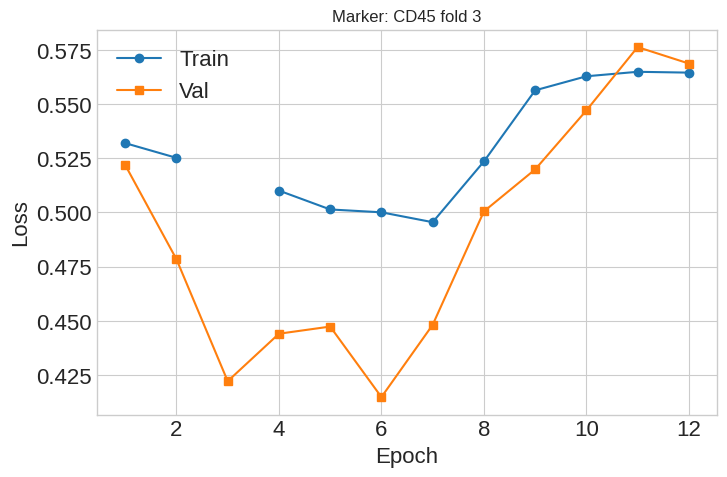

Starting fold 4 for marker CD45...
Projecting images to 3 PCs captures 75.51% of variance
Epoch   1 | Train 0.5155 | Val 0.5374
  ↳ New best val=0.5374 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.5199 | Val 0.5318
  ↳ New best val=0.5318 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.5150 | Val 0.5013
  ↳ New best val=0.5013 at epoch 3
  ↳ Saved checkpoint to best_model.pth
Epoch   4 | Train 0.5087 | Val 0.4849
  ↳ New best val=0.4849 at epoch 4
  ↳ Saved checkpoint to best_model.pth
Epoch   5 | Train 0.4972 | Val 0.4937
  ↳ No improvement (1/6 patience)
Epoch   6 | Train 0.4892 | Val 0.4620
  ↳ New best val=0.4620 at epoch 6
  ↳ Saved checkpoint to best_model.pth
Epoch   7 | Train 0.4766 | Val 0.4888
  ↳ No improvement (1/6 patience)
Epoch   8 | Train 0.4866 | Val 0.4594
  ↳ New best val=0.4594 at epoch 8
  ↳ Saved checkpoint to best_model.pth
Epoch   9 | Train 0.5021 | Val 0.4369
  ↳ New best val=0.4369 at epoch 9
  ↳ Saved checkpoint 

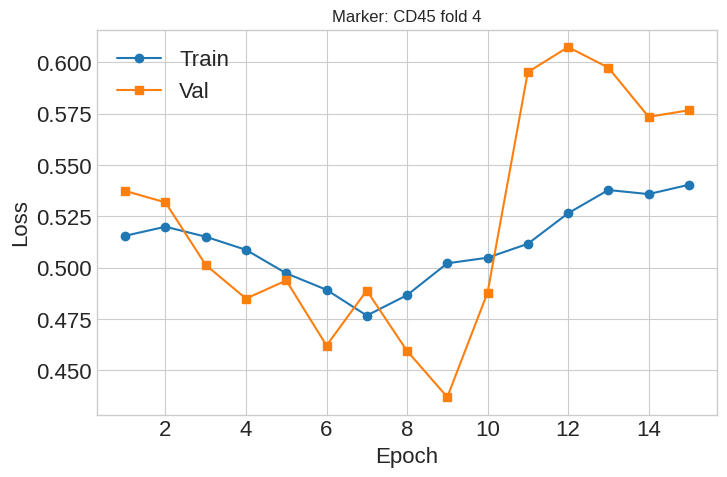

Starting fold 5 for marker CD45...
Projecting images to 3 PCs captures 74.44% of variance
Epoch   1 | Train 0.5147 | Val 0.5623
  ↳ New best val=0.5623 at epoch 1
  ↳ Saved checkpoint to best_model.pth
Epoch   2 | Train 0.4832 | Val 0.5095
  ↳ New best val=0.5095 at epoch 2
  ↳ Saved checkpoint to best_model.pth
Epoch   3 | Train 0.4881 | Val 0.5135
  ↳ No improvement (1/6 patience)
Epoch   4 | Train 0.4810 | Val 0.3566
  ↳ New best val=0.3566 at epoch 4
  ↳ Saved checkpoint to best_model.pth
Epoch   5 | Train 0.4765 | Val 0.3720
  ↳ No improvement (1/6 patience)
Epoch   6 | Train 0.4788 | Val 0.4319
  ↳ No improvement (2/6 patience)
Epoch   7 | Train 0.4731 | Val 0.4448
  ↳ No improvement (3/6 patience)
Epoch   8 | Train 0.4942 | Val 0.5288
  ↳ No improvement (4/6 patience)
Epoch   9 | Train 0.4909 | Val 0.5295
  ↳ No improvement (5/6 patience)
Epoch  10 | Train 0.4850 | Val 0.5348
  ↳ No improvement (6/6 patience)
--Early stopping at epoch 10. Best epoch was 4 with val=0.3566
--Resto

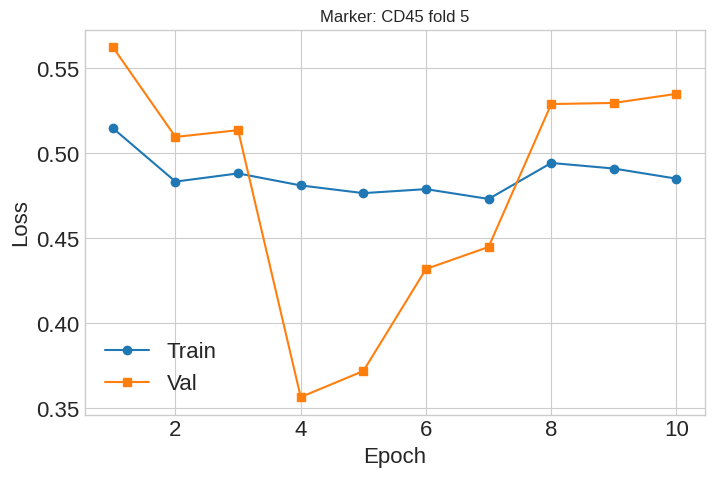

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

-------------Total training time for CD45: 18.47 minutes
Marker: CD68
Starting fold 1 for marker CD68...


In [ ]:
control = [0, 33, 34] #histone_h3, dna1, dna2

marker_tasks = [
    #("ki67", 25, control),
    #("CD3", 13, control),
    #("CD20", 22, control),
    #("CD45", 20, control),
    ("CD68", 7, control),
    ("sma", 9, control),
    ("pan_cytokeratin", 31, control),
    ("cytokeratin_5", 2, control),
    ("cytokeratin_8_18", 5, control),
]

#j_results = []
#K-fold with K=5 takes ~20 min per marker
for title, target_idx, control_markers_indices in marker_tasks:
    start_time = time.time()
    print(f"Marker: {title}")
    res = main(target_idx, control_markers_indices, title=title)
    df_res = pd.DataFrame([res])
    df_res.to_csv(f"j_results_{title}_5fold.csv", index=False)
    files.download(f"j_results_{title}_5fold.csv")
    total_time = time.time() - start_time
    print(f"--Total training time for {title}: {total_time/60:.2f} minutes")


In [ ]:
#results of 3 fold
j_df.head()

,marker,RMSE_mean,RMSE_std,PSNR_mean,PSNR_std,Pearson_mean,Pearson_std
0,ki67,0.201788,0.091959,16.288704,3.515317,-0.004670,0.008610
1,CD3,0.214980,0.090148,15.760861,4.415705,-0.025912,0.011797
2,CD20,0.257997,0.034374,14.223371,1.705488,-0.034409,0.011556
3,CD45,0.171048,0.071903,17.994005,3.230359,0.050093,0.067412
4,CD68,0.315677,0.038737,11.572738,1.545259,0.005012,0.003712


## Keren 2018

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# 2) Point to your ZIP inside Drive
DRIVE_ZIP = "/content/drive/MyDrive/Spatial/Keren/data.zip"
WORK_DIR = "/content/data"
ZIP_LOCAL = f"{WORK_DIR}/data.zip"
UNZIP_DIR = f"{WORK_DIR}/data"

if os.path.exists(WORK_DIR):
    shutil.rmtree(WORK_DIR)

# 3) Copy ZIP from Drive → VM local disk (faster than reading directly from FUSE)
!mkdir -p "{WORK_DIR}"
!rsync -ah --progress "{DRIVE_ZIP}" "{ZIP_LOCAL}"

# 4) Unzip locally (fast I/O)
!mkdir -p "{UNZIP_DIR}"
!unzip -q "{ZIP_LOCAL}" -d "{UNZIP_DIR}"

# 5) Sanity checks
!echo "Files:" && find "{UNZIP_DIR}" -type f | wc -l
!du -sh "{UNZIP_DIR}"

Mounted at /content/drive
sending incremental file list
data.zip
        436.83M 100%   44.23MB/s    0:00:09 (xfr#1, to-chk=0/1)
Files:
30
419M	/content/data/data


In [ ]:
#index list for marker:
markers = pd.read_parquet("panel.parquet", engine="pyarrow")
markers["target"]

,target
channel_index,
0,ds_dna
1,vimentin
2,sma
3,fox_p3
4,lag3
5,cd4
6,cd16
7,cd56
8,pd1


## Comparison

In [ ]:
d_df = pd.read_csv("d_results_7Sep.csv")
j_df = pd.read_csv("j_results.csv")


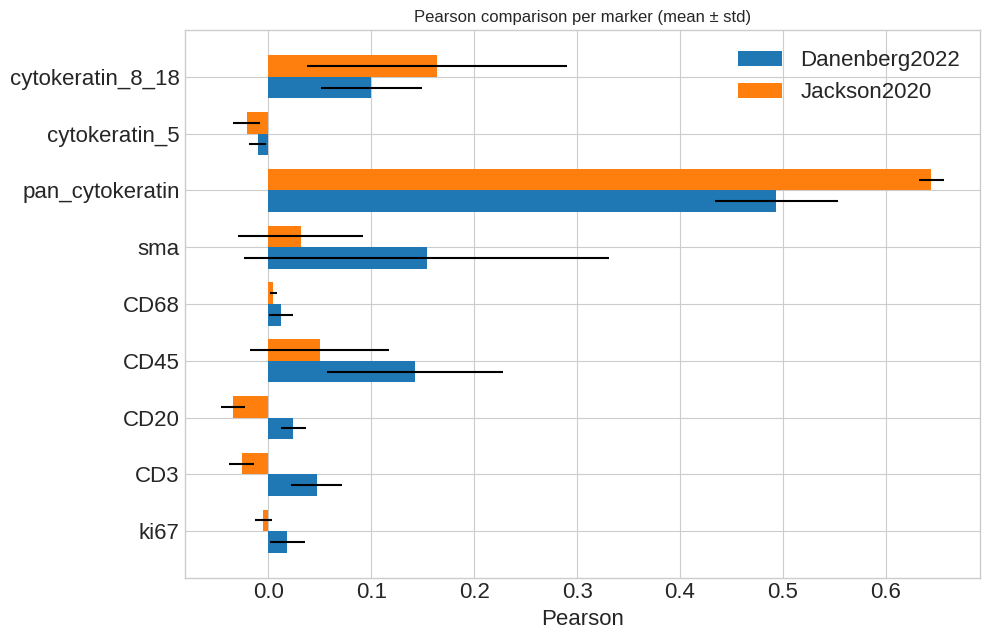

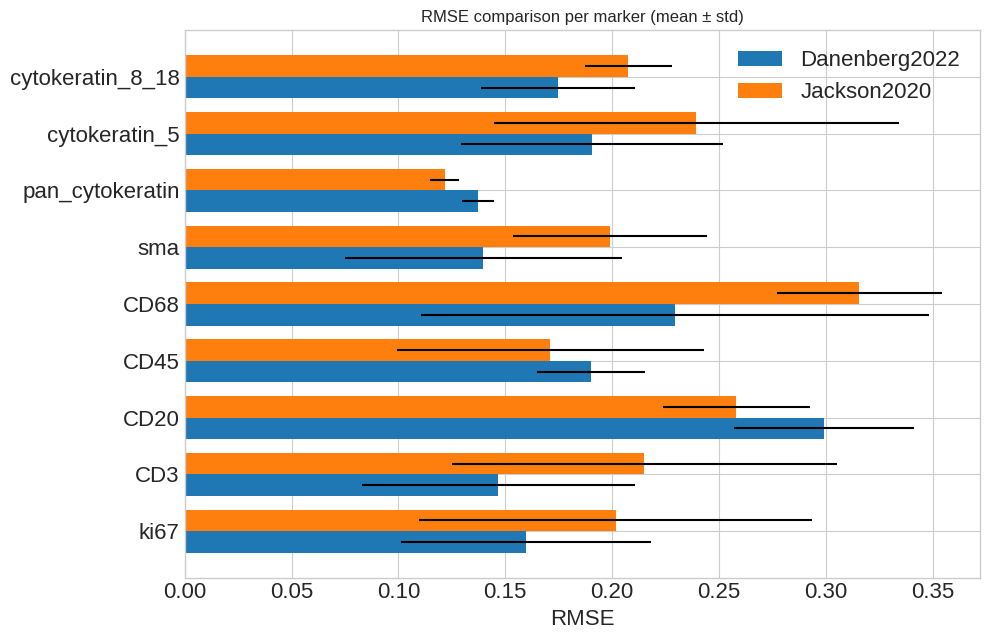

In [ ]:
plot_marker_comparison_hbar(d_df, j_df, metric="Pearson", label_A="Danenberg2022", label_B="Jackson2020")
plot_marker_comparison_hbar(d_df, j_df, metric="R2", label_A="Danenberg2022", label_B="Jackson2020")
